# Training Generative Adversarial Networks (GANs) in PyTorch

### Part 7 of "Deep Learning with Pytorch: Zero to GANs"

This tutorial series is a hands-on beginner-friendly introduction to deep learning using [PyTorch](https://pytorch.org), an open-source neural networks library. These tutorials take a practical and coding-focused approach. The best way to learn the material is to execute the code and experiment with it yourself. Check out the full series here:

1. [PyTorch Basics: Tensors & Gradients](https://jovian.ai/aakashns/01-pytorch-basics)
2. [Gradient Descent & Linear Regression](https://jovian.ai/aakashns/02-linear-regression)
3. [Working with Images & Logistic Regression](https://jovian.ai/aakashns/03-logistic-regression) 
4. [Training Deep Neural Networks on a GPU](https://jovian.ai/aakashns/04-feedforward-nn)
5. [Image Classification using Convolutional Neural Networks](https://jovian.ai/aakashns/05-cifar10-cnn)
6. [Data Augmentation, Regularization and ResNets](https://jovian.ai/aakashns/05b-cifar10-resnet)
7. [Generating Images using Generative Adversarial Networks](https://jovian.ai/aakashns/06b-anime-dcgan/)


### How to run the code

This tutorial is an executable [Jupyter notebook](https://jupyter.org) hosted on [Jovian](https://www.jovian.ai). You can _run_ this tutorial and experiment with the code examples in a couple of ways: *using free online resources* (recommended) or *on your computer*.

#### Option 1: Running using free online resources (1-click, recommended)

The easiest way to start executing the code is to click the **Run** button at the top of this page and select **Run on Colab**. [Google Colab](https://colab.research.google.com) is a free online platform for running Jupyter notebooks using Google's cloud infrastructure. You can also select "Run on Binder" or "Run on Kaggle" if you face issues running the notebook on Google Colab. 


#### Option 2: Running on your computer locally

To run the code on your computer locally, you'll need to set up [Python](https://www.python.org), download the notebook and install the required libraries. We recommend using the [Conda](https://docs.conda.io/projects/conda/en/latest/user-guide/install/) distribution of Python. Click the **Run** button at the top of this page, select the **Run Locally** option, and follow the instructions.

### Using a GPU for faster training

You can use a [Graphics Processing Unit](https://en.wikipedia.org/wiki/Graphics_processing_unit) (GPU) to train your models faster if your execution platform is connected to a GPU manufactured by NVIDIA. Follow these instructions to use a GPU on the platform of your choice:

* _Google Colab_: Use the menu option "Runtime > Change Runtime Type" and select "GPU" from the "Hardware Accelerator" dropdown.
* _Kaggle_: In the "Settings" section of the sidebar, select "GPU" from the "Accelerator" dropdown. Use the button on the top-right to open the sidebar.
* _Binder_: Notebooks running on Binder cannot use a GPU, as the machines powering Binder aren't connected to any GPUs.
* _Linux_: If your laptop/desktop has an NVIDIA GPU (graphics card), make sure you have installed the [NVIDIA CUDA drivers](https://docs.nvidia.com/cuda/cuda-installation-guide-linux/index.html).
* _Windows_: If your laptop/desktop has an NVIDIA GPU (graphics card), make sure you have installed the [NVIDIA CUDA drivers](https://docs.nvidia.com/cuda/cuda-installation-guide-microsoft-windows/index.html).
* _macOS_: macOS is not compatible with NVIDIA GPUs


If you do not have access to a GPU or aren't sure what it is, don't worry, you can execute all the code in this tutorial just fine without a GPU.

# Introduction to Generative Modeling

Deep neural networks are used mainly for supervised learning: classification or regression. Generative Adversarial Networks or GANs, however, use neural networks for a very different purpose: Generative modeling

> Generative modeling is an unsupervised learning task in machine learning that involves automatically discovering and learning the regularities or patterns in input data in such a way that the model can be used to generate or output new examples that plausibly could have been drawn from the original dataset. - [Source](https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/)

To get a sense of the power of generative models, just visit [thispersondoesnotexist.com](https://thispersondoesnotexist.com). Every time you reload the page, a new image of a person's face is generated on the fly. The results are pretty fascinating:

<img src="https://imgix.bustle.com/inverse/4b/17/8f/0e/cf91/4506/99c7/e6a491c5d4ac/these-people-are-not-real--they-were-produced-by-our-generator-that-allows-control-over-different-a.png" style="width:480px; margin-bottom:32px"/>

While there are many approaches used for generative modeling, a Generative Adversarial Network takes the following approach: 

<img src="https://i.imgur.com/6NMdO9u.png" style="width:420px; margin-bottom:32px"/>

There are two neural networks: a *Generator* and a *Discriminator*. The generator generates a "fake" sample given a random vector/matrix, and the discriminator attempts to detect whether a given sample is "real" (picked from the training data) or "fake" (generated by the generator). Training happens in tandem: we train the discriminator for a few epochs, then train the generator for a few epochs, and repeat. This way both the generator and the discriminator get better at doing their jobs. 

GANs however, can be notoriously difficult to train, and are extremely sensitive to hyperparameters, activation functions and regularization. In this tutorial, we'll train a GAN to generate images of anime characters' faces.

<img src="https://i.imgur.com/NaKtJs0.png" width="360" style="margin-bottom:32px"/>


We'll use the [Anime Face Dataset](https://github.com/Mckinsey666/Anime-Face-Dataset), which consists of over 63,000 cropped anime faces. Note that generative modeling is an unsupervised learning task, so the images do not have any labels. Most of the code in this tutorial is based [on this notebook](https://www.kaggle.com/splcher/starter-anime-face-dataset). 

In [1]:
project_name = '06b-anime-dcgan'

In [2]:
# Uncomment and run the appropriate command for your operating system, if required
# No installation is reqiured on Google Colab / Kaggle notebooks

# Linux / Binder / Windows (No GPU)
# !pip install numpy matplotlib torch==1.7.0+cpu torchvision==0.8.1+cpu torchaudio==0.7.0 -f https://download.pytorch.org/whl/torch_stable.html

# Linux / Windows (GPU)
# pip install numpy matplotlib torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html
 
# MacOS (NO GPU)
# !pip install numpy matplotlib torch torchvision torchaudio

## Downloading and Exploring the Data

We can use the [`opendatasets`](https://github.com/JovianML/opendatasets) library to download the [dataset](https://www.kaggle.com/splcher/animefacedataset) from Kaggle. `opendatasets` uses the [Kaggle Official API](https://github.com/Kaggle/kaggle-api) for downloading datasets from Kaggle.  Follow these steps to find your API credentials:

1. Sign in to  [https://kaggle.com/](https://kaggle.com),  then click on your profile picture on the top right and select "My Account" from the menu.

2. Scroll down to the "API" section and click "Create New API Token". This will download a file `kaggle.json` with the following contents:

```
{"username":"YOUR_KAGGLE_USERNAME","key":"YOUR_KAGGLE_KEY"}
```

3. When you run `opendatsets.download`, you will be asked to enter your username & Kaggle API, which you can get from the file downloaded in step 2.

Note that you need to download the `kaggle.json` file only once. On Google Colab, you can also upload the `kaggle.json` file using the files tab, and the credentials will be read automatically.


In [370]:
!pip install opendatasets --upgrade --quiet

DEPRECATION: textract 1.6.5 has a non-standard dependency specifier extract-msg<=0.29.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of textract or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063

[notice] A new release of pip is available: 24.0 -> 24.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/paramaggarwal/fashion-product-images-small'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: Saad_._Ashraf12
Your Kaggle Key: ········
Dataset URL: https://www.kaggle.com/datasets/paramaggarwal/fashion-product-images-small


100%|██████████| 565M/565M [00:36<00:00, 16.1MB/s] 


The dataset has a single folder called `images` which contains all 63,000+ images in JPG format.

In [3]:
import os

DATA_DIR = './people-clothing-segmentation'
print(os.listdir(DATA_DIR))

['images']


In [4]:
print(os.listdir(DATA_DIR+'/images')[:10])

['img_0001.png', 'img_0002.png', 'img_0003.png', 'img_0004.png', 'img_0005.png', 'img_0006.png', 'img_0007.png', 'img_0008.png', 'img_0009.png', 'img_0010.png']


Let's load this dataset using the `ImageFolder` class from `torchvision`. We will also resize and crop the images to 64x64 px, and normalize the pixel values with a mean & standard deviation of 0.5 for each channel. This will ensure that pixel values are in the range `(-1, 1)`, which is more  convenient for training the discriminator. We will also create a data loader to load the data in batches.

In [5]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [6]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [7]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

Let's create helper functions to denormalize the image tensors and display some sample images from a training batch.

In [8]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [9]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [10]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

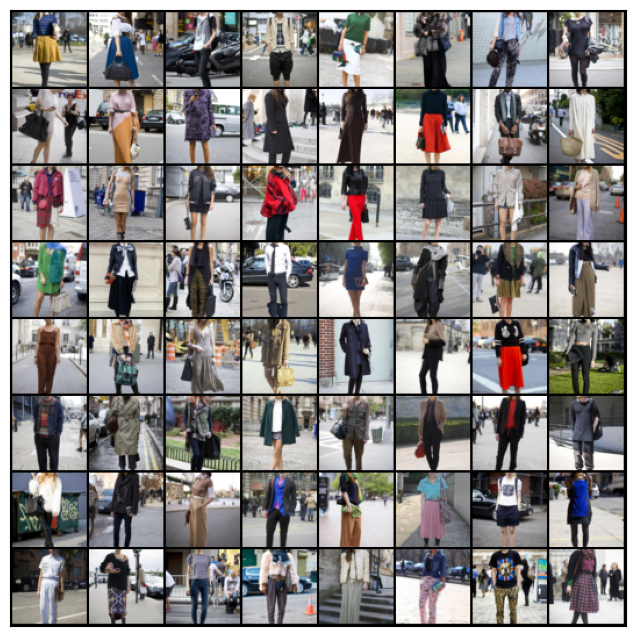

In [11]:
show_batch(train_dl)

In [117]:
!pip install jovian --upgrade --quiet

DEPRECATION: textract 1.6.5 has a non-standard dependency specifier extract-msg<=0.29.*. pip 24.1 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of textract or contact the author to suggest that they release a version with a conforming dependency specifiers. Discussion can be found at https://github.com/pypa/pip/issues/12063

[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [118]:
import jovian

In [50]:
jovian.commit(project=project_name, environment=None)

<IPython.core.display.Javascript object>

[jovian] Updating notebook "nathan551212/06b-anime-dcgan" on https://jovian.com/
[jovian] Attaching records (metrics, hyperparameters, dataset etc.)
[jovian] Committed successfully! https://jovian.com/nathan551212/06b-anime-dcgan


'https://jovian.com/nathan551212/06b-anime-dcgan'

## Using a GPU

To seamlessly use a GPU, if one is available, we define a couple of helper functions (`get_default_device` & `to_device`) and a helper class `DeviceDataLoader` to move our model & data to the GPU, if one is available.

In [12]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

Based on where you're running this notebook, your default device could be a CPU (`torch.device('cpu')`) or a GPU (`torch.device('cuda')`).

In [13]:
device = get_default_device()
device

device(type='cuda')

We can now move our training data loader using `DeviceDataLoader` for automatically transferring batches of data to the GPU (if available).

In [14]:
train_dl = DeviceDataLoader(train_dl, device)

## Discriminator Network

The discriminator takes an image as input, and tries to classify it as "real" or "generated". In this sense, it's like any other neural network. We'll use a convolutional neural networks (CNN) which outputs a single number output for every image. We'll use stride of 2 to progressively reduce the size of the output feature map.

![](https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides_odd.gif)

In [15]:
import torch.nn as nn

In [16]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

Note that we're using the Leaky ReLU activation for the discriminator.

<img src="https://cdn-images-1.medium.com/max/1600/1*ypsvQH7kvtI2BhzR2eT_Sw.png" width="420">


>  Different from the regular ReLU function, Leaky ReLU allows the pass of a small gradient signal for negative values. As a result, it makes the gradients from the discriminator flows stronger into the generator. Instead of passing a gradient (slope) of 0 in the back-prop pass, it passes a small negative gradient.  - [Source](https://sthalles.github.io/advanced_gans/)

Just like any other binary classification model, the output of the discriminator is a single number between 0 and 1, which can be interpreted as the probability of the input image being real i.e. picked from the original dataset.

Let's move the discriminator model to the chosen device.

In [17]:
discriminator = to_device(discriminator, device)

## Generator Network

The input to the generator is typically a vector or a matrix of random numbers (referred to as a latent tensor) which is used as a seed for generating an image. The generator will convert a latent tensor of shape `(128, 1, 1)` into an image tensor of shape `3 x 28 x 28`. To achive this, we'll use the `ConvTranspose2d` layer from PyTorch, which is performs to as a *transposed convolution* (also referred to as a *deconvolution*). [Learn more](https://github.com/vdumoulin/conv_arithmetic/blob/master/README.md#transposed-convolution-animations)

![](https://i.imgur.com/DRvK546.gif)

In [18]:
latent_size = 128

In [19]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

We use the TanH activation function for the output layer of the generator.

<img src="https://nic.schraudolph.org/teach/NNcourse/figs/tanh.gif" width="420" >

> "The ReLU activation (Nair & Hinton, 2010) is used in the generator with the exception of the output layer which uses the Tanh function. We observed that using a bounded activation allowed the model to learn more quickly to saturate and cover the color space of the training distribution. Within the discriminator we found the leaky rectified activation (Maas et al., 2013) (Xu et al., 2015) to work well, especially for higher resolution modeling." - [Source](https://stackoverflow.com/questions/41489907/generative-adversarial-networks-tanh)


Note that since the outputs of the TanH activation lie in the range `[-1,1]`, we have applied the similar transformation to the images in the training dataset. Let's generate some outputs using the generator and view them as images by transforming and denormalizing the output.

torch.Size([128, 3, 64, 64])


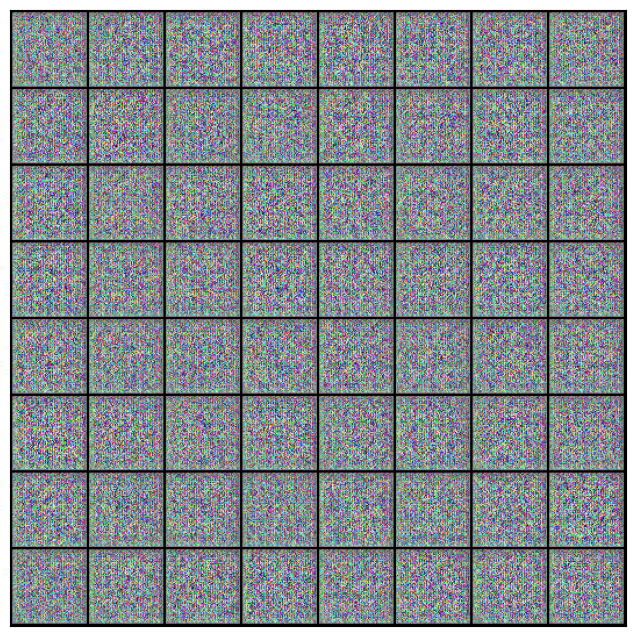

In [20]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

As one might expect, the output from the generator is basically random noise, since we haven't trained it yet. 

Let's move the generator to the chosen device.

In [21]:
generator = to_device(generator, device)

## Discriminator Training

Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

<img src="https://image.slidesharecdn.com/chrishokamp-dublinnlp3-160805110319/95/task-based-learning-for-nlp-going-beyond-cross-entropy-chris-hokamp-10-638.jpg?cb=1470395213" width="420" >

In [22]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

Here are the steps involved in training the discriminator.

- We expect the discriminator to output 1 if the image was picked from the real MNIST dataset, and 0 if it was generated using the generator network. 

- We first pass a batch of real images, and compute the loss, setting the target labels to 1. 

- Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0. 

- Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (`opt_d` only affects the `discriminator.parameters()`)

## Generator Training

Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

- We generate a batch of images using the generator, pass the into the discriminator.

- We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator. 

- We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

Here's what this looks like in code.

In [23]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model. We'll also create a helper function to export the generated images.

In [24]:
from torchvision.utils import save_image

In [25]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [26]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.

In [27]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


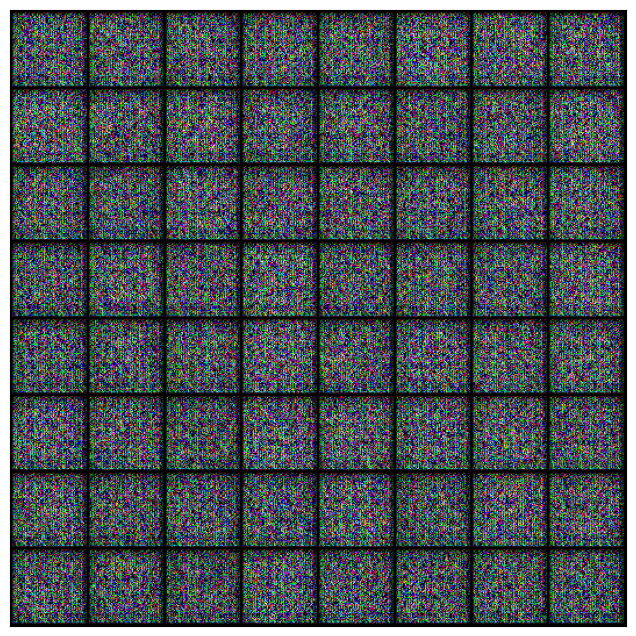

In [28]:
save_samples(0, fixed_latent)

In [31]:
jovian.commit(project=project_name, environment=None)

<IPython.core.display.Javascript object>

[jovian] Updating notebook "nathan551212/06b-anime-dcgan" on https://jovian.com/
[jovian] Committed successfully! https://jovian.com/nathan551212/06b-anime-dcgan


'https://jovian.com/nathan551212/06b-anime-dcgan'

## Full Training Loop

Let's define a `fit` function to train the discriminator and generator in tandem for each batch of training data. We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs. We will also save some sample generated images at regular intervals for inspection.

<img src="https://i.imgur.com/6NMdO9u.png" style="max-width:420px; margin-bottom:32px"/>



In [29]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [31]:
def fit(epochs, lr, start_idx=1, save_interval=25):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
        
        # Save the model checkpoints at every `save_interval` epochs
        if (epoch + 1) % save_interval == 0:
            torch.save(generator.state_dict(), f'G_epoch_{epoch+1}.pth')
            torch.save(discriminator.state_dict(), f'D_epoch_{epoch+1}.pth')
    
    return losses_g, losses_d, real_scores, fake_scores


We are now ready to train the model. Try different learning rates to see if you can maintain the fine balance between the training the generator and the discriminator.

In [32]:
lr = 0.0002
epochs = 2000

In [33]:
jovian.reset()
jovian.log_hyperparams(lr=lr, epochs=epochs)

[jovian] Hyperparams logged.


In [34]:
history = fit(epochs, lr)

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1/2000], loss_g: 6.1490, loss_d: 0.8246, real_score: 0.7759, fake_score: 0.3247
Saving generated-images-0001.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [2/2000], loss_g: 7.9323, loss_d: 0.6788, real_score: 0.8515, fake_score: 0.2965
Saving generated-images-0002.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [3/2000], loss_g: 9.5697, loss_d: 0.6995, real_score: 0.8912, fake_score: 0.4036
Saving generated-images-0003.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [4/2000], loss_g: 12.7664, loss_d: 0.2415, real_score: 0.8334, fake_score: 0.0001
Saving generated-images-0004.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [5/2000], loss_g: 5.7513, loss_d: 0.1386, real_score: 0.8976, fake_score: 0.0043
Saving generated-images-0005.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [6/2000], loss_g: 8.1466, loss_d: 0.1943, real_score: 0.8537, fake_score: 0.0051
Saving generated-images-0006.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [7/2000], loss_g: 11.8280, loss_d: 0.1260, real_score: 0.9018, fake_score: 0.0005
Saving generated-images-0007.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [8/2000], loss_g: 6.2560, loss_d: 0.3845, real_score: 0.9115, fake_score: 0.2240
Saving generated-images-0008.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [9/2000], loss_g: 5.3790, loss_d: 0.1562, real_score: 0.9270, fake_score: 0.0667
Saving generated-images-0009.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [10/2000], loss_g: 6.3207, loss_d: 0.1472, real_score: 0.9107, fake_score: 0.0386
Saving generated-images-0010.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [11/2000], loss_g: 12.1510, loss_d: 0.9704, real_score: 0.9686, fake_score: 0.5859
Saving generated-images-0011.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [12/2000], loss_g: 5.5096, loss_d: 0.6969, real_score: 0.7726, fake_score: 0.3127
Saving generated-images-0012.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [13/2000], loss_g: 7.1919, loss_d: 1.6025, real_score: 0.9395, fake_score: 0.7071
Saving generated-images-0013.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [14/2000], loss_g: 6.3028, loss_d: 0.7621, real_score: 0.9114, fake_score: 0.4592
Saving generated-images-0014.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [15/2000], loss_g: 3.8429, loss_d: 0.5170, real_score: 0.8657, fake_score: 0.2787
Saving generated-images-0015.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [16/2000], loss_g: 4.4329, loss_d: 0.7962, real_score: 0.8252, fake_score: 0.4044
Saving generated-images-0016.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [17/2000], loss_g: 5.3794, loss_d: 0.8022, real_score: 0.8946, fake_score: 0.4628
Saving generated-images-0017.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [18/2000], loss_g: 5.8128, loss_d: 0.7653, real_score: 0.8661, fake_score: 0.4290
Saving generated-images-0018.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [19/2000], loss_g: 6.1395, loss_d: 0.9107, real_score: 0.9228, fake_score: 0.5203
Saving generated-images-0019.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [20/2000], loss_g: 3.0398, loss_d: 0.3632, real_score: 0.8257, fake_score: 0.1181
Saving generated-images-0020.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [21/2000], loss_g: 4.9978, loss_d: 0.5684, real_score: 0.8031, fake_score: 0.2434
Saving generated-images-0021.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [22/2000], loss_g: 3.8541, loss_d: 0.4884, real_score: 0.9394, fake_score: 0.3073
Saving generated-images-0022.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [23/2000], loss_g: 4.6859, loss_d: 0.2851, real_score: 0.9010, fake_score: 0.1507
Saving generated-images-0023.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [24/2000], loss_g: 1.9830, loss_d: 0.2339, real_score: 0.8713, fake_score: 0.0681
Saving generated-images-0024.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [25/2000], loss_g: 4.0848, loss_d: 0.4212, real_score: 0.8837, fake_score: 0.2275
Saving generated-images-0025.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [26/2000], loss_g: 3.8142, loss_d: 0.4928, real_score: 0.7897, fake_score: 0.1751
Saving generated-images-0026.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [27/2000], loss_g: 3.5465, loss_d: 0.6612, real_score: 0.9551, fake_score: 0.4019
Saving generated-images-0027.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [28/2000], loss_g: 3.3017, loss_d: 0.4727, real_score: 0.7819, fake_score: 0.1630
Saving generated-images-0028.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [29/2000], loss_g: 3.7264, loss_d: 0.3458, real_score: 0.8436, fake_score: 0.1395
Saving generated-images-0029.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [30/2000], loss_g: 4.4410, loss_d: 0.3824, real_score: 0.8545, fake_score: 0.1573
Saving generated-images-0030.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [31/2000], loss_g: 4.7692, loss_d: 0.7262, real_score: 0.6189, fake_score: 0.0396
Saving generated-images-0031.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [32/2000], loss_g: 4.6633, loss_d: 0.4124, real_score: 0.8232, fake_score: 0.1434
Saving generated-images-0032.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [33/2000], loss_g: 1.7261, loss_d: 0.5297, real_score: 0.7818, fake_score: 0.1739
Saving generated-images-0033.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [34/2000], loss_g: 3.1352, loss_d: 0.6460, real_score: 0.6485, fake_score: 0.0986
Saving generated-images-0034.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [35/2000], loss_g: 5.5389, loss_d: 0.6641, real_score: 0.8807, fake_score: 0.3764
Saving generated-images-0035.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [36/2000], loss_g: 5.4647, loss_d: 0.4684, real_score: 0.9005, fake_score: 0.2742
Saving generated-images-0036.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [37/2000], loss_g: 5.1214, loss_d: 0.9094, real_score: 0.9272, fake_score: 0.5140
Saving generated-images-0037.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [38/2000], loss_g: 3.1629, loss_d: 0.4407, real_score: 0.7628, fake_score: 0.1124
Saving generated-images-0038.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [39/2000], loss_g: 1.3043, loss_d: 1.0195, real_score: 0.4639, fake_score: 0.0458
Saving generated-images-0039.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [40/2000], loss_g: 3.3720, loss_d: 0.6886, real_score: 0.7001, fake_score: 0.1875
Saving generated-images-0040.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [41/2000], loss_g: 3.7501, loss_d: 0.3565, real_score: 0.8252, fake_score: 0.1145
Saving generated-images-0041.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [42/2000], loss_g: 5.8665, loss_d: 1.1771, real_score: 0.9733, fake_score: 0.6383
Saving generated-images-0042.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [43/2000], loss_g: 4.1415, loss_d: 0.5456, real_score: 0.8546, fake_score: 0.2887
Saving generated-images-0043.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [44/2000], loss_g: 3.9627, loss_d: 0.5005, real_score: 0.7044, fake_score: 0.0779
Saving generated-images-0044.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [45/2000], loss_g: 2.6442, loss_d: 0.5574, real_score: 0.6930, fake_score: 0.1152
Saving generated-images-0045.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [46/2000], loss_g: 2.6133, loss_d: 0.4634, real_score: 0.7575, fake_score: 0.1299
Saving generated-images-0046.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [47/2000], loss_g: 4.4486, loss_d: 0.6654, real_score: 0.8842, fake_score: 0.3605
Saving generated-images-0047.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [48/2000], loss_g: 3.4259, loss_d: 0.5668, real_score: 0.7768, fake_score: 0.2040
Saving generated-images-0048.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [49/2000], loss_g: 3.7758, loss_d: 0.3269, real_score: 0.8557, fake_score: 0.1378
Saving generated-images-0049.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [50/2000], loss_g: 3.4903, loss_d: 0.8003, real_score: 0.5346, fake_score: 0.0553
Saving generated-images-0050.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [51/2000], loss_g: 3.6436, loss_d: 0.3767, real_score: 0.8217, fake_score: 0.1343
Saving generated-images-0051.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [52/2000], loss_g: 7.8726, loss_d: 1.8067, real_score: 0.9597, fake_score: 0.7829
Saving generated-images-0052.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [53/2000], loss_g: 2.8389, loss_d: 0.6067, real_score: 0.7099, fake_score: 0.1938
Saving generated-images-0053.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [54/2000], loss_g: 3.4499, loss_d: 0.6186, real_score: 0.7738, fake_score: 0.2612
Saving generated-images-0054.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [55/2000], loss_g: 4.6553, loss_d: 0.6244, real_score: 0.9119, fake_score: 0.3712
Saving generated-images-0055.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [56/2000], loss_g: 4.9529, loss_d: 0.5398, real_score: 0.8832, fake_score: 0.3098
Saving generated-images-0056.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [57/2000], loss_g: 3.6359, loss_d: 0.9435, real_score: 0.4891, fake_score: 0.0168
Saving generated-images-0057.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [58/2000], loss_g: 3.3821, loss_d: 0.4018, real_score: 0.7628, fake_score: 0.0754
Saving generated-images-0058.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [59/2000], loss_g: 7.7430, loss_d: 1.2348, real_score: 0.9023, fake_score: 0.6177
Saving generated-images-0059.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [60/2000], loss_g: 2.8927, loss_d: 0.5511, real_score: 0.7935, fake_score: 0.2248
Saving generated-images-0060.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [61/2000], loss_g: 3.3745, loss_d: 0.3523, real_score: 0.8113, fake_score: 0.1045
Saving generated-images-0061.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [62/2000], loss_g: 3.8618, loss_d: 0.5935, real_score: 0.7543, fake_score: 0.2190
Saving generated-images-0062.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [63/2000], loss_g: 3.5336, loss_d: 0.3314, real_score: 0.8853, fake_score: 0.1669
Saving generated-images-0063.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [64/2000], loss_g: 3.6603, loss_d: 1.0656, real_score: 0.4366, fake_score: 0.0078
Saving generated-images-0064.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [65/2000], loss_g: 3.1797, loss_d: 1.1766, real_score: 0.3881, fake_score: 0.0070
Saving generated-images-0065.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [66/2000], loss_g: 3.6612, loss_d: 0.7950, real_score: 0.5474, fake_score: 0.0288
Saving generated-images-0066.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [67/2000], loss_g: 3.5532, loss_d: 0.4826, real_score: 0.9455, fake_score: 0.3178
Saving generated-images-0067.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [68/2000], loss_g: 2.3254, loss_d: 0.7012, real_score: 0.5652, fake_score: 0.0220
Saving generated-images-0068.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [69/2000], loss_g: 7.6871, loss_d: 1.2563, real_score: 0.9577, fake_score: 0.6347
Saving generated-images-0069.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [70/2000], loss_g: 2.6989, loss_d: 0.3449, real_score: 0.8523, fake_score: 0.1368
Saving generated-images-0070.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [71/2000], loss_g: 4.9409, loss_d: 0.6345, real_score: 0.9251, fake_score: 0.3869
Saving generated-images-0071.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [72/2000], loss_g: 3.3568, loss_d: 0.5228, real_score: 0.7708, fake_score: 0.1926
Saving generated-images-0072.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [73/2000], loss_g: 3.8417, loss_d: 0.4325, real_score: 0.9447, fake_score: 0.2767
Saving generated-images-0073.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [74/2000], loss_g: 6.5562, loss_d: 0.7273, real_score: 0.9149, fake_score: 0.4179
Saving generated-images-0074.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [75/2000], loss_g: 7.0065, loss_d: 0.6816, real_score: 0.9514, fake_score: 0.4197
Saving generated-images-0075.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [76/2000], loss_g: 3.7787, loss_d: 0.8846, real_score: 0.4872, fake_score: 0.0130
Saving generated-images-0076.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [77/2000], loss_g: 2.5322, loss_d: 0.9531, real_score: 0.4949, fake_score: 0.0289
Saving generated-images-0077.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [78/2000], loss_g: 5.1802, loss_d: 0.6925, real_score: 0.9537, fake_score: 0.4263
Saving generated-images-0078.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [79/2000], loss_g: 4.5768, loss_d: 0.4372, real_score: 0.8552, fake_score: 0.2066
Saving generated-images-0079.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [80/2000], loss_g: 2.3086, loss_d: 1.2494, real_score: 0.3949, fake_score: 0.0155
Saving generated-images-0080.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [81/2000], loss_g: 3.2009, loss_d: 1.1002, real_score: 0.4729, fake_score: 0.0116
Saving generated-images-0081.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [82/2000], loss_g: 3.0221, loss_d: 0.6533, real_score: 0.6005, fake_score: 0.0464
Saving generated-images-0082.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [83/2000], loss_g: 5.2568, loss_d: 0.7376, real_score: 0.9228, fake_score: 0.4306
Saving generated-images-0083.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [84/2000], loss_g: 4.2061, loss_d: 0.3838, real_score: 0.8362, fake_score: 0.1531
Saving generated-images-0084.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [85/2000], loss_g: 4.4556, loss_d: 0.4691, real_score: 0.6898, fake_score: 0.0139
Saving generated-images-0085.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [86/2000], loss_g: 4.0444, loss_d: 0.2234, real_score: 0.8877, fake_score: 0.0867
Saving generated-images-0086.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [87/2000], loss_g: 4.9004, loss_d: 0.2623, real_score: 0.8544, fake_score: 0.0767
Saving generated-images-0087.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [88/2000], loss_g: 3.1828, loss_d: 0.9431, real_score: 0.4986, fake_score: 0.0466
Saving generated-images-0088.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [89/2000], loss_g: 2.1678, loss_d: 0.4630, real_score: 0.8363, fake_score: 0.2081
Saving generated-images-0089.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [90/2000], loss_g: 2.7593, loss_d: 0.4919, real_score: 0.6890, fake_score: 0.0642
Saving generated-images-0090.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [91/2000], loss_g: 4.6115, loss_d: 0.6056, real_score: 0.8219, fake_score: 0.2942
Saving generated-images-0091.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [92/2000], loss_g: 3.2208, loss_d: 0.6749, real_score: 0.5814, fake_score: 0.0286
Saving generated-images-0092.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [93/2000], loss_g: 3.3723, loss_d: 0.3681, real_score: 0.8048, fake_score: 0.1050
Saving generated-images-0093.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [94/2000], loss_g: 5.5705, loss_d: 0.7440, real_score: 0.9710, fake_score: 0.4474
Saving generated-images-0094.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [95/2000], loss_g: 3.9733, loss_d: 0.4122, real_score: 0.8346, fake_score: 0.1704
Saving generated-images-0095.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [96/2000], loss_g: 3.6980, loss_d: 0.5262, real_score: 0.6954, fake_score: 0.0708
Saving generated-images-0096.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [97/2000], loss_g: 4.9804, loss_d: 0.5023, real_score: 0.8745, fake_score: 0.2705
Saving generated-images-0097.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [98/2000], loss_g: 3.3048, loss_d: 0.5260, real_score: 0.7688, fake_score: 0.1587
Saving generated-images-0098.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [99/2000], loss_g: 4.4184, loss_d: 0.5589, real_score: 0.8278, fake_score: 0.2740
Saving generated-images-0099.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [100/2000], loss_g: 6.8141, loss_d: 0.6275, real_score: 0.9156, fake_score: 0.3745
Saving generated-images-0100.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [101/2000], loss_g: 4.4304, loss_d: 0.3902, real_score: 0.7654, fake_score: 0.0799
Saving generated-images-0101.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [102/2000], loss_g: 3.7879, loss_d: 1.1364, real_score: 0.4168, fake_score: 0.0091
Saving generated-images-0102.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [103/2000], loss_g: 4.2766, loss_d: 0.4907, real_score: 0.8599, fake_score: 0.2560
Saving generated-images-0103.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [104/2000], loss_g: 4.8269, loss_d: 0.6154, real_score: 0.8792, fake_score: 0.3273
Saving generated-images-0104.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [105/2000], loss_g: 5.7980, loss_d: 0.8769, real_score: 0.9299, fake_score: 0.4846
Saving generated-images-0105.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [106/2000], loss_g: 4.5379, loss_d: 0.3256, real_score: 0.9126, fake_score: 0.1898
Saving generated-images-0106.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [107/2000], loss_g: 3.0968, loss_d: 0.4160, real_score: 0.7420, fake_score: 0.0747
Saving generated-images-0107.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [108/2000], loss_g: 4.6257, loss_d: 0.5048, real_score: 0.9034, fake_score: 0.2994
Saving generated-images-0108.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [109/2000], loss_g: 4.9556, loss_d: 0.3665, real_score: 0.9183, fake_score: 0.2156
Saving generated-images-0109.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [110/2000], loss_g: 2.5709, loss_d: 0.5784, real_score: 0.6379, fake_score: 0.0517
Saving generated-images-0110.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [111/2000], loss_g: 6.9520, loss_d: 0.8664, real_score: 0.9050, fake_score: 0.4665
Saving generated-images-0111.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [112/2000], loss_g: 3.3568, loss_d: 0.4941, real_score: 0.7816, fake_score: 0.1791
Saving generated-images-0112.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [113/2000], loss_g: 3.8285, loss_d: 0.3141, real_score: 0.8303, fake_score: 0.0970
Saving generated-images-0113.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [114/2000], loss_g: 3.3797, loss_d: 0.3504, real_score: 0.9446, fake_score: 0.2231
Saving generated-images-0114.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [115/2000], loss_g: 3.7999, loss_d: 0.3699, real_score: 0.7981, fake_score: 0.1047
Saving generated-images-0115.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [116/2000], loss_g: 3.3111, loss_d: 0.3862, real_score: 0.8151, fake_score: 0.1396
Saving generated-images-0116.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [117/2000], loss_g: 3.6182, loss_d: 0.4140, real_score: 0.7879, fake_score: 0.1154
Saving generated-images-0117.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [118/2000], loss_g: 5.3694, loss_d: 0.4964, real_score: 0.9042, fake_score: 0.2917
Saving generated-images-0118.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [119/2000], loss_g: 6.1493, loss_d: 0.5744, real_score: 0.9416, fake_score: 0.3543
Saving generated-images-0119.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [120/2000], loss_g: 3.3492, loss_d: 0.3696, real_score: 0.7780, fake_score: 0.0798
Saving generated-images-0120.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [121/2000], loss_g: 4.3198, loss_d: 0.6178, real_score: 0.9537, fake_score: 0.3625
Saving generated-images-0121.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [122/2000], loss_g: 4.9944, loss_d: 0.4123, real_score: 0.8920, fake_score: 0.2207
Saving generated-images-0122.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [123/2000], loss_g: 3.4548, loss_d: 0.3083, real_score: 0.8069, fake_score: 0.0601
Saving generated-images-0123.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [124/2000], loss_g: 3.1849, loss_d: 0.6110, real_score: 0.8460, fake_score: 0.3012
Saving generated-images-0124.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [125/2000], loss_g: 3.3975, loss_d: 0.4349, real_score: 0.8080, fake_score: 0.1564
Saving generated-images-0125.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [126/2000], loss_g: 4.0213, loss_d: 0.4432, real_score: 0.8483, fake_score: 0.2086
Saving generated-images-0126.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [127/2000], loss_g: 7.2089, loss_d: 0.7690, real_score: 0.9520, fake_score: 0.4621
Saving generated-images-0127.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [128/2000], loss_g: 3.7753, loss_d: 0.4286, real_score: 0.8718, fake_score: 0.2198
Saving generated-images-0128.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [129/2000], loss_g: 2.9894, loss_d: 0.6718, real_score: 0.5772, fake_score: 0.0157
Saving generated-images-0129.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [130/2000], loss_g: 4.3363, loss_d: 0.4243, real_score: 0.9232, fake_score: 0.2591
Saving generated-images-0130.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [131/2000], loss_g: 5.4948, loss_d: 0.4259, real_score: 0.8981, fake_score: 0.2446
Saving generated-images-0131.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [132/2000], loss_g: 3.5266, loss_d: 0.3000, real_score: 0.8008, fake_score: 0.0486
Saving generated-images-0132.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [133/2000], loss_g: 6.2715, loss_d: 0.5311, real_score: 0.9210, fake_score: 0.3070
Saving generated-images-0133.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [134/2000], loss_g: 2.6655, loss_d: 0.4927, real_score: 0.7147, fake_score: 0.0704
Saving generated-images-0134.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [135/2000], loss_g: 4.0027, loss_d: 0.4526, real_score: 0.8165, fake_score: 0.1874
Saving generated-images-0135.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [136/2000], loss_g: 4.5363, loss_d: 0.4697, real_score: 0.9674, fake_score: 0.3091
Saving generated-images-0136.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [137/2000], loss_g: 3.4178, loss_d: 0.3888, real_score: 0.8726, fake_score: 0.1847
Saving generated-images-0137.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [138/2000], loss_g: 3.7070, loss_d: 0.3175, real_score: 0.8820, fake_score: 0.1471
Saving generated-images-0138.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [139/2000], loss_g: 1.8043, loss_d: 0.5918, real_score: 0.6061, fake_score: 0.0182
Saving generated-images-0139.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [140/2000], loss_g: 4.0156, loss_d: 0.6228, real_score: 0.7443, fake_score: 0.1877
Saving generated-images-0140.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [141/2000], loss_g: 4.3922, loss_d: 0.5733, real_score: 0.8523, fake_score: 0.2830
Saving generated-images-0141.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [142/2000], loss_g: 2.9813, loss_d: 0.2450, real_score: 0.8761, fake_score: 0.0889
Saving generated-images-0142.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [143/2000], loss_g: 3.7302, loss_d: 0.3759, real_score: 0.9172, fake_score: 0.2247
Saving generated-images-0143.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [144/2000], loss_g: 4.0163, loss_d: 0.2512, real_score: 0.8918, fake_score: 0.1145
Saving generated-images-0144.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [145/2000], loss_g: 5.5617, loss_d: 0.3744, real_score: 0.9668, fake_score: 0.2603
Saving generated-images-0145.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [146/2000], loss_g: 3.2295, loss_d: 0.3254, real_score: 0.7777, fake_score: 0.0406
Saving generated-images-0146.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [147/2000], loss_g: 6.3983, loss_d: 0.4739, real_score: 0.9589, fake_score: 0.3046
Saving generated-images-0147.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [148/2000], loss_g: 4.4021, loss_d: 0.2390, real_score: 0.9177, fake_score: 0.1276
Saving generated-images-0148.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [149/2000], loss_g: 5.9068, loss_d: 0.3574, real_score: 0.9384, fake_score: 0.2328
Saving generated-images-0149.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [150/2000], loss_g: 6.6873, loss_d: 0.7808, real_score: 0.9715, fake_score: 0.4459
Saving generated-images-0150.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [151/2000], loss_g: 4.1648, loss_d: 0.4294, real_score: 0.7498, fake_score: 0.0571
Saving generated-images-0151.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [152/2000], loss_g: 4.5836, loss_d: 0.5136, real_score: 0.9179, fake_score: 0.3051
Saving generated-images-0152.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [153/2000], loss_g: 4.4876, loss_d: 0.3203, real_score: 0.8823, fake_score: 0.1549
Saving generated-images-0153.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [154/2000], loss_g: 3.9438, loss_d: 0.2611, real_score: 0.9000, fake_score: 0.1302
Saving generated-images-0154.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [155/2000], loss_g: 3.7819, loss_d: 0.2656, real_score: 0.8665, fake_score: 0.0970
Saving generated-images-0155.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [156/2000], loss_g: 4.5425, loss_d: 0.1752, real_score: 0.9289, fake_score: 0.0887
Saving generated-images-0156.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [157/2000], loss_g: 4.1622, loss_d: 0.2856, real_score: 0.8939, fake_score: 0.1431
Saving generated-images-0157.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [158/2000], loss_g: 3.4553, loss_d: 0.2295, real_score: 0.8861, fake_score: 0.0913
Saving generated-images-0158.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [159/2000], loss_g: 4.8037, loss_d: 0.1741, real_score: 0.8711, fake_score: 0.0273
Saving generated-images-0159.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [160/2000], loss_g: 2.5028, loss_d: 2.5290, real_score: 0.1294, fake_score: 0.0006
Saving generated-images-0160.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [161/2000], loss_g: 5.1112, loss_d: 0.6090, real_score: 0.9225, fake_score: 0.3412
Saving generated-images-0161.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [162/2000], loss_g: 5.5610, loss_d: 0.3759, real_score: 0.9188, fake_score: 0.2254
Saving generated-images-0162.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [163/2000], loss_g: 3.9732, loss_d: 0.3137, real_score: 0.8603, fake_score: 0.1248
Saving generated-images-0163.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [164/2000], loss_g: 5.5473, loss_d: 0.3457, real_score: 0.9501, fake_score: 0.2278
Saving generated-images-0164.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [165/2000], loss_g: 4.0969, loss_d: 0.2809, real_score: 0.9218, fake_score: 0.1577
Saving generated-images-0165.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [166/2000], loss_g: 3.5418, loss_d: 0.8377, real_score: 0.5153, fake_score: 0.0028
Saving generated-images-0166.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [167/2000], loss_g: 7.6865, loss_d: 1.3270, real_score: 0.9938, fake_score: 0.6403
Saving generated-images-0167.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [168/2000], loss_g: 4.9025, loss_d: 0.4943, real_score: 0.8984, fake_score: 0.2646
Saving generated-images-0168.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [169/2000], loss_g: 4.3916, loss_d: 0.3168, real_score: 0.8858, fake_score: 0.1508
Saving generated-images-0169.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [170/2000], loss_g: 4.4778, loss_d: 0.2526, real_score: 0.8913, fake_score: 0.1117
Saving generated-images-0170.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [171/2000], loss_g: 4.5438, loss_d: 0.2355, real_score: 0.8898, fake_score: 0.0998
Saving generated-images-0171.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [172/2000], loss_g: 3.5837, loss_d: 0.2373, real_score: 0.8782, fake_score: 0.0889
Saving generated-images-0172.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [173/2000], loss_g: 3.8139, loss_d: 0.2147, real_score: 0.9426, fake_score: 0.1305
Saving generated-images-0173.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [174/2000], loss_g: 8.7727, loss_d: 0.8624, real_score: 0.9848, fake_score: 0.4868
Saving generated-images-0174.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [175/2000], loss_g: 2.6972, loss_d: 2.1244, real_score: 0.1954, fake_score: 0.0016
Saving generated-images-0175.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [176/2000], loss_g: 3.7327, loss_d: 0.2756, real_score: 0.8964, fake_score: 0.1293
Saving generated-images-0176.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [177/2000], loss_g: 4.0558, loss_d: 0.3103, real_score: 0.8596, fake_score: 0.1140
Saving generated-images-0177.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [178/2000], loss_g: 4.1627, loss_d: 0.1967, real_score: 0.9147, fake_score: 0.0913
Saving generated-images-0178.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [179/2000], loss_g: 4.2823, loss_d: 0.2483, real_score: 0.9314, fake_score: 0.1468
Saving generated-images-0179.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [180/2000], loss_g: 4.9036, loss_d: 0.2099, real_score: 0.9511, fake_score: 0.1359
Saving generated-images-0180.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [181/2000], loss_g: 5.3540, loss_d: 0.2359, real_score: 0.9625, fake_score: 0.1678
Saving generated-images-0181.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [182/2000], loss_g: 5.7893, loss_d: 0.2761, real_score: 0.9758, fake_score: 0.2026
Saving generated-images-0182.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [183/2000], loss_g: 5.5446, loss_d: 0.2411, real_score: 0.9613, fake_score: 0.1693
Saving generated-images-0183.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [184/2000], loss_g: 11.4031, loss_d: 1.2409, real_score: 0.9942, fake_score: 0.6309
Saving generated-images-0184.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [185/2000], loss_g: 5.3777, loss_d: 1.0728, real_score: 0.7527, fake_score: 0.4502
Saving generated-images-0185.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [186/2000], loss_g: 3.6306, loss_d: 0.4209, real_score: 0.8670, fake_score: 0.2011
Saving generated-images-0186.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [187/2000], loss_g: 5.3764, loss_d: 0.4891, real_score: 0.9154, fake_score: 0.2947
Saving generated-images-0187.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [188/2000], loss_g: 4.4166, loss_d: 0.3479, real_score: 0.8923, fake_score: 0.1856
Saving generated-images-0188.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [189/2000], loss_g: 3.9856, loss_d: 0.2587, real_score: 0.8792, fake_score: 0.1093
Saving generated-images-0189.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [190/2000], loss_g: 4.0616, loss_d: 0.3141, real_score: 0.8806, fake_score: 0.1485
Saving generated-images-0190.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [191/2000], loss_g: 4.4452, loss_d: 0.2233, real_score: 0.9090, fake_score: 0.1083
Saving generated-images-0191.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [192/2000], loss_g: 2.9218, loss_d: 0.2934, real_score: 0.8230, fake_score: 0.0787
Saving generated-images-0192.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [193/2000], loss_g: 3.7732, loss_d: 0.2886, real_score: 0.8854, fake_score: 0.1347
Saving generated-images-0193.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [194/2000], loss_g: 3.3212, loss_d: 0.2919, real_score: 0.7958, fake_score: 0.0301
Saving generated-images-0194.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [195/2000], loss_g: 2.7922, loss_d: 0.3143, real_score: 0.7803, fake_score: 0.0389
Saving generated-images-0195.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [196/2000], loss_g: 3.2144, loss_d: 0.2552, real_score: 0.8530, fake_score: 0.0772
Saving generated-images-0196.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [197/2000], loss_g: 5.1370, loss_d: 0.3680, real_score: 0.9433, fake_score: 0.2363
Saving generated-images-0197.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [198/2000], loss_g: 5.1274, loss_d: 0.2798, real_score: 0.9454, fake_score: 0.1797
Saving generated-images-0198.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [199/2000], loss_g: 4.0974, loss_d: 0.2372, real_score: 0.9003, fake_score: 0.1128
Saving generated-images-0199.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [200/2000], loss_g: 3.2116, loss_d: 0.2113, real_score: 0.8829, fake_score: 0.0766
Saving generated-images-0200.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [201/2000], loss_g: 6.1314, loss_d: 0.3285, real_score: 0.9540, fake_score: 0.2230
Saving generated-images-0201.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [202/2000], loss_g: 4.9355, loss_d: 0.3196, real_score: 0.9066, fake_score: 0.1743
Saving generated-images-0202.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [203/2000], loss_g: 5.8576, loss_d: 0.3273, real_score: 0.9622, fake_score: 0.2189
Saving generated-images-0203.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [204/2000], loss_g: 1.6836, loss_d: 0.4766, real_score: 0.6669, fake_score: 0.0192
Saving generated-images-0204.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [205/2000], loss_g: 5.1359, loss_d: 0.4377, real_score: 0.9733, fake_score: 0.2799
Saving generated-images-0205.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [206/2000], loss_g: 4.4700, loss_d: 0.2102, real_score: 0.8786, fake_score: 0.0636
Saving generated-images-0206.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [207/2000], loss_g: 3.7613, loss_d: 0.1985, real_score: 0.8747, fake_score: 0.0526
Saving generated-images-0207.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [208/2000], loss_g: 4.5240, loss_d: 0.1789, real_score: 0.9420, fake_score: 0.1027
Saving generated-images-0208.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [209/2000], loss_g: 4.3662, loss_d: 0.1689, real_score: 0.9542, fake_score: 0.1059
Saving generated-images-0209.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [210/2000], loss_g: 4.1460, loss_d: 0.1725, real_score: 0.9411, fake_score: 0.0970
Saving generated-images-0210.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [211/2000], loss_g: 5.3811, loss_d: 0.2016, real_score: 0.9443, fake_score: 0.1245
Saving generated-images-0211.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [212/2000], loss_g: 4.6568, loss_d: 0.1640, real_score: 0.9470, fake_score: 0.0945
Saving generated-images-0212.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [213/2000], loss_g: 6.6181, loss_d: 0.3488, real_score: 0.9878, fake_score: 0.2558
Saving generated-images-0213.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [214/2000], loss_g: 3.8167, loss_d: 0.2095, real_score: 0.8435, fake_score: 0.0278
Saving generated-images-0214.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [215/2000], loss_g: 3.5782, loss_d: 0.1385, real_score: 0.9504, fake_score: 0.0783
Saving generated-images-0215.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [216/2000], loss_g: 6.5985, loss_d: 0.4086, real_score: 0.9802, fake_score: 0.2748
Saving generated-images-0216.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [217/2000], loss_g: 4.1226, loss_d: 0.2275, real_score: 0.8757, fake_score: 0.0711
Saving generated-images-0217.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [218/2000], loss_g: 4.0370, loss_d: 0.1275, real_score: 0.9568, fake_score: 0.0730
Saving generated-images-0218.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [219/2000], loss_g: 4.6298, loss_d: 0.1647, real_score: 0.9645, fake_score: 0.1124
Saving generated-images-0219.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [220/2000], loss_g: 4.8533, loss_d: 0.1528, real_score: 0.9603, fake_score: 0.0992
Saving generated-images-0220.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [221/2000], loss_g: 1.8619, loss_d: 0.2947, real_score: 0.8909, fake_score: 0.1227
Saving generated-images-0221.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [222/2000], loss_g: 6.0065, loss_d: 1.1665, real_score: 0.9563, fake_score: 0.5317
Saving generated-images-0222.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [223/2000], loss_g: 5.1685, loss_d: 0.4956, real_score: 0.8947, fake_score: 0.2740
Saving generated-images-0223.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [224/2000], loss_g: 4.2573, loss_d: 0.3352, real_score: 0.9013, fake_score: 0.1781
Saving generated-images-0224.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [225/2000], loss_g: 4.5120, loss_d: 0.3115, real_score: 0.9212, fake_score: 0.1849
Saving generated-images-0225.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [226/2000], loss_g: 4.2956, loss_d: 0.2139, real_score: 0.9274, fake_score: 0.1151
Saving generated-images-0226.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [227/2000], loss_g: 3.8957, loss_d: 0.1863, real_score: 0.9009, fake_score: 0.0684
Saving generated-images-0227.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [228/2000], loss_g: 3.6515, loss_d: 0.1470, real_score: 0.9262, fake_score: 0.0637
Saving generated-images-0228.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [229/2000], loss_g: 3.9159, loss_d: 0.1360, real_score: 0.9354, fake_score: 0.0629
Saving generated-images-0229.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [230/2000], loss_g: 3.4350, loss_d: 0.1733, real_score: 0.9056, fake_score: 0.0638
Saving generated-images-0230.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [231/2000], loss_g: 3.5795, loss_d: 0.1343, real_score: 0.9456, fake_score: 0.0704
Saving generated-images-0231.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [232/2000], loss_g: 3.8541, loss_d: 0.1412, real_score: 0.9443, fake_score: 0.0771
Saving generated-images-0232.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [233/2000], loss_g: 4.0670, loss_d: 0.1223, real_score: 0.9593, fake_score: 0.0738
Saving generated-images-0233.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [234/2000], loss_g: 4.7007, loss_d: 0.1170, real_score: 0.9682, fake_score: 0.0764
Saving generated-images-0234.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [235/2000], loss_g: 4.3670, loss_d: 0.1050, real_score: 0.9418, fake_score: 0.0414
Saving generated-images-0235.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [236/2000], loss_g: 3.9006, loss_d: 0.1371, real_score: 0.9275, fake_score: 0.0563
Saving generated-images-0236.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [237/2000], loss_g: 3.8091, loss_d: 0.1052, real_score: 0.9642, fake_score: 0.0638
Saving generated-images-0237.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [238/2000], loss_g: 4.4927, loss_d: 0.1448, real_score: 0.9461, fake_score: 0.0809
Saving generated-images-0238.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [239/2000], loss_g: 4.1113, loss_d: 0.1053, real_score: 0.9456, fake_score: 0.0461
Saving generated-images-0239.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [240/2000], loss_g: 3.7390, loss_d: 0.0940, real_score: 0.9464, fake_score: 0.0363
Saving generated-images-0240.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [241/2000], loss_g: 4.0449, loss_d: 0.0996, real_score: 0.9456, fake_score: 0.0402
Saving generated-images-0241.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [242/2000], loss_g: 3.2072, loss_d: 0.1032, real_score: 0.9373, fake_score: 0.0357
Saving generated-images-0242.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [243/2000], loss_g: 5.2090, loss_d: 0.1269, real_score: 0.9633, fake_score: 0.0807
Saving generated-images-0243.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [244/2000], loss_g: 0.7622, loss_d: 9.1859, real_score: 0.0006, fake_score: 0.0000
Saving generated-images-0244.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [245/2000], loss_g: 3.2878, loss_d: 0.9795, real_score: 0.7072, fake_score: 0.3760
Saving generated-images-0245.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [246/2000], loss_g: 3.0802, loss_d: 0.7126, real_score: 0.6520, fake_score: 0.1258
Saving generated-images-0246.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [247/2000], loss_g: 3.7088, loss_d: 0.4589, real_score: 0.7922, fake_score: 0.1422
Saving generated-images-0247.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [248/2000], loss_g: 5.4003, loss_d: 0.4617, real_score: 0.9163, fake_score: 0.2640
Saving generated-images-0248.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [249/2000], loss_g: 4.2633, loss_d: 0.2224, real_score: 0.9214, fake_score: 0.1186
Saving generated-images-0249.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [250/2000], loss_g: 4.7571, loss_d: 0.2363, real_score: 0.9440, fake_score: 0.1500
Saving generated-images-0250.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [251/2000], loss_g: 4.4982, loss_d: 0.2161, real_score: 0.9304, fake_score: 0.1205
Saving generated-images-0251.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [252/2000], loss_g: 4.5028, loss_d: 0.1946, real_score: 0.9438, fake_score: 0.1198
Saving generated-images-0252.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [253/2000], loss_g: 3.4807, loss_d: 0.2017, real_score: 0.8589, fake_score: 0.0395
Saving generated-images-0253.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [254/2000], loss_g: 3.2954, loss_d: 0.2141, real_score: 0.8547, fake_score: 0.0459
Saving generated-images-0254.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [255/2000], loss_g: 3.1152, loss_d: 0.1556, real_score: 0.9141, fake_score: 0.0601
Saving generated-images-0255.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [256/2000], loss_g: 3.5818, loss_d: 0.1637, real_score: 0.9215, fake_score: 0.0729
Saving generated-images-0256.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [257/2000], loss_g: 3.8254, loss_d: 0.1364, real_score: 0.9425, fake_score: 0.0704
Saving generated-images-0257.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [258/2000], loss_g: 3.7480, loss_d: 0.1232, real_score: 0.9249, fake_score: 0.0415
Saving generated-images-0258.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [259/2000], loss_g: 4.7165, loss_d: 0.1565, real_score: 0.9621, fake_score: 0.1040
Saving generated-images-0259.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [260/2000], loss_g: 4.1570, loss_d: 0.1082, real_score: 0.9576, fake_score: 0.0597
Saving generated-images-0260.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [261/2000], loss_g: 4.0971, loss_d: 0.1333, real_score: 0.9494, fake_score: 0.0741
Saving generated-images-0261.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [262/2000], loss_g: 3.5196, loss_d: 0.1248, real_score: 0.9369, fake_score: 0.0542
Saving generated-images-0262.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [263/2000], loss_g: 5.0602, loss_d: 0.1889, real_score: 0.9644, fake_score: 0.1313
Saving generated-images-0263.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [264/2000], loss_g: 3.3487, loss_d: 0.1431, real_score: 0.9185, fake_score: 0.0521
Saving generated-images-0264.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [265/2000], loss_g: 3.8220, loss_d: 0.1149, real_score: 0.9642, fake_score: 0.0710
Saving generated-images-0265.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [266/2000], loss_g: 3.5225, loss_d: 0.1100, real_score: 0.9515, fake_score: 0.0563
Saving generated-images-0266.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [267/2000], loss_g: 4.0623, loss_d: 0.1086, real_score: 0.9483, fake_score: 0.0517
Saving generated-images-0267.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [268/2000], loss_g: 4.2053, loss_d: 0.1042, real_score: 0.9482, fake_score: 0.0475
Saving generated-images-0268.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [269/2000], loss_g: 3.9598, loss_d: 0.0986, real_score: 0.9322, fake_score: 0.0266
Saving generated-images-0269.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [270/2000], loss_g: 7.5541, loss_d: 0.4916, real_score: 0.9962, fake_score: 0.3276
Saving generated-images-0270.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [271/2000], loss_g: 5.1099, loss_d: 1.9051, real_score: 0.9408, fake_score: 0.7172
Saving generated-images-0271.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [272/2000], loss_g: 3.5592, loss_d: 0.5475, real_score: 0.6990, fake_score: 0.0746
Saving generated-images-0272.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [273/2000], loss_g: 4.8512, loss_d: 0.3671, real_score: 0.8940, fake_score: 0.1951
Saving generated-images-0273.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [274/2000], loss_g: 3.9840, loss_d: 0.2437, real_score: 0.8844, fake_score: 0.0941
Saving generated-images-0274.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [275/2000], loss_g: 4.4328, loss_d: 0.1667, real_score: 0.9468, fake_score: 0.0978
Saving generated-images-0275.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [276/2000], loss_g: 3.8673, loss_d: 0.1633, real_score: 0.9394, fake_score: 0.0879
Saving generated-images-0276.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [277/2000], loss_g: 4.3913, loss_d: 0.1717, real_score: 0.9486, fake_score: 0.1056
Saving generated-images-0277.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [278/2000], loss_g: 3.9226, loss_d: 0.1234, real_score: 0.9279, fake_score: 0.0431
Saving generated-images-0278.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [279/2000], loss_g: 4.2795, loss_d: 0.1292, real_score: 0.9553, fake_score: 0.0765
Saving generated-images-0279.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [280/2000], loss_g: 3.9163, loss_d: 0.1070, real_score: 0.9484, fake_score: 0.0505
Saving generated-images-0280.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [281/2000], loss_g: 4.1428, loss_d: 0.1187, real_score: 0.9508, fake_score: 0.0629
Saving generated-images-0281.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [282/2000], loss_g: 4.5567, loss_d: 0.1175, real_score: 0.9630, fake_score: 0.0734
Saving generated-images-0282.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [283/2000], loss_g: 3.5686, loss_d: 0.1132, real_score: 0.9289, fake_score: 0.0354
Saving generated-images-0283.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [284/2000], loss_g: 3.6850, loss_d: 0.1104, real_score: 0.9359, fake_score: 0.0405
Saving generated-images-0284.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [285/2000], loss_g: 3.8342, loss_d: 0.0908, real_score: 0.9632, fake_score: 0.0505
Saving generated-images-0285.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [286/2000], loss_g: 4.0262, loss_d: 0.0801, real_score: 0.9668, fake_score: 0.0440
Saving generated-images-0286.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [287/2000], loss_g: 3.9016, loss_d: 0.0938, real_score: 0.9583, fake_score: 0.0477
Saving generated-images-0287.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [288/2000], loss_g: 4.0862, loss_d: 0.1028, real_score: 0.9770, fake_score: 0.0744
Saving generated-images-0288.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [289/2000], loss_g: 3.7496, loss_d: 0.0863, real_score: 0.9469, fake_score: 0.0301
Saving generated-images-0289.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [290/2000], loss_g: 3.5628, loss_d: 0.0855, real_score: 0.9488, fake_score: 0.0309
Saving generated-images-0290.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [291/2000], loss_g: 3.5854, loss_d: 0.0901, real_score: 0.9453, fake_score: 0.0322
Saving generated-images-0291.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [292/2000], loss_g: 4.2850, loss_d: 0.1138, real_score: 0.9675, fake_score: 0.0749
Saving generated-images-0292.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [293/2000], loss_g: 3.8749, loss_d: 0.0815, real_score: 0.9629, fake_score: 0.0414
Saving generated-images-0293.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [294/2000], loss_g: 4.3165, loss_d: 0.0811, real_score: 0.9764, fake_score: 0.0537
Saving generated-images-0294.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [295/2000], loss_g: 4.0206, loss_d: 0.0961, real_score: 0.9692, fake_score: 0.0596
Saving generated-images-0295.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [296/2000], loss_g: 4.0817, loss_d: 0.0778, real_score: 0.9538, fake_score: 0.0290
Saving generated-images-0296.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [297/2000], loss_g: 4.1498, loss_d: 0.0834, real_score: 0.9638, fake_score: 0.0440
Saving generated-images-0297.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [298/2000], loss_g: 3.4844, loss_d: 0.0878, real_score: 0.9500, fake_score: 0.0345
Saving generated-images-0298.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [299/2000], loss_g: 4.3905, loss_d: 0.0780, real_score: 0.9749, fake_score: 0.0483
Saving generated-images-0299.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [300/2000], loss_g: 3.4641, loss_d: 0.0927, real_score: 0.9446, fake_score: 0.0336
Saving generated-images-0300.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [301/2000], loss_g: 3.9193, loss_d: 0.0806, real_score: 0.9584, fake_score: 0.0362
Saving generated-images-0301.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [302/2000], loss_g: 4.2944, loss_d: 0.0681, real_score: 0.9763, fake_score: 0.0422
Saving generated-images-0302.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [303/2000], loss_g: 2.9405, loss_d: 0.1068, real_score: 0.9195, fake_score: 0.0210
Saving generated-images-0303.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [304/2000], loss_g: 4.8000, loss_d: 0.1169, real_score: 0.9842, fake_score: 0.0897
Saving generated-images-0304.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [305/2000], loss_g: 4.4447, loss_d: 0.0773, real_score: 0.9665, fake_score: 0.0408
Saving generated-images-0305.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [306/2000], loss_g: 4.0614, loss_d: 0.0743, real_score: 0.9619, fake_score: 0.0337
Saving generated-images-0306.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [307/2000], loss_g: 4.4205, loss_d: 0.0725, real_score: 0.9783, fake_score: 0.0472
Saving generated-images-0307.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [308/2000], loss_g: 4.5842, loss_d: 0.0595, real_score: 0.9772, fake_score: 0.0345
Saving generated-images-0308.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [309/2000], loss_g: 4.0854, loss_d: 0.0791, real_score: 0.9518, fake_score: 0.0279
Saving generated-images-0309.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [310/2000], loss_g: 4.3146, loss_d: 0.0660, real_score: 0.9702, fake_score: 0.0341
Saving generated-images-0310.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [311/2000], loss_g: 3.5786, loss_d: 0.0827, real_score: 0.9356, fake_score: 0.0150
Saving generated-images-0311.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [312/2000], loss_g: 3.8657, loss_d: 0.0593, real_score: 0.9727, fake_score: 0.0303
Saving generated-images-0312.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [313/2000], loss_g: 4.5736, loss_d: 0.0664, real_score: 0.9679, fake_score: 0.0321
Saving generated-images-0313.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [314/2000], loss_g: 4.1384, loss_d: 0.0709, real_score: 0.9637, fake_score: 0.0322
Saving generated-images-0314.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [315/2000], loss_g: 4.0677, loss_d: 0.0699, real_score: 0.9498, fake_score: 0.0176
Saving generated-images-0315.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [316/2000], loss_g: 3.0368, loss_d: 0.0912, real_score: 0.9261, fake_score: 0.0136
Saving generated-images-0316.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [317/2000], loss_g: 1.6174, loss_d: 2.1291, real_score: 0.2573, fake_score: 0.0726
Saving generated-images-0317.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [318/2000], loss_g: 3.3098, loss_d: 0.7422, real_score: 0.6714, fake_score: 0.1913
Saving generated-images-0318.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [319/2000], loss_g: 4.4931, loss_d: 0.4282, real_score: 0.8516, fake_score: 0.2027
Saving generated-images-0319.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [320/2000], loss_g: 4.2557, loss_d: 0.3270, real_score: 0.8977, fake_score: 0.1706
Saving generated-images-0320.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [321/2000], loss_g: 3.9741, loss_d: 0.2092, real_score: 0.9124, fake_score: 0.0957
Saving generated-images-0321.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [322/2000], loss_g: 3.2851, loss_d: 0.1941, real_score: 0.9024, fake_score: 0.0758
Saving generated-images-0322.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [323/2000], loss_g: 4.2788, loss_d: 0.1794, real_score: 0.9458, fake_score: 0.1085
Saving generated-images-0323.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [324/2000], loss_g: 4.8265, loss_d: 0.1499, real_score: 0.9377, fake_score: 0.0762
Saving generated-images-0324.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [325/2000], loss_g: 4.1180, loss_d: 0.1160, real_score: 0.9607, fake_score: 0.0698
Saving generated-images-0325.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [326/2000], loss_g: 3.6118, loss_d: 0.1028, real_score: 0.9544, fake_score: 0.0522
Saving generated-images-0326.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [327/2000], loss_g: 3.8108, loss_d: 0.0954, real_score: 0.9515, fake_score: 0.0434
Saving generated-images-0327.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [328/2000], loss_g: 4.0520, loss_d: 0.1037, real_score: 0.9529, fake_score: 0.0511
Saving generated-images-0328.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [329/2000], loss_g: 3.8006, loss_d: 0.0870, real_score: 0.9584, fake_score: 0.0420
Saving generated-images-0329.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [330/2000], loss_g: 3.7178, loss_d: 0.0934, real_score: 0.9594, fake_score: 0.0491
Saving generated-images-0330.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [331/2000], loss_g: 3.5076, loss_d: 0.0885, real_score: 0.9534, fake_score: 0.0386
Saving generated-images-0331.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [332/2000], loss_g: 3.9156, loss_d: 0.0725, real_score: 0.9654, fake_score: 0.0359
Saving generated-images-0332.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [333/2000], loss_g: 4.0034, loss_d: 0.0765, real_score: 0.9560, fake_score: 0.0299
Saving generated-images-0333.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [334/2000], loss_g: 4.0631, loss_d: 0.0606, real_score: 0.9734, fake_score: 0.0325
Saving generated-images-0334.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [335/2000], loss_g: 3.5960, loss_d: 0.0852, real_score: 0.9415, fake_score: 0.0237
Saving generated-images-0335.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [336/2000], loss_g: 4.0918, loss_d: 0.0770, real_score: 0.9662, fake_score: 0.0406
Saving generated-images-0336.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [337/2000], loss_g: 3.9086, loss_d: 0.0757, real_score: 0.9567, fake_score: 0.0300
Saving generated-images-0337.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [338/2000], loss_g: 3.7610, loss_d: 0.0731, real_score: 0.9562, fake_score: 0.0274
Saving generated-images-0338.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [339/2000], loss_g: 4.1991, loss_d: 0.0643, real_score: 0.9703, fake_score: 0.0330
Saving generated-images-0339.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [340/2000], loss_g: 4.2556, loss_d: 0.0628, real_score: 0.9611, fake_score: 0.0224
Saving generated-images-0340.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [341/2000], loss_g: 3.9350, loss_d: 0.0583, real_score: 0.9662, fake_score: 0.0231
Saving generated-images-0341.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [342/2000], loss_g: 4.4848, loss_d: 0.0557, real_score: 0.9762, fake_score: 0.0306
Saving generated-images-0342.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [343/2000], loss_g: 4.2700, loss_d: 0.0632, real_score: 0.9623, fake_score: 0.0241
Saving generated-images-0343.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [344/2000], loss_g: 4.6629, loss_d: 0.0615, real_score: 0.9830, fake_score: 0.0422
Saving generated-images-0344.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [345/2000], loss_g: 4.1119, loss_d: 0.0748, real_score: 0.9561, fake_score: 0.0282
Saving generated-images-0345.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [346/2000], loss_g: 4.4591, loss_d: 0.0691, real_score: 0.9785, fake_score: 0.0452
Saving generated-images-0346.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [347/2000], loss_g: 3.9781, loss_d: 0.0454, real_score: 0.9831, fake_score: 0.0276
Saving generated-images-0347.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [348/2000], loss_g: 4.2317, loss_d: 0.0617, real_score: 0.9681, fake_score: 0.0282
Saving generated-images-0348.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [349/2000], loss_g: 4.2925, loss_d: 0.0538, real_score: 0.9782, fake_score: 0.0307
Saving generated-images-0349.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [350/2000], loss_g: 4.1851, loss_d: 0.0530, real_score: 0.9785, fake_score: 0.0302
Saving generated-images-0350.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [351/2000], loss_g: 4.1676, loss_d: 0.0531, real_score: 0.9682, fake_score: 0.0202
Saving generated-images-0351.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [352/2000], loss_g: 4.3414, loss_d: 0.0618, real_score: 0.9707, fake_score: 0.0307
Saving generated-images-0352.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [353/2000], loss_g: 4.6818, loss_d: 0.0451, real_score: 0.9764, fake_score: 0.0206
Saving generated-images-0353.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [354/2000], loss_g: 4.2204, loss_d: 0.0501, real_score: 0.9770, fake_score: 0.0261
Saving generated-images-0354.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [355/2000], loss_g: 4.6075, loss_d: 0.0341, real_score: 0.9812, fake_score: 0.0148
Saving generated-images-0355.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [356/2000], loss_g: 4.1959, loss_d: 0.0593, real_score: 0.9608, fake_score: 0.0187
Saving generated-images-0356.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [357/2000], loss_g: 4.7469, loss_d: 0.0557, real_score: 0.9786, fake_score: 0.0316
Saving generated-images-0357.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [358/2000], loss_g: 4.5634, loss_d: 0.0448, real_score: 0.9835, fake_score: 0.0272
Saving generated-images-0358.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [359/2000], loss_g: 4.7108, loss_d: 0.0424, real_score: 0.9766, fake_score: 0.0183
Saving generated-images-0359.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [360/2000], loss_g: 4.4531, loss_d: 0.0527, real_score: 0.9754, fake_score: 0.0268
Saving generated-images-0360.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [361/2000], loss_g: 4.4848, loss_d: 0.0457, real_score: 0.9773, fake_score: 0.0223
Saving generated-images-0361.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [362/2000], loss_g: 4.2045, loss_d: 0.0430, real_score: 0.9780, fake_score: 0.0203
Saving generated-images-0362.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [363/2000], loss_g: 4.4496, loss_d: 0.0372, real_score: 0.9843, fake_score: 0.0209
Saving generated-images-0363.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [364/2000], loss_g: 4.4262, loss_d: 0.0386, real_score: 0.9819, fake_score: 0.0199
Saving generated-images-0364.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [365/2000], loss_g: 4.6142, loss_d: 0.0480, real_score: 0.9721, fake_score: 0.0193
Saving generated-images-0365.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [366/2000], loss_g: 4.4556, loss_d: 0.0462, real_score: 0.9880, fake_score: 0.0326
Saving generated-images-0366.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [367/2000], loss_g: 4.7298, loss_d: 0.0423, real_score: 0.9831, fake_score: 0.0245
Saving generated-images-0367.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [368/2000], loss_g: 4.6311, loss_d: 0.0398, real_score: 0.9868, fake_score: 0.0259
Saving generated-images-0368.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [369/2000], loss_g: 4.7659, loss_d: 0.0388, real_score: 0.9839, fake_score: 0.0221
Saving generated-images-0369.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [370/2000], loss_g: 4.0439, loss_d: 0.0514, real_score: 0.9689, fake_score: 0.0192
Saving generated-images-0370.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [371/2000], loss_g: 4.4100, loss_d: 0.0547, real_score: 0.9788, fake_score: 0.0322
Saving generated-images-0371.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [372/2000], loss_g: 4.0724, loss_d: 0.0420, real_score: 0.9763, fake_score: 0.0175
Saving generated-images-0372.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [373/2000], loss_g: 4.8162, loss_d: 0.0453, real_score: 0.9854, fake_score: 0.0296
Saving generated-images-0373.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [374/2000], loss_g: 4.7505, loss_d: 0.0356, real_score: 0.9795, fake_score: 0.0146
Saving generated-images-0374.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [375/2000], loss_g: 4.9891, loss_d: 0.0307, real_score: 0.9849, fake_score: 0.0151
Saving generated-images-0375.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [376/2000], loss_g: 4.7110, loss_d: 0.0403, real_score: 0.9772, fake_score: 0.0168
Saving generated-images-0376.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [377/2000], loss_g: 4.9759, loss_d: 0.0393, real_score: 0.9902, fake_score: 0.0286
Saving generated-images-0377.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [378/2000], loss_g: 4.4855, loss_d: 0.0346, real_score: 0.9826, fake_score: 0.0167
Saving generated-images-0378.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [379/2000], loss_g: 4.3011, loss_d: 0.0517, real_score: 0.9757, fake_score: 0.0263
Saving generated-images-0379.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [380/2000], loss_g: 4.5105, loss_d: 0.0350, real_score: 0.9770, fake_score: 0.0115
Saving generated-images-0380.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [381/2000], loss_g: 4.7325, loss_d: 0.0373, real_score: 0.9777, fake_score: 0.0144
Saving generated-images-0381.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [382/2000], loss_g: 5.1205, loss_d: 0.0372, real_score: 0.9904, fake_score: 0.0268
Saving generated-images-0382.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [383/2000], loss_g: 4.3029, loss_d: 0.0355, real_score: 0.9777, fake_score: 0.0128
Saving generated-images-0383.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [384/2000], loss_g: 4.3564, loss_d: 0.0361, real_score: 0.9780, fake_score: 0.0136
Saving generated-images-0384.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [385/2000], loss_g: 4.7497, loss_d: 0.0404, real_score: 0.9801, fake_score: 0.0197
Saving generated-images-0385.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [386/2000], loss_g: 4.2926, loss_d: 0.0346, real_score: 0.9793, fake_score: 0.0135
Saving generated-images-0386.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [387/2000], loss_g: 4.3556, loss_d: 0.0333, real_score: 0.9826, fake_score: 0.0155
Saving generated-images-0387.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [388/2000], loss_g: 4.9194, loss_d: 0.0347, real_score: 0.9824, fake_score: 0.0166
Saving generated-images-0388.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [389/2000], loss_g: 4.8000, loss_d: 0.0331, real_score: 0.9868, fake_score: 0.0193
Saving generated-images-0389.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [390/2000], loss_g: 4.5874, loss_d: 0.0387, real_score: 0.9771, fake_score: 0.0153
Saving generated-images-0390.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [391/2000], loss_g: 5.0170, loss_d: 0.0303, real_score: 0.9842, fake_score: 0.0140
Saving generated-images-0391.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [392/2000], loss_g: 4.2558, loss_d: 0.0354, real_score: 0.9768, fake_score: 0.0117
Saving generated-images-0392.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [393/2000], loss_g: 5.2129, loss_d: 0.0328, real_score: 0.9854, fake_score: 0.0176
Saving generated-images-0393.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [394/2000], loss_g: 4.1505, loss_d: 0.0421, real_score: 0.9731, fake_score: 0.0145
Saving generated-images-0394.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [395/2000], loss_g: 4.6889, loss_d: 0.0265, real_score: 0.9872, fake_score: 0.0134
Saving generated-images-0395.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [396/2000], loss_g: 5.0841, loss_d: 0.0333, real_score: 0.9845, fake_score: 0.0173
Saving generated-images-0396.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [397/2000], loss_g: 4.5813, loss_d: 0.0349, real_score: 0.9756, fake_score: 0.0099
Saving generated-images-0397.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [398/2000], loss_g: 4.7329, loss_d: 0.0285, real_score: 0.9894, fake_score: 0.0176
Saving generated-images-0398.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [399/2000], loss_g: 5.0205, loss_d: 0.0281, real_score: 0.9839, fake_score: 0.0116
Saving generated-images-0399.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [400/2000], loss_g: 4.3937, loss_d: 0.0319, real_score: 0.9763, fake_score: 0.0078
Saving generated-images-0400.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [401/2000], loss_g: 4.5418, loss_d: 0.0328, real_score: 0.9841, fake_score: 0.0165
Saving generated-images-0401.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [402/2000], loss_g: 5.2975, loss_d: 0.0278, real_score: 0.9858, fake_score: 0.0132
Saving generated-images-0402.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [403/2000], loss_g: 4.5038, loss_d: 0.0433, real_score: 0.9636, fake_score: 0.0059
Saving generated-images-0403.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [404/2000], loss_g: 2.9953, loss_d: 0.0719, real_score: 0.9369, fake_score: 0.0060
Saving generated-images-0404.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [405/2000], loss_g: 0.8805, loss_d: 3.7217, real_score: 0.1055, fake_score: 0.1454
Saving generated-images-0405.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [406/2000], loss_g: 2.9000, loss_d: 1.9657, real_score: 0.7307, fake_score: 0.7294
Saving generated-images-0406.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [407/2000], loss_g: 1.4954, loss_d: 1.3508, real_score: 0.4855, fake_score: 0.3378
Saving generated-images-0407.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [408/2000], loss_g: 4.3818, loss_d: 1.9948, real_score: 0.7998, fake_score: 0.7664
Saving generated-images-0408.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [409/2000], loss_g: 3.8489, loss_d: 1.3325, real_score: 0.7825, fake_score: 0.5815
Saving generated-images-0409.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [410/2000], loss_g: 1.5816, loss_d: 1.1667, real_score: 0.4948, fake_score: 0.1847
Saving generated-images-0410.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [411/2000], loss_g: 2.8368, loss_d: 0.7375, real_score: 0.6996, fake_score: 0.2353
Saving generated-images-0411.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [412/2000], loss_g: 2.8060, loss_d: 0.7282, real_score: 0.6320, fake_score: 0.1289
Saving generated-images-0412.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [413/2000], loss_g: 4.6208, loss_d: 0.6755, real_score: 0.8600, fake_score: 0.3353
Saving generated-images-0413.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [414/2000], loss_g: 5.5563, loss_d: 0.6494, real_score: 0.8849, fake_score: 0.3440
Saving generated-images-0414.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [415/2000], loss_g: 5.1488, loss_d: 0.6523, real_score: 0.8542, fake_score: 0.3225
Saving generated-images-0415.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [416/2000], loss_g: 5.2216, loss_d: 0.3774, real_score: 0.7403, fake_score: 0.0172
Saving generated-images-0416.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [417/2000], loss_g: 4.8667, loss_d: 0.3059, real_score: 0.8855, fake_score: 0.1395
Saving generated-images-0417.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [418/2000], loss_g: 4.4195, loss_d: 0.2659, real_score: 0.9038, fake_score: 0.1286
Saving generated-images-0418.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [419/2000], loss_g: 4.2885, loss_d: 0.2038, real_score: 0.9283, fake_score: 0.1054
Saving generated-images-0419.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [420/2000], loss_g: 4.7222, loss_d: 0.2322, real_score: 0.9446, fake_score: 0.1418
Saving generated-images-0420.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [421/2000], loss_g: 4.1041, loss_d: 0.1926, real_score: 0.9168, fake_score: 0.0886
Saving generated-images-0421.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [422/2000], loss_g: 4.1979, loss_d: 0.1541, real_score: 0.9297, fake_score: 0.0701
Saving generated-images-0422.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [423/2000], loss_g: 4.3572, loss_d: 0.1569, real_score: 0.9087, fake_score: 0.0506
Saving generated-images-0423.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [424/2000], loss_g: 3.8637, loss_d: 0.1231, real_score: 0.9326, fake_score: 0.0485
Saving generated-images-0424.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [425/2000], loss_g: 4.1282, loss_d: 0.1168, real_score: 0.9359, fake_score: 0.0454
Saving generated-images-0425.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [426/2000], loss_g: 4.1089, loss_d: 0.1071, real_score: 0.9333, fake_score: 0.0347
Saving generated-images-0426.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [427/2000], loss_g: 4.4284, loss_d: 0.0899, real_score: 0.9529, fake_score: 0.0389
Saving generated-images-0427.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [428/2000], loss_g: 4.3639, loss_d: 0.0903, real_score: 0.9649, fake_score: 0.0509
Saving generated-images-0428.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [429/2000], loss_g: 4.3751, loss_d: 0.0914, real_score: 0.9585, fake_score: 0.0460
Saving generated-images-0429.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [430/2000], loss_g: 4.2203, loss_d: 0.0933, real_score: 0.9507, fake_score: 0.0398
Saving generated-images-0430.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [431/2000], loss_g: 4.2566, loss_d: 0.0753, real_score: 0.9663, fake_score: 0.0391
Saving generated-images-0431.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [432/2000], loss_g: 4.2372, loss_d: 0.0797, real_score: 0.9660, fake_score: 0.0427
Saving generated-images-0432.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [433/2000], loss_g: 4.2705, loss_d: 0.0735, real_score: 0.9666, fake_score: 0.0375
Saving generated-images-0433.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [434/2000], loss_g: 4.0957, loss_d: 0.0694, real_score: 0.9695, fake_score: 0.0364
Saving generated-images-0434.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [435/2000], loss_g: 4.5707, loss_d: 0.0693, real_score: 0.9767, fake_score: 0.0437
Saving generated-images-0435.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [436/2000], loss_g: 4.3037, loss_d: 0.0690, real_score: 0.9598, fake_score: 0.0265
Saving generated-images-0436.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [437/2000], loss_g: 4.3088, loss_d: 0.0556, real_score: 0.9687, fake_score: 0.0232
Saving generated-images-0437.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [438/2000], loss_g: 4.0666, loss_d: 0.0593, real_score: 0.9679, fake_score: 0.0250
Saving generated-images-0438.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [439/2000], loss_g: 4.4302, loss_d: 0.0577, real_score: 0.9801, fake_score: 0.0358
Saving generated-images-0439.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [440/2000], loss_g: 4.1791, loss_d: 0.0556, real_score: 0.9705, fake_score: 0.0248
Saving generated-images-0440.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [441/2000], loss_g: 4.7429, loss_d: 0.0527, real_score: 0.9771, fake_score: 0.0286
Saving generated-images-0441.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [442/2000], loss_g: 4.5618, loss_d: 0.0536, real_score: 0.9773, fake_score: 0.0289
Saving generated-images-0442.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [443/2000], loss_g: 4.2736, loss_d: 0.0517, real_score: 0.9787, fake_score: 0.0291
Saving generated-images-0443.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [444/2000], loss_g: 4.0621, loss_d: 0.0577, real_score: 0.9699, fake_score: 0.0262
Saving generated-images-0444.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [445/2000], loss_g: 4.3517, loss_d: 0.0512, real_score: 0.9749, fake_score: 0.0251
Saving generated-images-0445.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [446/2000], loss_g: 4.1638, loss_d: 0.0537, real_score: 0.9712, fake_score: 0.0238
Saving generated-images-0446.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [447/2000], loss_g: 4.5338, loss_d: 0.0491, real_score: 0.9825, fake_score: 0.0301
Saving generated-images-0447.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [448/2000], loss_g: 3.8590, loss_d: 0.0499, real_score: 0.9663, fake_score: 0.0152
Saving generated-images-0448.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [449/2000], loss_g: 4.5704, loss_d: 0.0430, real_score: 0.9798, fake_score: 0.0220
Saving generated-images-0449.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [450/2000], loss_g: 4.7340, loss_d: 0.0430, real_score: 0.9825, fake_score: 0.0247
Saving generated-images-0450.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [451/2000], loss_g: 4.5612, loss_d: 0.0392, real_score: 0.9806, fake_score: 0.0192
Saving generated-images-0451.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [452/2000], loss_g: 4.6833, loss_d: 0.0528, real_score: 0.9727, fake_score: 0.0244
Saving generated-images-0452.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [453/2000], loss_g: 4.1283, loss_d: 0.0477, real_score: 0.9721, fake_score: 0.0188
Saving generated-images-0453.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [454/2000], loss_g: 4.2917, loss_d: 0.0351, real_score: 0.9820, fake_score: 0.0167
Saving generated-images-0454.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [455/2000], loss_g: 4.2425, loss_d: 0.0476, real_score: 0.9694, fake_score: 0.0161
Saving generated-images-0455.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [456/2000], loss_g: 4.4279, loss_d: 0.0402, real_score: 0.9766, fake_score: 0.0162
Saving generated-images-0456.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [457/2000], loss_g: 4.6151, loss_d: 0.0376, real_score: 0.9878, fake_score: 0.0247
Saving generated-images-0457.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [458/2000], loss_g: 4.5599, loss_d: 0.0373, real_score: 0.9798, fake_score: 0.0165
Saving generated-images-0458.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [459/2000], loss_g: 4.6857, loss_d: 0.0354, real_score: 0.9847, fake_score: 0.0195
Saving generated-images-0459.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [460/2000], loss_g: 4.3971, loss_d: 0.0350, real_score: 0.9803, fake_score: 0.0148
Saving generated-images-0460.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [461/2000], loss_g: 4.6325, loss_d: 0.0339, real_score: 0.9819, fake_score: 0.0154
Saving generated-images-0461.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [462/2000], loss_g: 4.2428, loss_d: 0.0400, real_score: 0.9804, fake_score: 0.0198
Saving generated-images-0462.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [463/2000], loss_g: 4.8496, loss_d: 0.0365, real_score: 0.9832, fake_score: 0.0191
Saving generated-images-0463.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [464/2000], loss_g: 4.4463, loss_d: 0.0375, real_score: 0.9801, fake_score: 0.0170
Saving generated-images-0464.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [465/2000], loss_g: 4.5139, loss_d: 0.0395, real_score: 0.9836, fake_score: 0.0223
Saving generated-images-0465.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [466/2000], loss_g: 4.5672, loss_d: 0.0328, real_score: 0.9875, fake_score: 0.0198
Saving generated-images-0466.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [467/2000], loss_g: 4.6581, loss_d: 0.0300, real_score: 0.9836, fake_score: 0.0132
Saving generated-images-0467.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [468/2000], loss_g: 4.7771, loss_d: 0.0355, real_score: 0.9832, fake_score: 0.0181
Saving generated-images-0468.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [469/2000], loss_g: 4.9511, loss_d: 0.0281, real_score: 0.9846, fake_score: 0.0123
Saving generated-images-0469.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [470/2000], loss_g: 4.5023, loss_d: 0.0295, real_score: 0.9843, fake_score: 0.0135
Saving generated-images-0470.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [471/2000], loss_g: 4.5582, loss_d: 0.0327, real_score: 0.9794, fake_score: 0.0117
Saving generated-images-0471.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [472/2000], loss_g: 4.4706, loss_d: 0.0267, real_score: 0.9857, fake_score: 0.0122
Saving generated-images-0472.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [473/2000], loss_g: 4.7546, loss_d: 0.0344, real_score: 0.9840, fake_score: 0.0178
Saving generated-images-0473.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [474/2000], loss_g: 4.6037, loss_d: 0.0281, real_score: 0.9890, fake_score: 0.0167
Saving generated-images-0474.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [475/2000], loss_g: 4.5966, loss_d: 0.0296, real_score: 0.9861, fake_score: 0.0154
Saving generated-images-0475.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [476/2000], loss_g: 4.4186, loss_d: 0.0295, real_score: 0.9818, fake_score: 0.0110
Saving generated-images-0476.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [477/2000], loss_g: 4.7880, loss_d: 0.0244, real_score: 0.9877, fake_score: 0.0118
Saving generated-images-0477.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [478/2000], loss_g: 4.8464, loss_d: 0.0263, real_score: 0.9877, fake_score: 0.0138
Saving generated-images-0478.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [479/2000], loss_g: 4.9384, loss_d: 0.0333, real_score: 0.9874, fake_score: 0.0198
Saving generated-images-0479.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [480/2000], loss_g: 4.5612, loss_d: 0.0293, real_score: 0.9843, fake_score: 0.0133
Saving generated-images-0480.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [481/2000], loss_g: 4.8107, loss_d: 0.0256, real_score: 0.9874, fake_score: 0.0127
Saving generated-images-0481.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [482/2000], loss_g: 4.8037, loss_d: 0.0295, real_score: 0.9844, fake_score: 0.0135
Saving generated-images-0482.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [483/2000], loss_g: 4.7909, loss_d: 0.0266, real_score: 0.9857, fake_score: 0.0119
Saving generated-images-0483.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [484/2000], loss_g: 4.8526, loss_d: 0.0270, real_score: 0.9894, fake_score: 0.0160
Saving generated-images-0484.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [485/2000], loss_g: 4.9759, loss_d: 0.0244, real_score: 0.9888, fake_score: 0.0130
Saving generated-images-0485.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [486/2000], loss_g: 4.7652, loss_d: 0.0277, real_score: 0.9844, fake_score: 0.0117
Saving generated-images-0486.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [487/2000], loss_g: 4.8541, loss_d: 0.0295, real_score: 0.9833, fake_score: 0.0125
Saving generated-images-0487.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [488/2000], loss_g: 5.1774, loss_d: 0.0218, real_score: 0.9898, fake_score: 0.0114
Saving generated-images-0488.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [489/2000], loss_g: 5.2246, loss_d: 0.0243, real_score: 0.9908, fake_score: 0.0148
Saving generated-images-0489.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [490/2000], loss_g: 4.8585, loss_d: 0.0293, real_score: 0.9838, fake_score: 0.0127
Saving generated-images-0490.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [491/2000], loss_g: 4.8142, loss_d: 0.0272, real_score: 0.9824, fake_score: 0.0094
Saving generated-images-0491.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [492/2000], loss_g: 4.7148, loss_d: 0.0270, real_score: 0.9861, fake_score: 0.0128
Saving generated-images-0492.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [493/2000], loss_g: 4.6546, loss_d: 0.0198, real_score: 0.9897, fake_score: 0.0093
Saving generated-images-0493.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [494/2000], loss_g: 5.3617, loss_d: 0.0218, real_score: 0.9909, fake_score: 0.0125
Saving generated-images-0494.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [495/2000], loss_g: 5.2048, loss_d: 0.0265, real_score: 0.9913, fake_score: 0.0172
Saving generated-images-0495.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [496/2000], loss_g: 5.0800, loss_d: 0.0231, real_score: 0.9873, fake_score: 0.0102
Saving generated-images-0496.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [497/2000], loss_g: 4.9300, loss_d: 0.0223, real_score: 0.9868, fake_score: 0.0089
Saving generated-images-0497.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [498/2000], loss_g: 5.0876, loss_d: 0.0233, real_score: 0.9894, fake_score: 0.0124
Saving generated-images-0498.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [499/2000], loss_g: 5.1001, loss_d: 0.0198, real_score: 0.9903, fake_score: 0.0100
Saving generated-images-0499.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [500/2000], loss_g: 4.8133, loss_d: 0.0192, real_score: 0.9891, fake_score: 0.0081
Saving generated-images-0500.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [501/2000], loss_g: 5.1538, loss_d: 0.0221, real_score: 0.9911, fake_score: 0.0130
Saving generated-images-0501.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [502/2000], loss_g: 4.9233, loss_d: 0.0244, real_score: 0.9869, fake_score: 0.0110
Saving generated-images-0502.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [503/2000], loss_g: 5.1090, loss_d: 0.0233, real_score: 0.9890, fake_score: 0.0120
Saving generated-images-0503.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [504/2000], loss_g: 4.8724, loss_d: 0.0213, real_score: 0.9894, fake_score: 0.0105
Saving generated-images-0504.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [505/2000], loss_g: 5.2669, loss_d: 0.0202, real_score: 0.9907, fake_score: 0.0108
Saving generated-images-0505.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [506/2000], loss_g: 5.1170, loss_d: 0.0232, real_score: 0.9864, fake_score: 0.0094
Saving generated-images-0506.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [507/2000], loss_g: 5.2282, loss_d: 0.0219, real_score: 0.9893, fake_score: 0.0111
Saving generated-images-0507.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [508/2000], loss_g: 5.1996, loss_d: 0.0183, real_score: 0.9898, fake_score: 0.0079
Saving generated-images-0508.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [509/2000], loss_g: 5.3716, loss_d: 0.0214, real_score: 0.9884, fake_score: 0.0096
Saving generated-images-0509.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [510/2000], loss_g: 5.5863, loss_d: 0.0212, real_score: 0.9934, fake_score: 0.0144
Saving generated-images-0510.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [511/2000], loss_g: 5.4530, loss_d: 0.0183, real_score: 0.9917, fake_score: 0.0098
Saving generated-images-0511.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [512/2000], loss_g: 5.1559, loss_d: 0.0185, real_score: 0.9891, fake_score: 0.0075
Saving generated-images-0512.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [513/2000], loss_g: 5.3342, loss_d: 0.0189, real_score: 0.9899, fake_score: 0.0087
Saving generated-images-0513.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [514/2000], loss_g: 5.3936, loss_d: 0.0162, real_score: 0.9904, fake_score: 0.0065
Saving generated-images-0514.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [515/2000], loss_g: 5.1755, loss_d: 0.0189, real_score: 0.9915, fake_score: 0.0102
Saving generated-images-0515.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [516/2000], loss_g: 5.3547, loss_d: 0.0206, real_score: 0.9916, fake_score: 0.0120
Saving generated-images-0516.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [517/2000], loss_g: 5.3405, loss_d: 0.0204, real_score: 0.9884, fake_score: 0.0087
Saving generated-images-0517.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [518/2000], loss_g: 5.1154, loss_d: 0.0185, real_score: 0.9920, fake_score: 0.0104
Saving generated-images-0518.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [519/2000], loss_g: 5.2819, loss_d: 0.0162, real_score: 0.9924, fake_score: 0.0086
Saving generated-images-0519.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [520/2000], loss_g: 5.2005, loss_d: 0.0168, real_score: 0.9918, fake_score: 0.0084
Saving generated-images-0520.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [521/2000], loss_g: 5.3780, loss_d: 0.0146, real_score: 0.9942, fake_score: 0.0087
Saving generated-images-0521.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [522/2000], loss_g: 5.3129, loss_d: 0.0202, real_score: 0.9930, fake_score: 0.0129
Saving generated-images-0522.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [523/2000], loss_g: 5.2665, loss_d: 0.0196, real_score: 0.9934, fake_score: 0.0128
Saving generated-images-0523.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [524/2000], loss_g: 5.0129, loss_d: 0.0154, real_score: 0.9927, fake_score: 0.0080
Saving generated-images-0524.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [525/2000], loss_g: 5.1615, loss_d: 0.0177, real_score: 0.9878, fake_score: 0.0054
Saving generated-images-0525.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [526/2000], loss_g: 5.5354, loss_d: 0.0169, real_score: 0.9934, fake_score: 0.0102
Saving generated-images-0526.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [527/2000], loss_g: 5.3510, loss_d: 0.0179, real_score: 0.9931, fake_score: 0.0108
Saving generated-images-0527.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [528/2000], loss_g: 5.4828, loss_d: 0.0179, real_score: 0.9903, fake_score: 0.0080
Saving generated-images-0528.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [529/2000], loss_g: 5.2367, loss_d: 0.0154, real_score: 0.9904, fake_score: 0.0057
Saving generated-images-0529.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [530/2000], loss_g: 5.2314, loss_d: 0.0177, real_score: 0.9899, fake_score: 0.0075
Saving generated-images-0530.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [531/2000], loss_g: 5.3150, loss_d: 0.0153, real_score: 0.9916, fake_score: 0.0067
Saving generated-images-0531.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [532/2000], loss_g: 5.2203, loss_d: 0.0169, real_score: 0.9916, fake_score: 0.0084
Saving generated-images-0532.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [533/2000], loss_g: 5.4751, loss_d: 0.0167, real_score: 0.9920, fake_score: 0.0085
Saving generated-images-0533.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [534/2000], loss_g: 5.3632, loss_d: 0.0146, real_score: 0.9937, fake_score: 0.0082
Saving generated-images-0534.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [535/2000], loss_g: 5.4367, loss_d: 0.0146, real_score: 0.9925, fake_score: 0.0070
Saving generated-images-0535.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [536/2000], loss_g: 5.3218, loss_d: 0.0159, real_score: 0.9907, fake_score: 0.0065
Saving generated-images-0536.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [537/2000], loss_g: 5.0218, loss_d: 0.0179, real_score: 0.9872, fake_score: 0.0050
Saving generated-images-0537.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [538/2000], loss_g: 5.3348, loss_d: 0.0164, real_score: 0.9916, fake_score: 0.0079
Saving generated-images-0538.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [539/2000], loss_g: 5.3339, loss_d: 0.0169, real_score: 0.9932, fake_score: 0.0100
Saving generated-images-0539.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [540/2000], loss_g: 5.4835, loss_d: 0.0152, real_score: 0.9934, fake_score: 0.0085
Saving generated-images-0540.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [541/2000], loss_g: 5.1954, loss_d: 0.0161, real_score: 0.9926, fake_score: 0.0086
Saving generated-images-0541.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [542/2000], loss_g: 5.3307, loss_d: 0.0164, real_score: 0.9910, fake_score: 0.0072
Saving generated-images-0542.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [543/2000], loss_g: 5.3405, loss_d: 0.0162, real_score: 0.9934, fake_score: 0.0094
Saving generated-images-0543.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [544/2000], loss_g: 5.5668, loss_d: 0.0124, real_score: 0.9946, fake_score: 0.0069
Saving generated-images-0544.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [545/2000], loss_g: 5.5183, loss_d: 0.0120, real_score: 0.9929, fake_score: 0.0049
Saving generated-images-0545.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [546/2000], loss_g: 5.5066, loss_d: 0.0146, real_score: 0.9913, fake_score: 0.0058
Saving generated-images-0546.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [547/2000], loss_g: 5.2770, loss_d: 0.0127, real_score: 0.9920, fake_score: 0.0046
Saving generated-images-0547.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [548/2000], loss_g: 5.6126, loss_d: 0.0134, real_score: 0.9944, fake_score: 0.0077
Saving generated-images-0548.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [549/2000], loss_g: 5.5275, loss_d: 0.0116, real_score: 0.9948, fake_score: 0.0063
Saving generated-images-0549.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [550/2000], loss_g: 5.3174, loss_d: 0.0136, real_score: 0.9942, fake_score: 0.0078
Saving generated-images-0550.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [551/2000], loss_g: 5.3624, loss_d: 0.0149, real_score: 0.9925, fake_score: 0.0073
Saving generated-images-0551.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [552/2000], loss_g: 5.6331, loss_d: 0.0145, real_score: 0.9945, fake_score: 0.0089
Saving generated-images-0552.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [553/2000], loss_g: 5.4298, loss_d: 0.0118, real_score: 0.9945, fake_score: 0.0062
Saving generated-images-0553.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [554/2000], loss_g: 5.5758, loss_d: 0.0123, real_score: 0.9941, fake_score: 0.0063
Saving generated-images-0554.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [555/2000], loss_g: 5.6424, loss_d: 0.0113, real_score: 0.9940, fake_score: 0.0053
Saving generated-images-0555.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [556/2000], loss_g: 5.6300, loss_d: 0.0119, real_score: 0.9937, fake_score: 0.0056
Saving generated-images-0556.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [557/2000], loss_g: 5.4352, loss_d: 0.0120, real_score: 0.9958, fake_score: 0.0077
Saving generated-images-0557.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [558/2000], loss_g: 5.7305, loss_d: 0.0110, real_score: 0.9960, fake_score: 0.0070
Saving generated-images-0558.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [559/2000], loss_g: 5.5666, loss_d: 0.0139, real_score: 0.9929, fake_score: 0.0067
Saving generated-images-0559.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [560/2000], loss_g: 5.6389, loss_d: 0.0130, real_score: 0.9929, fake_score: 0.0059
Saving generated-images-0560.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [561/2000], loss_g: 5.5093, loss_d: 0.0116, real_score: 0.9949, fake_score: 0.0065
Saving generated-images-0561.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [562/2000], loss_g: 5.6348, loss_d: 0.0126, real_score: 0.9934, fake_score: 0.0060
Saving generated-images-0562.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [563/2000], loss_g: 5.4647, loss_d: 0.0149, real_score: 0.9911, fake_score: 0.0059
Saving generated-images-0563.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [564/2000], loss_g: 5.7101, loss_d: 0.0115, real_score: 0.9959, fake_score: 0.0074
Saving generated-images-0564.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [565/2000], loss_g: 5.4908, loss_d: 0.0116, real_score: 0.9935, fake_score: 0.0050
Saving generated-images-0565.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [566/2000], loss_g: 5.2256, loss_d: 0.0116, real_score: 0.9935, fake_score: 0.0051
Saving generated-images-0566.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [567/2000], loss_g: 5.8636, loss_d: 0.0124, real_score: 0.9940, fake_score: 0.0064
Saving generated-images-0567.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [568/2000], loss_g: 5.7875, loss_d: 0.0129, real_score: 0.9923, fake_score: 0.0052
Saving generated-images-0568.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [569/2000], loss_g: 5.7408, loss_d: 0.0117, real_score: 0.9938, fake_score: 0.0055
Saving generated-images-0569.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [570/2000], loss_g: 5.7045, loss_d: 0.0119, real_score: 0.9930, fake_score: 0.0048
Saving generated-images-0570.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [571/2000], loss_g: 6.0323, loss_d: 0.0140, real_score: 0.9932, fake_score: 0.0071
Saving generated-images-0571.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [572/2000], loss_g: 5.9884, loss_d: 0.0095, real_score: 0.9945, fake_score: 0.0040
Saving generated-images-0572.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [573/2000], loss_g: 5.7363, loss_d: 0.0125, real_score: 0.9922, fake_score: 0.0047
Saving generated-images-0573.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [574/2000], loss_g: 5.2564, loss_d: 0.0118, real_score: 0.9938, fake_score: 0.0056
Saving generated-images-0574.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [575/2000], loss_g: 5.2855, loss_d: 0.0094, real_score: 0.9945, fake_score: 0.0038
Saving generated-images-0575.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [576/2000], loss_g: 5.4940, loss_d: 0.0109, real_score: 0.9939, fake_score: 0.0048
Saving generated-images-0576.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [577/2000], loss_g: 5.6909, loss_d: 0.0103, real_score: 0.9955, fake_score: 0.0058
Saving generated-images-0577.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [578/2000], loss_g: 6.1012, loss_d: 0.0106, real_score: 0.9948, fake_score: 0.0054
Saving generated-images-0578.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [579/2000], loss_g: 5.8799, loss_d: 0.0124, real_score: 0.9952, fake_score: 0.0075
Saving generated-images-0579.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [580/2000], loss_g: 5.5522, loss_d: 0.0105, real_score: 0.9941, fake_score: 0.0046
Saving generated-images-0580.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [581/2000], loss_g: 6.0123, loss_d: 0.0109, real_score: 0.9952, fake_score: 0.0061
Saving generated-images-0581.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [582/2000], loss_g: 5.8538, loss_d: 0.0116, real_score: 0.9944, fake_score: 0.0060
Saving generated-images-0582.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [583/2000], loss_g: 5.6714, loss_d: 0.0118, real_score: 0.9959, fake_score: 0.0076
Saving generated-images-0583.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [584/2000], loss_g: 6.1610, loss_d: 0.0095, real_score: 0.9951, fake_score: 0.0046
Saving generated-images-0584.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [585/2000], loss_g: 5.9142, loss_d: 0.0126, real_score: 0.9936, fake_score: 0.0061
Saving generated-images-0585.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [586/2000], loss_g: 5.4980, loss_d: 0.0111, real_score: 0.9941, fake_score: 0.0052
Saving generated-images-0586.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [587/2000], loss_g: 5.7210, loss_d: 0.0110, real_score: 0.9951, fake_score: 0.0060
Saving generated-images-0587.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [588/2000], loss_g: 6.0091, loss_d: 0.0088, real_score: 0.9953, fake_score: 0.0040
Saving generated-images-0588.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [589/2000], loss_g: 5.6055, loss_d: 0.0113, real_score: 0.9929, fake_score: 0.0042
Saving generated-images-0589.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [590/2000], loss_g: 5.8015, loss_d: 0.0102, real_score: 0.9959, fake_score: 0.0061
Saving generated-images-0590.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [591/2000], loss_g: 5.7371, loss_d: 0.0105, real_score: 0.9942, fake_score: 0.0046
Saving generated-images-0591.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [592/2000], loss_g: 5.8966, loss_d: 0.0091, real_score: 0.9959, fake_score: 0.0049
Saving generated-images-0592.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [593/2000], loss_g: 5.8013, loss_d: 0.0090, real_score: 0.9954, fake_score: 0.0044
Saving generated-images-0593.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [594/2000], loss_g: 5.9263, loss_d: 0.0105, real_score: 0.9955, fake_score: 0.0060
Saving generated-images-0594.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [595/2000], loss_g: 5.9032, loss_d: 0.0094, real_score: 0.9961, fake_score: 0.0055
Saving generated-images-0595.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [596/2000], loss_g: 5.8081, loss_d: 0.0110, real_score: 0.9936, fake_score: 0.0046
Saving generated-images-0596.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [597/2000], loss_g: 5.8795, loss_d: 0.0087, real_score: 0.9960, fake_score: 0.0047
Saving generated-images-0597.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [598/2000], loss_g: 5.8833, loss_d: 0.0094, real_score: 0.9949, fake_score: 0.0043
Saving generated-images-0598.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [599/2000], loss_g: 5.8809, loss_d: 0.0075, real_score: 0.9970, fake_score: 0.0045
Saving generated-images-0599.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [600/2000], loss_g: 5.9987, loss_d: 0.0094, real_score: 0.9967, fake_score: 0.0060
Saving generated-images-0600.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [601/2000], loss_g: 6.1851, loss_d: 0.0088, real_score: 0.9966, fake_score: 0.0054
Saving generated-images-0601.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [602/2000], loss_g: 6.1868, loss_d: 0.0095, real_score: 0.9966, fake_score: 0.0060
Saving generated-images-0602.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [603/2000], loss_g: 5.7483, loss_d: 0.0098, real_score: 0.9952, fake_score: 0.0050
Saving generated-images-0603.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [604/2000], loss_g: 5.7590, loss_d: 0.0097, real_score: 0.9944, fake_score: 0.0041
Saving generated-images-0604.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [605/2000], loss_g: 5.7020, loss_d: 0.0108, real_score: 0.9940, fake_score: 0.0048
Saving generated-images-0605.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [606/2000], loss_g: 6.1602, loss_d: 0.0072, real_score: 0.9957, fake_score: 0.0029
Saving generated-images-0606.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [607/2000], loss_g: 6.0108, loss_d: 0.0072, real_score: 0.9966, fake_score: 0.0038
Saving generated-images-0607.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [608/2000], loss_g: 6.1606, loss_d: 0.0068, real_score: 0.9958, fake_score: 0.0026
Saving generated-images-0608.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [609/2000], loss_g: 5.9095, loss_d: 0.0097, real_score: 0.9938, fake_score: 0.0034
Saving generated-images-0609.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [610/2000], loss_g: 6.2257, loss_d: 0.0103, real_score: 0.9946, fake_score: 0.0049
Saving generated-images-0610.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [611/2000], loss_g: 6.1959, loss_d: 0.0087, real_score: 0.9950, fake_score: 0.0036
Saving generated-images-0611.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [612/2000], loss_g: 6.4546, loss_d: 0.0077, real_score: 0.9968, fake_score: 0.0045
Saving generated-images-0612.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [613/2000], loss_g: 5.8140, loss_d: 0.0082, real_score: 0.9952, fake_score: 0.0034
Saving generated-images-0613.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [614/2000], loss_g: 5.9435, loss_d: 0.0099, real_score: 0.9929, fake_score: 0.0027
Saving generated-images-0614.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [615/2000], loss_g: 5.8612, loss_d: 0.0091, real_score: 0.9955, fake_score: 0.0046
Saving generated-images-0615.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [616/2000], loss_g: 5.8394, loss_d: 0.0095, real_score: 0.9941, fake_score: 0.0035
Saving generated-images-0616.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [617/2000], loss_g: 6.0860, loss_d: 0.0086, real_score: 0.9954, fake_score: 0.0040
Saving generated-images-0617.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [618/2000], loss_g: 6.4030, loss_d: 0.0092, real_score: 0.9954, fake_score: 0.0046
Saving generated-images-0618.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [619/2000], loss_g: 6.1076, loss_d: 0.0083, real_score: 0.9956, fake_score: 0.0039
Saving generated-images-0619.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [620/2000], loss_g: 6.3724, loss_d: 0.0080, real_score: 0.9974, fake_score: 0.0054
Saving generated-images-0620.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [621/2000], loss_g: 6.0534, loss_d: 0.0066, real_score: 0.9971, fake_score: 0.0037
Saving generated-images-0621.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [622/2000], loss_g: 5.8530, loss_d: 0.0109, real_score: 0.9944, fake_score: 0.0053
Saving generated-images-0622.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [623/2000], loss_g: 6.2178, loss_d: 0.0079, real_score: 0.9950, fake_score: 0.0029
Saving generated-images-0623.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [624/2000], loss_g: 5.8839, loss_d: 0.0077, real_score: 0.9955, fake_score: 0.0031
Saving generated-images-0624.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [625/2000], loss_g: 6.2574, loss_d: 0.0073, real_score: 0.9953, fake_score: 0.0025
Saving generated-images-0625.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [626/2000], loss_g: 6.3085, loss_d: 0.0068, real_score: 0.9967, fake_score: 0.0034
Saving generated-images-0626.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [627/2000], loss_g: 6.3545, loss_d: 0.0089, real_score: 0.9956, fake_score: 0.0045
Saving generated-images-0627.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [628/2000], loss_g: 5.9937, loss_d: 0.0076, real_score: 0.9957, fake_score: 0.0032
Saving generated-images-0628.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [629/2000], loss_g: 6.1731, loss_d: 0.0076, real_score: 0.9969, fake_score: 0.0045
Saving generated-images-0629.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [630/2000], loss_g: 6.0601, loss_d: 0.0073, real_score: 0.9956, fake_score: 0.0029
Saving generated-images-0630.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [631/2000], loss_g: 6.2540, loss_d: 0.0076, real_score: 0.9954, fake_score: 0.0030
Saving generated-images-0631.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [632/2000], loss_g: 6.2024, loss_d: 0.0077, real_score: 0.9960, fake_score: 0.0036
Saving generated-images-0632.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [633/2000], loss_g: 6.1819, loss_d: 0.0088, real_score: 0.9944, fake_score: 0.0031
Saving generated-images-0633.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [634/2000], loss_g: 6.3467, loss_d: 0.0069, real_score: 0.9968, fake_score: 0.0036
Saving generated-images-0634.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [635/2000], loss_g: 6.4654, loss_d: 0.0075, real_score: 0.9968, fake_score: 0.0042
Saving generated-images-0635.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [636/2000], loss_g: 6.6277, loss_d: 0.0071, real_score: 0.9969, fake_score: 0.0040
Saving generated-images-0636.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [637/2000], loss_g: 6.4882, loss_d: 0.0066, real_score: 0.9972, fake_score: 0.0038
Saving generated-images-0637.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [638/2000], loss_g: 6.4314, loss_d: 0.0067, real_score: 0.9966, fake_score: 0.0033
Saving generated-images-0638.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [639/2000], loss_g: 5.9224, loss_d: 0.0073, real_score: 0.9961, fake_score: 0.0033
Saving generated-images-0639.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [640/2000], loss_g: 6.1175, loss_d: 0.0066, real_score: 0.9966, fake_score: 0.0031
Saving generated-images-0640.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [641/2000], loss_g: 6.1851, loss_d: 0.0069, real_score: 0.9958, fake_score: 0.0026
Saving generated-images-0641.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [642/2000], loss_g: 6.5312, loss_d: 0.0063, real_score: 0.9968, fake_score: 0.0031
Saving generated-images-0642.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [643/2000], loss_g: 6.2303, loss_d: 0.0061, real_score: 0.9976, fake_score: 0.0037
Saving generated-images-0643.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [644/2000], loss_g: 6.3493, loss_d: 0.0070, real_score: 0.9955, fake_score: 0.0025
Saving generated-images-0644.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [645/2000], loss_g: 6.4539, loss_d: 0.0065, real_score: 0.9962, fake_score: 0.0028
Saving generated-images-0645.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [646/2000], loss_g: 6.5129, loss_d: 0.0052, real_score: 0.9978, fake_score: 0.0030
Saving generated-images-0646.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [647/2000], loss_g: 6.4652, loss_d: 0.0049, real_score: 0.9979, fake_score: 0.0028
Saving generated-images-0647.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [648/2000], loss_g: 6.5769, loss_d: 0.0056, real_score: 0.9967, fake_score: 0.0023
Saving generated-images-0648.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [649/2000], loss_g: 6.2104, loss_d: 0.0070, real_score: 0.9966, fake_score: 0.0036
Saving generated-images-0649.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [650/2000], loss_g: 6.5303, loss_d: 0.0064, real_score: 0.9986, fake_score: 0.0049
Saving generated-images-0650.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [651/2000], loss_g: 6.4778, loss_d: 0.0072, real_score: 0.9961, fake_score: 0.0032
Saving generated-images-0651.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [652/2000], loss_g: 6.5704, loss_d: 0.0067, real_score: 0.9976, fake_score: 0.0043
Saving generated-images-0652.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [653/2000], loss_g: 6.5407, loss_d: 0.0060, real_score: 0.9963, fake_score: 0.0023
Saving generated-images-0653.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [654/2000], loss_g: 6.3009, loss_d: 0.0069, real_score: 0.9968, fake_score: 0.0036
Saving generated-images-0654.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [655/2000], loss_g: 6.6433, loss_d: 0.0061, real_score: 0.9967, fake_score: 0.0028
Saving generated-images-0655.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [656/2000], loss_g: 6.1253, loss_d: 0.0069, real_score: 0.9960, fake_score: 0.0028
Saving generated-images-0656.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [657/2000], loss_g: 6.2526, loss_d: 0.0049, real_score: 0.9979, fake_score: 0.0027
Saving generated-images-0657.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [658/2000], loss_g: 6.3776, loss_d: 0.0063, real_score: 0.9974, fake_score: 0.0037
Saving generated-images-0658.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [659/2000], loss_g: 6.4336, loss_d: 0.0073, real_score: 0.9965, fake_score: 0.0037
Saving generated-images-0659.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [660/2000], loss_g: 6.3075, loss_d: 0.0059, real_score: 0.9970, fake_score: 0.0029
Saving generated-images-0660.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [661/2000], loss_g: 6.2004, loss_d: 0.0062, real_score: 0.9961, fake_score: 0.0023
Saving generated-images-0661.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [662/2000], loss_g: 6.5111, loss_d: 0.0056, real_score: 0.9965, fake_score: 0.0021
Saving generated-images-0662.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [663/2000], loss_g: 6.3750, loss_d: 0.0069, real_score: 0.9965, fake_score: 0.0034
Saving generated-images-0663.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [664/2000], loss_g: 6.5834, loss_d: 0.0057, real_score: 0.9971, fake_score: 0.0028
Saving generated-images-0664.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [665/2000], loss_g: 6.6894, loss_d: 0.0065, real_score: 0.9967, fake_score: 0.0032
Saving generated-images-0665.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [666/2000], loss_g: 6.2782, loss_d: 0.0062, real_score: 0.9960, fake_score: 0.0022
Saving generated-images-0666.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [667/2000], loss_g: 6.7340, loss_d: 0.0054, real_score: 0.9977, fake_score: 0.0031
Saving generated-images-0667.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [668/2000], loss_g: 6.1516, loss_d: 0.0051, real_score: 0.9970, fake_score: 0.0021
Saving generated-images-0668.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [669/2000], loss_g: 6.4379, loss_d: 0.0053, real_score: 0.9979, fake_score: 0.0031
Saving generated-images-0669.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [670/2000], loss_g: 6.4000, loss_d: 0.0047, real_score: 0.9970, fake_score: 0.0017
Saving generated-images-0670.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [671/2000], loss_g: 6.3389, loss_d: 0.0072, real_score: 0.9957, fake_score: 0.0028
Saving generated-images-0671.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [672/2000], loss_g: 6.2516, loss_d: 0.0062, real_score: 0.9973, fake_score: 0.0034
Saving generated-images-0672.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [673/2000], loss_g: 6.4495, loss_d: 0.0047, real_score: 0.9978, fake_score: 0.0025
Saving generated-images-0673.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [674/2000], loss_g: 6.5534, loss_d: 0.0057, real_score: 0.9965, fake_score: 0.0021
Saving generated-images-0674.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [675/2000], loss_g: 6.5055, loss_d: 0.0050, real_score: 0.9982, fake_score: 0.0032
Saving generated-images-0675.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [676/2000], loss_g: 6.0783, loss_d: 0.0065, real_score: 0.9960, fake_score: 0.0025
Saving generated-images-0676.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [677/2000], loss_g: 6.3470, loss_d: 0.0056, real_score: 0.9974, fake_score: 0.0030
Saving generated-images-0677.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [678/2000], loss_g: 6.0671, loss_d: 0.0055, real_score: 0.9967, fake_score: 0.0021
Saving generated-images-0678.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [679/2000], loss_g: 6.5186, loss_d: 0.0045, real_score: 0.9975, fake_score: 0.0020
Saving generated-images-0679.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [680/2000], loss_g: 6.4120, loss_d: 0.0052, real_score: 0.9968, fake_score: 0.0020
Saving generated-images-0680.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [681/2000], loss_g: 6.9620, loss_d: 0.0056, real_score: 0.9981, fake_score: 0.0037
Saving generated-images-0681.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [682/2000], loss_g: 6.4462, loss_d: 0.0057, real_score: 0.9976, fake_score: 0.0033
Saving generated-images-0682.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [683/2000], loss_g: 6.7074, loss_d: 0.0054, real_score: 0.9974, fake_score: 0.0028
Saving generated-images-0683.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [684/2000], loss_g: 6.5799, loss_d: 0.0060, real_score: 0.9971, fake_score: 0.0031
Saving generated-images-0684.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [685/2000], loss_g: 6.3172, loss_d: 0.0053, real_score: 0.9972, fake_score: 0.0024
Saving generated-images-0685.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [686/2000], loss_g: 6.3995, loss_d: 0.0046, real_score: 0.9979, fake_score: 0.0026
Saving generated-images-0686.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [687/2000], loss_g: 6.4374, loss_d: 0.0057, real_score: 0.9968, fake_score: 0.0024
Saving generated-images-0687.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [688/2000], loss_g: 6.3218, loss_d: 0.0055, real_score: 0.9972, fake_score: 0.0027
Saving generated-images-0688.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [689/2000], loss_g: 6.5565, loss_d: 0.0053, real_score: 0.9967, fake_score: 0.0019
Saving generated-images-0689.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [690/2000], loss_g: 6.7888, loss_d: 0.0050, real_score: 0.9976, fake_score: 0.0026
Saving generated-images-0690.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [691/2000], loss_g: 6.6313, loss_d: 0.0056, real_score: 0.9966, fake_score: 0.0023
Saving generated-images-0691.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [692/2000], loss_g: 6.4628, loss_d: 0.0047, real_score: 0.9969, fake_score: 0.0016
Saving generated-images-0692.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [693/2000], loss_g: 6.8830, loss_d: 0.0046, real_score: 0.9976, fake_score: 0.0022
Saving generated-images-0693.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [694/2000], loss_g: 6.9146, loss_d: 0.0054, real_score: 0.9974, fake_score: 0.0028
Saving generated-images-0694.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [695/2000], loss_g: 6.6210, loss_d: 0.0054, real_score: 0.9979, fake_score: 0.0033
Saving generated-images-0695.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [696/2000], loss_g: 6.7059, loss_d: 0.0049, real_score: 0.9979, fake_score: 0.0028
Saving generated-images-0696.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [697/2000], loss_g: 6.9702, loss_d: 0.0036, real_score: 0.9978, fake_score: 0.0013
Saving generated-images-0697.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [698/2000], loss_g: 6.5495, loss_d: 0.0035, real_score: 0.9982, fake_score: 0.0018
Saving generated-images-0698.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [699/2000], loss_g: 6.7787, loss_d: 0.0043, real_score: 0.9979, fake_score: 0.0022
Saving generated-images-0699.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [700/2000], loss_g: 6.6696, loss_d: 0.0050, real_score: 0.9969, fake_score: 0.0019
Saving generated-images-0700.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [701/2000], loss_g: 6.7147, loss_d: 0.0038, real_score: 0.9979, fake_score: 0.0017
Saving generated-images-0701.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [702/2000], loss_g: 6.8497, loss_d: 0.0045, real_score: 0.9977, fake_score: 0.0022
Saving generated-images-0702.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [703/2000], loss_g: 6.6985, loss_d: 0.0049, real_score: 0.9976, fake_score: 0.0025
Saving generated-images-0703.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [704/2000], loss_g: 6.9169, loss_d: 0.0062, real_score: 0.9972, fake_score: 0.0034
Saving generated-images-0704.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [705/2000], loss_g: 6.7398, loss_d: 0.0046, real_score: 0.9981, fake_score: 0.0027
Saving generated-images-0705.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [706/2000], loss_g: 6.6685, loss_d: 0.0051, real_score: 0.9976, fake_score: 0.0027
Saving generated-images-0706.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [707/2000], loss_g: 7.1956, loss_d: 0.0042, real_score: 0.9983, fake_score: 0.0025
Saving generated-images-0707.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [708/2000], loss_g: 6.8590, loss_d: 0.0049, real_score: 0.9978, fake_score: 0.0027
Saving generated-images-0708.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [709/2000], loss_g: 6.6825, loss_d: 0.0040, real_score: 0.9977, fake_score: 0.0017
Saving generated-images-0709.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [710/2000], loss_g: 6.9323, loss_d: 0.0039, real_score: 0.9986, fake_score: 0.0024
Saving generated-images-0710.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [711/2000], loss_g: 6.4361, loss_d: 0.0050, real_score: 0.9963, fake_score: 0.0013
Saving generated-images-0711.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [712/2000], loss_g: 7.1343, loss_d: 0.0046, real_score: 0.9982, fake_score: 0.0028
Saving generated-images-0712.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [713/2000], loss_g: 7.0393, loss_d: 0.0042, real_score: 0.9981, fake_score: 0.0023
Saving generated-images-0713.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [714/2000], loss_g: 6.4988, loss_d: 0.0044, real_score: 0.9978, fake_score: 0.0021
Saving generated-images-0714.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [715/2000], loss_g: 7.0727, loss_d: 0.0059, real_score: 0.9979, fake_score: 0.0038
Saving generated-images-0715.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [716/2000], loss_g: 7.1410, loss_d: 0.0049, real_score: 0.9977, fake_score: 0.0026
Saving generated-images-0716.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [717/2000], loss_g: 6.8757, loss_d: 0.0035, real_score: 0.9984, fake_score: 0.0019
Saving generated-images-0717.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [718/2000], loss_g: 6.9458, loss_d: 0.0045, real_score: 0.9976, fake_score: 0.0021
Saving generated-images-0718.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [719/2000], loss_g: 6.7672, loss_d: 0.0042, real_score: 0.9977, fake_score: 0.0020
Saving generated-images-0719.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [720/2000], loss_g: 6.9758, loss_d: 0.0039, real_score: 0.9975, fake_score: 0.0013
Saving generated-images-0720.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [721/2000], loss_g: 6.8429, loss_d: 0.0045, real_score: 0.9984, fake_score: 0.0028
Saving generated-images-0721.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [722/2000], loss_g: 6.8109, loss_d: 0.0039, real_score: 0.9986, fake_score: 0.0025
Saving generated-images-0722.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [723/2000], loss_g: 7.3171, loss_d: 0.0038, real_score: 0.9983, fake_score: 0.0021
Saving generated-images-0723.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [724/2000], loss_g: 6.6414, loss_d: 0.0036, real_score: 0.9978, fake_score: 0.0014
Saving generated-images-0724.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [725/2000], loss_g: 6.6364, loss_d: 0.0037, real_score: 0.9982, fake_score: 0.0020
Saving generated-images-0725.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [726/2000], loss_g: 6.3437, loss_d: 0.0039, real_score: 0.9977, fake_score: 0.0016
Saving generated-images-0726.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [727/2000], loss_g: 6.8081, loss_d: 0.0040, real_score: 0.9981, fake_score: 0.0021
Saving generated-images-0727.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [728/2000], loss_g: 6.5769, loss_d: 0.0041, real_score: 0.9980, fake_score: 0.0021
Saving generated-images-0728.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [729/2000], loss_g: 7.0870, loss_d: 0.0032, real_score: 0.9983, fake_score: 0.0015
Saving generated-images-0729.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [730/2000], loss_g: 6.6800, loss_d: 0.0036, real_score: 0.9984, fake_score: 0.0019
Saving generated-images-0730.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [731/2000], loss_g: 6.9980, loss_d: 0.0036, real_score: 0.9981, fake_score: 0.0017
Saving generated-images-0731.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [732/2000], loss_g: 7.0674, loss_d: 0.0037, real_score: 0.9979, fake_score: 0.0016
Saving generated-images-0732.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [733/2000], loss_g: 6.9205, loss_d: 0.0045, real_score: 0.9970, fake_score: 0.0015
Saving generated-images-0733.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [734/2000], loss_g: 7.0122, loss_d: 0.0053, real_score: 0.9972, fake_score: 0.0024
Saving generated-images-0734.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [735/2000], loss_g: 7.0243, loss_d: 0.0047, real_score: 0.9972, fake_score: 0.0019
Saving generated-images-0735.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [736/2000], loss_g: 7.1652, loss_d: 0.0035, real_score: 0.9986, fake_score: 0.0021
Saving generated-images-0736.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [737/2000], loss_g: 6.9950, loss_d: 0.0038, real_score: 0.9983, fake_score: 0.0021
Saving generated-images-0737.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [738/2000], loss_g: 6.9947, loss_d: 0.0038, real_score: 0.9975, fake_score: 0.0013
Saving generated-images-0738.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [739/2000], loss_g: 6.5538, loss_d: 0.0036, real_score: 0.9979, fake_score: 0.0015
Saving generated-images-0739.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [740/2000], loss_g: 6.9354, loss_d: 0.0032, real_score: 0.9987, fake_score: 0.0018
Saving generated-images-0740.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [741/2000], loss_g: 7.0410, loss_d: 0.0034, real_score: 0.9985, fake_score: 0.0019
Saving generated-images-0741.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [742/2000], loss_g: 7.1877, loss_d: 0.0036, real_score: 0.9983, fake_score: 0.0019
Saving generated-images-0742.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [743/2000], loss_g: 7.1073, loss_d: 0.0033, real_score: 0.9984, fake_score: 0.0017
Saving generated-images-0743.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [744/2000], loss_g: 6.9151, loss_d: 0.0029, real_score: 0.9987, fake_score: 0.0016
Saving generated-images-0744.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [745/2000], loss_g: 6.9744, loss_d: 0.0034, real_score: 0.9989, fake_score: 0.0023
Saving generated-images-0745.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [746/2000], loss_g: 6.9794, loss_d: 0.0034, real_score: 0.9982, fake_score: 0.0016
Saving generated-images-0746.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [747/2000], loss_g: 7.0212, loss_d: 0.0030, real_score: 0.9989, fake_score: 0.0019
Saving generated-images-0747.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [748/2000], loss_g: 6.8824, loss_d: 0.0038, real_score: 0.9983, fake_score: 0.0021
Saving generated-images-0748.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [749/2000], loss_g: 7.2017, loss_d: 0.0030, real_score: 0.9982, fake_score: 0.0012
Saving generated-images-0749.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [750/2000], loss_g: 6.8767, loss_d: 0.0029, real_score: 0.9987, fake_score: 0.0017
Saving generated-images-0750.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [751/2000], loss_g: 7.1574, loss_d: 0.0035, real_score: 0.9982, fake_score: 0.0017
Saving generated-images-0751.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [752/2000], loss_g: 7.3072, loss_d: 0.0034, real_score: 0.9979, fake_score: 0.0013
Saving generated-images-0752.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [753/2000], loss_g: 6.9484, loss_d: 0.0036, real_score: 0.9981, fake_score: 0.0017
Saving generated-images-0753.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [754/2000], loss_g: 7.5236, loss_d: 0.0035, real_score: 0.9976, fake_score: 0.0011
Saving generated-images-0754.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [755/2000], loss_g: 6.4776, loss_d: 0.0032, real_score: 0.9987, fake_score: 0.0019
Saving generated-images-0755.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [756/2000], loss_g: 7.0245, loss_d: 0.0027, real_score: 0.9985, fake_score: 0.0012
Saving generated-images-0756.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [757/2000], loss_g: 6.9724, loss_d: 0.0034, real_score: 0.9981, fake_score: 0.0015
Saving generated-images-0757.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [758/2000], loss_g: 6.9494, loss_d: 0.0033, real_score: 0.9987, fake_score: 0.0019
Saving generated-images-0758.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [759/2000], loss_g: 6.6976, loss_d: 0.0036, real_score: 0.9978, fake_score: 0.0014
Saving generated-images-0759.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [760/2000], loss_g: 7.2778, loss_d: 0.0032, real_score: 0.9986, fake_score: 0.0018
Saving generated-images-0760.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [761/2000], loss_g: 6.8406, loss_d: 0.0032, real_score: 0.9982, fake_score: 0.0014
Saving generated-images-0761.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [762/2000], loss_g: 7.0923, loss_d: 0.0027, real_score: 0.9988, fake_score: 0.0015
Saving generated-images-0762.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [763/2000], loss_g: 6.9673, loss_d: 0.0037, real_score: 0.9980, fake_score: 0.0017
Saving generated-images-0763.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [764/2000], loss_g: 7.1614, loss_d: 0.0032, real_score: 0.9981, fake_score: 0.0012
Saving generated-images-0764.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [765/2000], loss_g: 6.6884, loss_d: 0.0030, real_score: 0.9985, fake_score: 0.0015
Saving generated-images-0765.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [766/2000], loss_g: 7.0312, loss_d: 0.0035, real_score: 0.9983, fake_score: 0.0018
Saving generated-images-0766.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [767/2000], loss_g: 7.2258, loss_d: 0.0034, real_score: 0.9981, fake_score: 0.0015
Saving generated-images-0767.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [768/2000], loss_g: 7.3395, loss_d: 0.0029, real_score: 0.9988, fake_score: 0.0018
Saving generated-images-0768.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [769/2000], loss_g: 7.1169, loss_d: 0.0026, real_score: 0.9988, fake_score: 0.0014
Saving generated-images-0769.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [770/2000], loss_g: 6.9081, loss_d: 0.0027, real_score: 0.9981, fake_score: 0.0008
Saving generated-images-0770.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [771/2000], loss_g: 0.0000, loss_d: 3.5936, real_score: 0.3873, fake_score: 0.0092
Saving generated-images-0771.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [772/2000], loss_g: 5.0071, loss_d: 28.5235, real_score: 0.7499, fake_score: 0.8138
Saving generated-images-0772.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [773/2000], loss_g: 2.9851, loss_d: 2.0267, real_score: 0.6418, fake_score: 0.4443
Saving generated-images-0773.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [774/2000], loss_g: 2.6654, loss_d: 2.3109, real_score: 0.2351, fake_score: 0.0494
Saving generated-images-0774.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [775/2000], loss_g: 2.1418, loss_d: 0.8117, real_score: 0.7255, fake_score: 0.2454
Saving generated-images-0775.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [776/2000], loss_g: 3.0208, loss_d: 1.3574, real_score: 0.7309, fake_score: 0.5235
Saving generated-images-0776.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [777/2000], loss_g: 2.0242, loss_d: 1.3204, real_score: 0.6321, fake_score: 0.4623
Saving generated-images-0777.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [778/2000], loss_g: 2.4593, loss_d: 1.3050, real_score: 0.6071, fake_score: 0.4451
Saving generated-images-0778.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [779/2000], loss_g: 1.5721, loss_d: 1.1169, real_score: 0.5444, fake_score: 0.2426
Saving generated-images-0779.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [780/2000], loss_g: 1.5302, loss_d: 1.3903, real_score: 0.5192, fake_score: 0.4328
Saving generated-images-0780.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [781/2000], loss_g: 1.5687, loss_d: 1.3928, real_score: 0.4821, fake_score: 0.3936
Saving generated-images-0781.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [782/2000], loss_g: 2.5808, loss_d: 1.4307, real_score: 0.7353, fake_score: 0.5991
Saving generated-images-0782.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [783/2000], loss_g: 1.6829, loss_d: 1.2068, real_score: 0.6063, fake_score: 0.4112
Saving generated-images-0783.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [784/2000], loss_g: 1.9639, loss_d: 1.2219, real_score: 0.5067, fake_score: 0.2699
Saving generated-images-0784.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [785/2000], loss_g: 2.5208, loss_d: 1.1829, real_score: 0.7456, fake_score: 0.5339
Saving generated-images-0785.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [786/2000], loss_g: 1.5196, loss_d: 1.4022, real_score: 0.5129, fake_score: 0.3381
Saving generated-images-0786.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [787/2000], loss_g: 2.1674, loss_d: 0.8991, real_score: 0.7050, fake_score: 0.3237
Saving generated-images-0787.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [788/2000], loss_g: 1.7018, loss_d: 0.8397, real_score: 0.7378, fake_score: 0.3095
Saving generated-images-0788.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [789/2000], loss_g: 2.1227, loss_d: 1.0913, real_score: 0.7259, fake_score: 0.4670
Saving generated-images-0789.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [790/2000], loss_g: 2.8264, loss_d: 0.9316, real_score: 0.6706, fake_score: 0.3147
Saving generated-images-0790.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [791/2000], loss_g: 1.6775, loss_d: 1.4205, real_score: 0.3965, fake_score: 0.1022
Saving generated-images-0791.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [792/2000], loss_g: 4.0920, loss_d: 1.0856, real_score: 0.7149, fake_score: 0.3752
Saving generated-images-0792.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [793/2000], loss_g: 3.7332, loss_d: 1.1322, real_score: 0.7429, fake_score: 0.4337
Saving generated-images-0793.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [794/2000], loss_g: 3.1888, loss_d: 0.5862, real_score: 0.8009, fake_score: 0.2256
Saving generated-images-0794.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [795/2000], loss_g: 3.1901, loss_d: 1.2836, real_score: 0.7160, fake_score: 0.4582
Saving generated-images-0795.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [796/2000], loss_g: 3.5779, loss_d: 0.7494, real_score: 0.7670, fake_score: 0.2484
Saving generated-images-0796.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [797/2000], loss_g: 1.9244, loss_d: 1.0376, real_score: 0.5614, fake_score: 0.1604
Saving generated-images-0797.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [798/2000], loss_g: 3.4968, loss_d: 1.2847, real_score: 0.7841, fake_score: 0.5544
Saving generated-images-0798.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [799/2000], loss_g: 2.6333, loss_d: 0.7543, real_score: 0.6453, fake_score: 0.1618
Saving generated-images-0799.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [800/2000], loss_g: 3.3502, loss_d: 0.8410, real_score: 0.8161, fake_score: 0.3746
Saving generated-images-0800.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [801/2000], loss_g: 2.9951, loss_d: 1.2033, real_score: 0.4811, fake_score: 0.1203
Saving generated-images-0801.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [802/2000], loss_g: 3.5907, loss_d: 0.8509, real_score: 0.7506, fake_score: 0.3290
Saving generated-images-0802.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [803/2000], loss_g: 2.6730, loss_d: 0.7283, real_score: 0.7801, fake_score: 0.2440
Saving generated-images-0803.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [804/2000], loss_g: 3.1957, loss_d: 0.8684, real_score: 0.7206, fake_score: 0.2950
Saving generated-images-0804.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [805/2000], loss_g: 2.4168, loss_d: 1.1913, real_score: 0.4781, fake_score: 0.1121
Saving generated-images-0805.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [806/2000], loss_g: 3.3668, loss_d: 0.8183, real_score: 0.6326, fake_score: 0.1489
Saving generated-images-0806.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [807/2000], loss_g: 3.6897, loss_d: 0.6283, real_score: 0.7677, fake_score: 0.2243
Saving generated-images-0807.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [808/2000], loss_g: 2.8078, loss_d: 0.5258, real_score: 0.8839, fake_score: 0.2540
Saving generated-images-0808.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [809/2000], loss_g: 5.4722, loss_d: 1.3948, real_score: 0.8769, fake_score: 0.5617
Saving generated-images-0809.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [810/2000], loss_g: 3.9903, loss_d: 0.9709, real_score: 0.8602, fake_score: 0.4376
Saving generated-images-0810.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [811/2000], loss_g: 3.7864, loss_d: 0.5012, real_score: 0.8713, fake_score: 0.2614
Saving generated-images-0811.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [812/2000], loss_g: 7.4500, loss_d: 1.8935, real_score: 0.8933, fake_score: 0.6379
Saving generated-images-0812.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [813/2000], loss_g: 3.0075, loss_d: 0.8653, real_score: 0.7211, fake_score: 0.2868
Saving generated-images-0813.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [814/2000], loss_g: 3.3225, loss_d: 0.8212, real_score: 0.7056, fake_score: 0.2417
Saving generated-images-0814.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [815/2000], loss_g: 4.4503, loss_d: 0.8329, real_score: 0.7733, fake_score: 0.3014
Saving generated-images-0815.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [816/2000], loss_g: 3.2624, loss_d: 1.1188, real_score: 0.5918, fake_score: 0.1523
Saving generated-images-0816.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [817/2000], loss_g: 3.6436, loss_d: 0.5969, real_score: 0.7337, fake_score: 0.1389
Saving generated-images-0817.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [818/2000], loss_g: 3.8989, loss_d: 1.1090, real_score: 0.4888, fake_score: 0.0414
Saving generated-images-0818.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [819/2000], loss_g: 4.6845, loss_d: 0.7512, real_score: 0.8906, fake_score: 0.3636
Saving generated-images-0819.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [820/2000], loss_g: 3.3593, loss_d: 0.6579, real_score: 0.7353, fake_score: 0.1987
Saving generated-images-0820.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [821/2000], loss_g: 5.8345, loss_d: 0.7858, real_score: 0.9103, fake_score: 0.3981
Saving generated-images-0821.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [822/2000], loss_g: 6.7414, loss_d: 1.0721, real_score: 0.8986, fake_score: 0.4735
Saving generated-images-0822.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [823/2000], loss_g: 3.4309, loss_d: 0.8841, real_score: 0.6783, fake_score: 0.1839
Saving generated-images-0823.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [824/2000], loss_g: 4.7299, loss_d: 0.8325, real_score: 0.7749, fake_score: 0.2935
Saving generated-images-0824.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [825/2000], loss_g: 7.6300, loss_d: 1.2657, real_score: 0.8909, fake_score: 0.5057
Saving generated-images-0825.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [826/2000], loss_g: 4.0272, loss_d: 0.4930, real_score: 0.8755, fake_score: 0.2234
Saving generated-images-0826.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [827/2000], loss_g: 4.6956, loss_d: 0.6063, real_score: 0.7949, fake_score: 0.2415
Saving generated-images-0827.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [828/2000], loss_g: 4.0619, loss_d: 0.8655, real_score: 0.8782, fake_score: 0.3475
Saving generated-images-0828.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [829/2000], loss_g: 6.0565, loss_d: 0.7057, real_score: 0.9118, fake_score: 0.3469
Saving generated-images-0829.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [830/2000], loss_g: 5.8944, loss_d: 1.0837, real_score: 0.7384, fake_score: 0.3632
Saving generated-images-0830.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [831/2000], loss_g: 4.0551, loss_d: 0.6590, real_score: 0.7401, fake_score: 0.1339
Saving generated-images-0831.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [832/2000], loss_g: 6.0646, loss_d: 0.5452, real_score: 0.9129, fake_score: 0.2817
Saving generated-images-0832.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [833/2000], loss_g: 5.5486, loss_d: 2.0827, real_score: 0.2779, fake_score: 0.0030
Saving generated-images-0833.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [834/2000], loss_g: 4.6294, loss_d: 0.6623, real_score: 0.8919, fake_score: 0.3328
Saving generated-images-0834.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [835/2000], loss_g: 4.3353, loss_d: 0.7275, real_score: 0.8933, fake_score: 0.3273
Saving generated-images-0835.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [836/2000], loss_g: 4.6427, loss_d: 0.5296, real_score: 0.8401, fake_score: 0.2170
Saving generated-images-0836.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [837/2000], loss_g: 4.1069, loss_d: 0.4191, real_score: 0.7821, fake_score: 0.0920
Saving generated-images-0837.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [838/2000], loss_g: 3.4492, loss_d: 0.4909, real_score: 0.7672, fake_score: 0.1037
Saving generated-images-0838.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [839/2000], loss_g: 4.3151, loss_d: 0.7106, real_score: 0.6447, fake_score: 0.0645
Saving generated-images-0839.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [840/2000], loss_g: 5.4583, loss_d: 0.6961, real_score: 0.7844, fake_score: 0.2364
Saving generated-images-0840.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [841/2000], loss_g: 5.4024, loss_d: 0.6273, real_score: 0.8657, fake_score: 0.2693
Saving generated-images-0841.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [842/2000], loss_g: 6.6597, loss_d: 0.6467, real_score: 0.9358, fake_score: 0.3408
Saving generated-images-0842.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [843/2000], loss_g: 2.5655, loss_d: 0.3704, real_score: 0.7983, fake_score: 0.0897
Saving generated-images-0843.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [844/2000], loss_g: 4.1007, loss_d: 0.5858, real_score: 0.7071, fake_score: 0.0953
Saving generated-images-0844.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [845/2000], loss_g: 4.9634, loss_d: 0.5853, real_score: 0.7358, fake_score: 0.1186
Saving generated-images-0845.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [846/2000], loss_g: 4.9507, loss_d: 0.5190, real_score: 0.7264, fake_score: 0.0351
Saving generated-images-0846.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [847/2000], loss_g: 5.0915, loss_d: 0.3783, real_score: 0.8459, fake_score: 0.1248
Saving generated-images-0847.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [848/2000], loss_g: 5.3160, loss_d: 0.3834, real_score: 0.8851, fake_score: 0.1737
Saving generated-images-0848.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [849/2000], loss_g: 5.4518, loss_d: 0.2754, real_score: 0.9112, fake_score: 0.1193
Saving generated-images-0849.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [850/2000], loss_g: 6.5404, loss_d: 0.5188, real_score: 0.9363, fake_score: 0.2495
Saving generated-images-0850.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [851/2000], loss_g: 3.7592, loss_d: 1.2714, real_score: 0.4511, fake_score: 0.0095
Saving generated-images-0851.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [852/2000], loss_g: 7.3505, loss_d: 0.9343, real_score: 0.8970, fake_score: 0.4281
Saving generated-images-0852.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [853/2000], loss_g: 4.6949, loss_d: 0.3990, real_score: 0.8607, fake_score: 0.1516
Saving generated-images-0853.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [854/2000], loss_g: 4.5730, loss_d: 0.3561, real_score: 0.8546, fake_score: 0.1122
Saving generated-images-0854.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [855/2000], loss_g: 4.4258, loss_d: 0.3735, real_score: 0.7990, fake_score: 0.0834
Saving generated-images-0855.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [856/2000], loss_g: 5.2447, loss_d: 0.5103, real_score: 0.7034, fake_score: 0.0268
Saving generated-images-0856.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [857/2000], loss_g: 6.9724, loss_d: 0.4856, real_score: 0.9405, fake_score: 0.2519
Saving generated-images-0857.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [858/2000], loss_g: 4.0358, loss_d: 0.2911, real_score: 0.8881, fake_score: 0.1190
Saving generated-images-0858.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [859/2000], loss_g: 6.5340, loss_d: 0.4758, real_score: 0.9335, fake_score: 0.2388
Saving generated-images-0859.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [860/2000], loss_g: 6.1147, loss_d: 0.3894, real_score: 0.9044, fake_score: 0.1852
Saving generated-images-0860.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [861/2000], loss_g: 4.2641, loss_d: 0.3071, real_score: 0.8037, fake_score: 0.0306
Saving generated-images-0861.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [862/2000], loss_g: 5.7926, loss_d: 0.3383, real_score: 0.8773, fake_score: 0.1381
Saving generated-images-0862.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [863/2000], loss_g: 6.6259, loss_d: 0.3359, real_score: 0.8764, fake_score: 0.1354
Saving generated-images-0863.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [864/2000], loss_g: 5.1307, loss_d: 0.2427, real_score: 0.8794, fake_score: 0.0741
Saving generated-images-0864.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [865/2000], loss_g: 5.9473, loss_d: 0.5556, real_score: 0.9834, fake_score: 0.2774
Saving generated-images-0865.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [866/2000], loss_g: 6.5243, loss_d: 0.2577, real_score: 0.9009, fake_score: 0.0967
Saving generated-images-0866.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [867/2000], loss_g: 5.7866, loss_d: 0.2500, real_score: 0.8991, fake_score: 0.1018
Saving generated-images-0867.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [868/2000], loss_g: 5.2832, loss_d: 0.2548, real_score: 0.9015, fake_score: 0.1028
Saving generated-images-0868.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [869/2000], loss_g: 4.9154, loss_d: 0.3163, real_score: 0.8574, fake_score: 0.0911
Saving generated-images-0869.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [870/2000], loss_g: 6.9976, loss_d: 0.3405, real_score: 0.9500, fake_score: 0.1983
Saving generated-images-0870.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [871/2000], loss_g: 5.5373, loss_d: 0.1913, real_score: 0.9160, fake_score: 0.0797
Saving generated-images-0871.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [872/2000], loss_g: 4.2685, loss_d: 0.1792, real_score: 0.9041, fake_score: 0.0545
Saving generated-images-0872.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [873/2000], loss_g: 2.9976, loss_d: 0.4746, real_score: 0.7041, fake_score: 0.0191
Saving generated-images-0873.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [874/2000], loss_g: 5.4037, loss_d: 0.1686, real_score: 0.9341, fake_score: 0.0800
Saving generated-images-0874.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [875/2000], loss_g: 7.9568, loss_d: 0.4497, real_score: 0.9465, fake_score: 0.2362
Saving generated-images-0875.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [876/2000], loss_g: 5.3063, loss_d: 0.2340, real_score: 0.9320, fake_score: 0.1208
Saving generated-images-0876.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [877/2000], loss_g: 7.2929, loss_d: 0.3770, real_score: 0.9508, fake_score: 0.2140
Saving generated-images-0877.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [878/2000], loss_g: 5.2339, loss_d: 0.2279, real_score: 0.8955, fake_score: 0.0715
Saving generated-images-0878.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [879/2000], loss_g: 6.7301, loss_d: 0.2948, real_score: 0.9461, fake_score: 0.1527
Saving generated-images-0879.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [880/2000], loss_g: 5.3402, loss_d: 0.1898, real_score: 0.9295, fake_score: 0.0812
Saving generated-images-0880.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [881/2000], loss_g: 4.6933, loss_d: 0.1881, real_score: 0.8696, fake_score: 0.0302
Saving generated-images-0881.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [882/2000], loss_g: 4.2440, loss_d: 0.1817, real_score: 0.9077, fake_score: 0.0586
Saving generated-images-0882.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [883/2000], loss_g: 5.4844, loss_d: 0.2157, real_score: 0.9646, fake_score: 0.1268
Saving generated-images-0883.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [884/2000], loss_g: 5.3652, loss_d: 0.1650, real_score: 0.9723, fake_score: 0.1007
Saving generated-images-0884.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [885/2000], loss_g: 8.8575, loss_d: 0.3725, real_score: 0.9830, fake_score: 0.2392
Saving generated-images-0885.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [886/2000], loss_g: 5.7165, loss_d: 0.2087, real_score: 0.9316, fake_score: 0.1005
Saving generated-images-0886.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [887/2000], loss_g: 5.4801, loss_d: 0.1485, real_score: 0.9345, fake_score: 0.0576
Saving generated-images-0887.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [888/2000], loss_g: 5.2610, loss_d: 0.1185, real_score: 0.9507, fake_score: 0.0531
Saving generated-images-0888.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [889/2000], loss_g: 4.4916, loss_d: 0.1487, real_score: 0.9419, fake_score: 0.0698
Saving generated-images-0889.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [890/2000], loss_g: 5.4656, loss_d: 0.1000, real_score: 0.9692, fake_score: 0.0574
Saving generated-images-0890.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [891/2000], loss_g: 4.8351, loss_d: 0.1025, real_score: 0.9501, fake_score: 0.0437
Saving generated-images-0891.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [892/2000], loss_g: 4.8641, loss_d: 0.1263, real_score: 0.9354, fake_score: 0.0498
Saving generated-images-0892.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [893/2000], loss_g: 5.5668, loss_d: 0.1264, real_score: 0.9700, fake_score: 0.0788
Saving generated-images-0893.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [894/2000], loss_g: 5.1357, loss_d: 0.1103, real_score: 0.9456, fake_score: 0.0447
Saving generated-images-0894.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [895/2000], loss_g: 6.9772, loss_d: 0.2069, real_score: 0.9835, fake_score: 0.1389
Saving generated-images-0895.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [896/2000], loss_g: 5.9642, loss_d: 0.1152, real_score: 0.9568, fake_score: 0.0619
Saving generated-images-0896.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [897/2000], loss_g: 6.5515, loss_d: 0.1938, real_score: 0.9590, fake_score: 0.1167
Saving generated-images-0897.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [898/2000], loss_g: 4.8786, loss_d: 0.1245, real_score: 0.9274, fake_score: 0.0370
Saving generated-images-0898.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [899/2000], loss_g: 5.3101, loss_d: 0.1097, real_score: 0.9544, fake_score: 0.0529
Saving generated-images-0899.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [900/2000], loss_g: 5.0574, loss_d: 0.0929, real_score: 0.9539, fake_score: 0.0395
Saving generated-images-0900.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [901/2000], loss_g: 5.3685, loss_d: 0.1027, real_score: 0.9514, fake_score: 0.0448
Saving generated-images-0901.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [902/2000], loss_g: 5.3886, loss_d: 0.1245, real_score: 0.9468, fake_score: 0.0577
Saving generated-images-0902.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [903/2000], loss_g: 4.8247, loss_d: 0.1158, real_score: 0.9448, fake_score: 0.0488
Saving generated-images-0903.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [904/2000], loss_g: 5.4460, loss_d: 0.0844, real_score: 0.9701, fake_score: 0.0479
Saving generated-images-0904.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [905/2000], loss_g: 4.1585, loss_d: 0.1000, real_score: 0.9357, fake_score: 0.0274
Saving generated-images-0905.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [906/2000], loss_g: 2.4458, loss_d: 0.3471, real_score: 0.7637, fake_score: 0.0157
Saving generated-images-0906.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [907/2000], loss_g: 7.7748, loss_d: 1.1612, real_score: 0.8895, fake_score: 0.4634
Saving generated-images-0907.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [908/2000], loss_g: 4.9019, loss_d: 0.2644, real_score: 0.9112, fake_score: 0.1015
Saving generated-images-0908.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [909/2000], loss_g: 5.2965, loss_d: 0.2424, real_score: 0.8988, fake_score: 0.0897
Saving generated-images-0909.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [910/2000], loss_g: 5.9682, loss_d: 0.1368, real_score: 0.9322, fake_score: 0.0534
Saving generated-images-0910.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [911/2000], loss_g: 5.4810, loss_d: 0.0995, real_score: 0.9508, fake_score: 0.0402
Saving generated-images-0911.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [912/2000], loss_g: 5.4141, loss_d: 0.0931, real_score: 0.9660, fake_score: 0.0521
Saving generated-images-0912.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [913/2000], loss_g: 4.7307, loss_d: 0.0837, real_score: 0.9594, fake_score: 0.0387
Saving generated-images-0913.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [914/2000], loss_g: 4.9330, loss_d: 0.0755, real_score: 0.9651, fake_score: 0.0369
Saving generated-images-0914.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [915/2000], loss_g: 5.1221, loss_d: 0.0709, real_score: 0.9691, fake_score: 0.0357
Saving generated-images-0915.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [916/2000], loss_g: 5.3582, loss_d: 0.0816, real_score: 0.9666, fake_score: 0.0417
Saving generated-images-0916.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [917/2000], loss_g: 5.0262, loss_d: 0.0567, real_score: 0.9728, fake_score: 0.0267
Saving generated-images-0917.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [918/2000], loss_g: 5.5526, loss_d: 0.0845, real_score: 0.9748, fake_score: 0.0485
Saving generated-images-0918.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [919/2000], loss_g: 5.2721, loss_d: 0.0767, real_score: 0.9659, fake_score: 0.0382
Saving generated-images-0919.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [920/2000], loss_g: 5.1175, loss_d: 0.0579, real_score: 0.9700, fake_score: 0.0252
Saving generated-images-0920.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [921/2000], loss_g: 5.3664, loss_d: 0.0478, real_score: 0.9708, fake_score: 0.0174
Saving generated-images-0921.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [922/2000], loss_g: 5.3854, loss_d: 0.0657, real_score: 0.9737, fake_score: 0.0363
Saving generated-images-0922.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [923/2000], loss_g: 5.2287, loss_d: 0.0539, real_score: 0.9735, fake_score: 0.0258
Saving generated-images-0923.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [924/2000], loss_g: 5.4190, loss_d: 0.0684, real_score: 0.9614, fake_score: 0.0268
Saving generated-images-0924.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [925/2000], loss_g: 5.2398, loss_d: 0.0467, real_score: 0.9888, fake_score: 0.0335
Saving generated-images-0925.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [926/2000], loss_g: 5.0002, loss_d: 0.0581, real_score: 0.9742, fake_score: 0.0292
Saving generated-images-0926.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [927/2000], loss_g: 4.6825, loss_d: 0.0467, real_score: 0.9784, fake_score: 0.0238
Saving generated-images-0927.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [928/2000], loss_g: 5.6463, loss_d: 0.0581, real_score: 0.9862, fake_score: 0.0416
Saving generated-images-0928.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [929/2000], loss_g: 5.0939, loss_d: 0.0534, real_score: 0.9835, fake_score: 0.0347
Saving generated-images-0929.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [930/2000], loss_g: 5.1175, loss_d: 0.0690, real_score: 0.9559, fake_score: 0.0210
Saving generated-images-0930.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [931/2000], loss_g: 5.3029, loss_d: 0.0721, real_score: 0.9615, fake_score: 0.0283
Saving generated-images-0931.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [932/2000], loss_g: 5.1494, loss_d: 0.0471, real_score: 0.9779, fake_score: 0.0234
Saving generated-images-0932.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [933/2000], loss_g: 5.2788, loss_d: 0.0495, real_score: 0.9686, fake_score: 0.0167
Saving generated-images-0933.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [934/2000], loss_g: 5.1141, loss_d: 0.0573, real_score: 0.9692, fake_score: 0.0246
Saving generated-images-0934.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [935/2000], loss_g: 4.6945, loss_d: 0.0649, real_score: 0.9546, fake_score: 0.0167
Saving generated-images-0935.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [936/2000], loss_g: 4.9068, loss_d: 0.0560, real_score: 0.9666, fake_score: 0.0208
Saving generated-images-0936.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [937/2000], loss_g: 5.5861, loss_d: 0.0445, real_score: 0.9749, fake_score: 0.0181
Saving generated-images-0937.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [938/2000], loss_g: 4.7633, loss_d: 0.0633, real_score: 0.9585, fake_score: 0.0176
Saving generated-images-0938.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [939/2000], loss_g: 4.7758, loss_d: 0.0464, real_score: 0.9675, fake_score: 0.0125
Saving generated-images-0939.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [940/2000], loss_g: 5.5460, loss_d: 0.0597, real_score: 0.9901, fake_score: 0.0438
Saving generated-images-0940.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [941/2000], loss_g: 5.1613, loss_d: 0.0511, real_score: 0.9817, fake_score: 0.0308
Saving generated-images-0941.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [942/2000], loss_g: 5.1215, loss_d: 0.0469, real_score: 0.9779, fake_score: 0.0231
Saving generated-images-0942.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [943/2000], loss_g: 5.4356, loss_d: 0.0562, real_score: 0.9737, fake_score: 0.0267
Saving generated-images-0943.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [944/2000], loss_g: 5.1756, loss_d: 0.0471, real_score: 0.9733, fake_score: 0.0190
Saving generated-images-0944.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [945/2000], loss_g: 5.4983, loss_d: 0.0469, real_score: 0.9828, fake_score: 0.0279
Saving generated-images-0945.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [946/2000], loss_g: 5.3999, loss_d: 0.0553, real_score: 0.9738, fake_score: 0.0269
Saving generated-images-0946.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [947/2000], loss_g: 4.9537, loss_d: 0.0407, real_score: 0.9861, fake_score: 0.0256
Saving generated-images-0947.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [948/2000], loss_g: 4.4907, loss_d: 0.0384, real_score: 0.9770, fake_score: 0.0145
Saving generated-images-0948.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [949/2000], loss_g: 5.0965, loss_d: 0.0456, real_score: 0.9834, fake_score: 0.0250
Saving generated-images-0949.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [950/2000], loss_g: 4.7748, loss_d: 0.0339, real_score: 0.9828, fake_score: 0.0161
Saving generated-images-0950.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [951/2000], loss_g: 5.4950, loss_d: 0.0359, real_score: 0.9862, fake_score: 0.0212
Saving generated-images-0951.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [952/2000], loss_g: 4.5835, loss_d: 0.0424, real_score: 0.9702, fake_score: 0.0117
Saving generated-images-0952.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [953/2000], loss_g: 5.2339, loss_d: 0.0354, real_score: 0.9827, fake_score: 0.0169
Saving generated-images-0953.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [954/2000], loss_g: 5.1928, loss_d: 0.0452, real_score: 0.9667, fake_score: 0.0106
Saving generated-images-0954.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [955/2000], loss_g: 4.4551, loss_d: 0.0427, real_score: 0.9764, fake_score: 0.0180
Saving generated-images-0955.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [956/2000], loss_g: 4.5227, loss_d: 0.0492, real_score: 0.9703, fake_score: 0.0179
Saving generated-images-0956.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [957/2000], loss_g: 5.0933, loss_d: 0.0398, real_score: 0.9828, fake_score: 0.0208
Saving generated-images-0957.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [958/2000], loss_g: 4.2391, loss_d: 0.0426, real_score: 0.9689, fake_score: 0.0106
Saving generated-images-0958.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [959/2000], loss_g: 5.1737, loss_d: 0.0339, real_score: 0.9820, fake_score: 0.0146
Saving generated-images-0959.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [960/2000], loss_g: 4.5428, loss_d: 0.0426, real_score: 0.9702, fake_score: 0.0119
Saving generated-images-0960.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [961/2000], loss_g: 5.0339, loss_d: 0.0370, real_score: 0.9769, fake_score: 0.0128
Saving generated-images-0961.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [962/2000], loss_g: 4.7998, loss_d: 0.0353, real_score: 0.9798, fake_score: 0.0142
Saving generated-images-0962.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [963/2000], loss_g: 5.0338, loss_d: 0.0494, real_score: 0.9594, fake_score: 0.0075
Saving generated-images-0963.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [964/2000], loss_g: 4.7930, loss_d: 0.0331, real_score: 0.9865, fake_score: 0.0190
Saving generated-images-0964.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [965/2000], loss_g: 5.3210, loss_d: 0.0437, real_score: 0.9734, fake_score: 0.0158
Saving generated-images-0965.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [966/2000], loss_g: 5.6246, loss_d: 0.0336, real_score: 0.9907, fake_score: 0.0235
Saving generated-images-0966.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [967/2000], loss_g: 5.0960, loss_d: 0.0269, real_score: 0.9928, fake_score: 0.0190
Saving generated-images-0967.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [968/2000], loss_g: 4.8820, loss_d: 0.0336, real_score: 0.9848, fake_score: 0.0176
Saving generated-images-0968.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [969/2000], loss_g: 4.6541, loss_d: 0.0273, real_score: 0.9870, fake_score: 0.0139
Saving generated-images-0969.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [970/2000], loss_g: 5.6685, loss_d: 0.0300, real_score: 0.9878, fake_score: 0.0171
Saving generated-images-0970.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [971/2000], loss_g: 4.8502, loss_d: 0.0277, real_score: 0.9865, fake_score: 0.0138
Saving generated-images-0971.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [972/2000], loss_g: 4.9423, loss_d: 0.0449, real_score: 0.9690, fake_score: 0.0128
Saving generated-images-0972.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [973/2000], loss_g: 5.4835, loss_d: 0.0265, real_score: 0.9843, fake_score: 0.0104
Saving generated-images-0973.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [974/2000], loss_g: 5.1047, loss_d: 0.0378, real_score: 0.9800, fake_score: 0.0168
Saving generated-images-0974.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [975/2000], loss_g: 4.8129, loss_d: 0.0314, real_score: 0.9793, fake_score: 0.0103
Saving generated-images-0975.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [976/2000], loss_g: 5.2720, loss_d: 0.0297, real_score: 0.9796, fake_score: 0.0089
Saving generated-images-0976.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [977/2000], loss_g: 5.2189, loss_d: 0.0253, real_score: 0.9914, fake_score: 0.0159
Saving generated-images-0977.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [978/2000], loss_g: 5.1124, loss_d: 0.0328, real_score: 0.9850, fake_score: 0.0173
Saving generated-images-0978.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [979/2000], loss_g: 6.0386, loss_d: 0.0371, real_score: 0.9897, fake_score: 0.0255
Saving generated-images-0979.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [980/2000], loss_g: 5.6173, loss_d: 0.0322, real_score: 0.9881, fake_score: 0.0197
Saving generated-images-0980.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [981/2000], loss_g: 5.6149, loss_d: 0.0406, real_score: 0.9869, fake_score: 0.0261
Saving generated-images-0981.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [982/2000], loss_g: 5.2674, loss_d: 0.0257, real_score: 0.9873, fake_score: 0.0125
Saving generated-images-0982.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [983/2000], loss_g: 4.7818, loss_d: 0.0380, real_score: 0.9746, fake_score: 0.0119
Saving generated-images-0983.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [984/2000], loss_g: 5.1691, loss_d: 0.0330, real_score: 0.9807, fake_score: 0.0125
Saving generated-images-0984.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [985/2000], loss_g: 5.2918, loss_d: 0.0383, real_score: 0.9821, fake_score: 0.0177
Saving generated-images-0985.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [986/2000], loss_g: 5.4614, loss_d: 0.0294, real_score: 0.9831, fake_score: 0.0120
Saving generated-images-0986.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [987/2000], loss_g: 4.9609, loss_d: 0.0263, real_score: 0.9837, fake_score: 0.0096
Saving generated-images-0987.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [988/2000], loss_g: 5.5402, loss_d: 0.0261, real_score: 0.9837, fake_score: 0.0094
Saving generated-images-0988.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [989/2000], loss_g: 5.0832, loss_d: 0.0288, real_score: 0.9906, fake_score: 0.0187
Saving generated-images-0989.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [990/2000], loss_g: 5.3875, loss_d: 0.0244, real_score: 0.9870, fake_score: 0.0110
Saving generated-images-0990.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [991/2000], loss_g: 5.2485, loss_d: 0.0303, real_score: 0.9828, fake_score: 0.0126
Saving generated-images-0991.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [992/2000], loss_g: 6.2486, loss_d: 0.0404, real_score: 0.9907, fake_score: 0.0290
Saving generated-images-0992.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [993/2000], loss_g: 5.1657, loss_d: 0.0363, real_score: 0.9821, fake_score: 0.0152
Saving generated-images-0993.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [994/2000], loss_g: 5.1723, loss_d: 0.0273, real_score: 0.9839, fake_score: 0.0106
Saving generated-images-0994.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [995/2000], loss_g: 6.2060, loss_d: 0.0338, real_score: 0.9886, fake_score: 0.0214
Saving generated-images-0995.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [996/2000], loss_g: 5.6416, loss_d: 0.0220, real_score: 0.9930, fake_score: 0.0145
Saving generated-images-0996.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [997/2000], loss_g: 5.7200, loss_d: 0.0315, real_score: 0.9888, fake_score: 0.0193
Saving generated-images-0997.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [998/2000], loss_g: 4.7737, loss_d: 0.0329, real_score: 0.9780, fake_score: 0.0103
Saving generated-images-0998.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [999/2000], loss_g: 5.4026, loss_d: 0.0298, real_score: 0.9904, fake_score: 0.0194
Saving generated-images-0999.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1000/2000], loss_g: 5.7331, loss_d: 0.0206, real_score: 0.9916, fake_score: 0.0119
Saving generated-images-1000.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1001/2000], loss_g: 5.8919, loss_d: 0.0297, real_score: 0.9947, fake_score: 0.0231
Saving generated-images-1001.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1002/2000], loss_g: 5.6068, loss_d: 0.0201, real_score: 0.9933, fake_score: 0.0130
Saving generated-images-1002.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1003/2000], loss_g: 5.5512, loss_d: 0.0262, real_score: 0.9848, fake_score: 0.0106
Saving generated-images-1003.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1004/2000], loss_g: 6.1879, loss_d: 0.0237, real_score: 0.9871, fake_score: 0.0104
Saving generated-images-1004.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1005/2000], loss_g: 5.7597, loss_d: 0.0218, real_score: 0.9877, fake_score: 0.0092
Saving generated-images-1005.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1006/2000], loss_g: 5.2004, loss_d: 0.0217, real_score: 0.9865, fake_score: 0.0080
Saving generated-images-1006.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1007/2000], loss_g: 5.6989, loss_d: 0.0177, real_score: 0.9916, fake_score: 0.0090
Saving generated-images-1007.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1008/2000], loss_g: 5.7042, loss_d: 0.0250, real_score: 0.9855, fake_score: 0.0101
Saving generated-images-1008.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1009/2000], loss_g: 5.4259, loss_d: 0.0220, real_score: 0.9845, fake_score: 0.0063
Saving generated-images-1009.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1010/2000], loss_g: 5.8848, loss_d: 0.0198, real_score: 0.9901, fake_score: 0.0096
Saving generated-images-1010.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1011/2000], loss_g: 6.1809, loss_d: 0.0216, real_score: 0.9923, fake_score: 0.0134
Saving generated-images-1011.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1012/2000], loss_g: 5.4758, loss_d: 0.0191, real_score: 0.9897, fake_score: 0.0086
Saving generated-images-1012.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1013/2000], loss_g: 5.1318, loss_d: 0.0261, real_score: 0.9848, fake_score: 0.0105
Saving generated-images-1013.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1014/2000], loss_g: 5.9042, loss_d: 0.0184, real_score: 0.9911, fake_score: 0.0093
Saving generated-images-1014.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1015/2000], loss_g: 5.9476, loss_d: 0.0169, real_score: 0.9935, fake_score: 0.0102
Saving generated-images-1015.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1016/2000], loss_g: 5.6213, loss_d: 0.0208, real_score: 0.9868, fake_score: 0.0073
Saving generated-images-1016.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1017/2000], loss_g: 5.7269, loss_d: 0.0202, real_score: 0.9890, fake_score: 0.0090
Saving generated-images-1017.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1018/2000], loss_g: 5.5012, loss_d: 0.0178, real_score: 0.9902, fake_score: 0.0078
Saving generated-images-1018.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1019/2000], loss_g: 5.8036, loss_d: 0.0177, real_score: 0.9922, fake_score: 0.0097
Saving generated-images-1019.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1020/2000], loss_g: 5.8936, loss_d: 0.0249, real_score: 0.9931, fake_score: 0.0175
Saving generated-images-1020.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1021/2000], loss_g: 6.2842, loss_d: 0.0167, real_score: 0.9934, fake_score: 0.0099
Saving generated-images-1021.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1022/2000], loss_g: 5.4982, loss_d: 0.0206, real_score: 0.9881, fake_score: 0.0084
Saving generated-images-1022.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1023/2000], loss_g: 5.9110, loss_d: 0.0153, real_score: 0.9914, fake_score: 0.0066
Saving generated-images-1023.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1024/2000], loss_g: 5.3407, loss_d: 0.0251, real_score: 0.9824, fake_score: 0.0072
Saving generated-images-1024.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1025/2000], loss_g: 5.8861, loss_d: 0.0208, real_score: 0.9904, fake_score: 0.0109
Saving generated-images-1025.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1026/2000], loss_g: 5.6998, loss_d: 0.0149, real_score: 0.9912, fake_score: 0.0060
Saving generated-images-1026.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1027/2000], loss_g: 5.9259, loss_d: 0.0192, real_score: 0.9869, fake_score: 0.0059
Saving generated-images-1027.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1028/2000], loss_g: 5.7265, loss_d: 0.0191, real_score: 0.9882, fake_score: 0.0071
Saving generated-images-1028.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1029/2000], loss_g: 6.0584, loss_d: 0.0172, real_score: 0.9942, fake_score: 0.0112
Saving generated-images-1029.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1030/2000], loss_g: 5.5940, loss_d: 0.0176, real_score: 0.9886, fake_score: 0.0060
Saving generated-images-1030.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1031/2000], loss_g: 5.8395, loss_d: 0.0154, real_score: 0.9899, fake_score: 0.0052
Saving generated-images-1031.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1032/2000], loss_g: 5.9132, loss_d: 0.0155, real_score: 0.9912, fake_score: 0.0066
Saving generated-images-1032.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1033/2000], loss_g: 6.2065, loss_d: 0.0146, real_score: 0.9957, fake_score: 0.0102
Saving generated-images-1033.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1034/2000], loss_g: 5.6561, loss_d: 0.0153, real_score: 0.9928, fake_score: 0.0079
Saving generated-images-1034.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1035/2000], loss_g: 5.6823, loss_d: 0.0174, real_score: 0.9889, fake_score: 0.0062
Saving generated-images-1035.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1036/2000], loss_g: 6.4189, loss_d: 0.0197, real_score: 0.9941, fake_score: 0.0129
Saving generated-images-1036.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1037/2000], loss_g: 5.7511, loss_d: 0.0167, real_score: 0.9928, fake_score: 0.0093
Saving generated-images-1037.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1038/2000], loss_g: 5.8193, loss_d: 0.0128, real_score: 0.9916, fake_score: 0.0043
Saving generated-images-1038.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1039/2000], loss_g: 5.5325, loss_d: 0.0154, real_score: 0.9904, fake_score: 0.0057
Saving generated-images-1039.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1040/2000], loss_g: 5.7060, loss_d: 0.0222, real_score: 0.9859, fake_score: 0.0075
Saving generated-images-1040.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1041/2000], loss_g: 5.8340, loss_d: 0.0170, real_score: 0.9899, fake_score: 0.0068
Saving generated-images-1041.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1042/2000], loss_g: 5.9597, loss_d: 0.0118, real_score: 0.9939, fake_score: 0.0056
Saving generated-images-1042.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1043/2000], loss_g: 5.8904, loss_d: 0.0170, real_score: 0.9963, fake_score: 0.0129
Saving generated-images-1043.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1044/2000], loss_g: 5.9245, loss_d: 0.0116, real_score: 0.9947, fake_score: 0.0062
Saving generated-images-1044.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1045/2000], loss_g: 6.0811, loss_d: 0.0191, real_score: 0.9889, fake_score: 0.0078
Saving generated-images-1045.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1046/2000], loss_g: 5.8816, loss_d: 0.0143, real_score: 0.9936, fake_score: 0.0077
Saving generated-images-1046.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1047/2000], loss_g: 5.7170, loss_d: 0.0147, real_score: 0.9944, fake_score: 0.0089
Saving generated-images-1047.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1048/2000], loss_g: 5.7337, loss_d: 0.0151, real_score: 0.9931, fake_score: 0.0080
Saving generated-images-1048.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1049/2000], loss_g: 5.6930, loss_d: 0.0151, real_score: 0.9913, fake_score: 0.0063
Saving generated-images-1049.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1050/2000], loss_g: 5.7671, loss_d: 0.0171, real_score: 0.9901, fake_score: 0.0070
Saving generated-images-1050.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1051/2000], loss_g: 6.0010, loss_d: 0.0147, real_score: 0.9941, fake_score: 0.0082
Saving generated-images-1051.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1052/2000], loss_g: 5.5544, loss_d: 0.0143, real_score: 0.9913, fake_score: 0.0055
Saving generated-images-1052.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1053/2000], loss_g: 6.3155, loss_d: 0.0131, real_score: 0.9938, fake_score: 0.0068
Saving generated-images-1053.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1054/2000], loss_g: 6.1453, loss_d: 0.0143, real_score: 0.9933, fake_score: 0.0075
Saving generated-images-1054.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1055/2000], loss_g: 5.7669, loss_d: 0.0115, real_score: 0.9932, fake_score: 0.0046
Saving generated-images-1055.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1056/2000], loss_g: 6.1741, loss_d: 0.0148, real_score: 0.9947, fake_score: 0.0093
Saving generated-images-1056.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1057/2000], loss_g: 5.6851, loss_d: 0.0125, real_score: 0.9936, fake_score: 0.0060
Saving generated-images-1057.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1058/2000], loss_g: 6.0122, loss_d: 0.0104, real_score: 0.9933, fake_score: 0.0036
Saving generated-images-1058.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1059/2000], loss_g: 5.9750, loss_d: 0.0150, real_score: 0.9913, fake_score: 0.0062
Saving generated-images-1059.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1060/2000], loss_g: 5.7712, loss_d: 0.0132, real_score: 0.9923, fake_score: 0.0053
Saving generated-images-1060.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1061/2000], loss_g: 5.9331, loss_d: 0.0126, real_score: 0.9913, fake_score: 0.0038
Saving generated-images-1061.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1062/2000], loss_g: 6.3006, loss_d: 0.0125, real_score: 0.9938, fake_score: 0.0063
Saving generated-images-1062.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1063/2000], loss_g: 5.9847, loss_d: 0.0156, real_score: 0.9898, fake_score: 0.0053
Saving generated-images-1063.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1064/2000], loss_g: 5.8204, loss_d: 0.0146, real_score: 0.9923, fake_score: 0.0066
Saving generated-images-1064.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1065/2000], loss_g: 6.2791, loss_d: 0.0132, real_score: 0.9916, fake_score: 0.0047
Saving generated-images-1065.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1066/2000], loss_g: 6.4447, loss_d: 0.0112, real_score: 0.9951, fake_score: 0.0062
Saving generated-images-1066.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1067/2000], loss_g: 5.9048, loss_d: 0.0114, real_score: 0.9939, fake_score: 0.0052
Saving generated-images-1067.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1068/2000], loss_g: 6.2878, loss_d: 0.0129, real_score: 0.9904, fake_score: 0.0032
Saving generated-images-1068.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1069/2000], loss_g: 6.5197, loss_d: 0.0136, real_score: 0.9955, fake_score: 0.0088
Saving generated-images-1069.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1070/2000], loss_g: 6.0182, loss_d: 0.0121, real_score: 0.9950, fake_score: 0.0070
Saving generated-images-1070.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1071/2000], loss_g: 6.4106, loss_d: 0.0112, real_score: 0.9946, fake_score: 0.0057
Saving generated-images-1071.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1072/2000], loss_g: 5.9857, loss_d: 0.0128, real_score: 0.9933, fake_score: 0.0059
Saving generated-images-1072.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1073/2000], loss_g: 6.4550, loss_d: 0.0110, real_score: 0.9953, fake_score: 0.0062
Saving generated-images-1073.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1074/2000], loss_g: 6.6812, loss_d: 0.0128, real_score: 0.9953, fake_score: 0.0079
Saving generated-images-1074.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1075/2000], loss_g: 6.5134, loss_d: 0.0110, real_score: 0.9961, fake_score: 0.0071
Saving generated-images-1075.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1076/2000], loss_g: 6.8615, loss_d: 0.0138, real_score: 0.9965, fake_score: 0.0100
Saving generated-images-1076.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1077/2000], loss_g: 6.7729, loss_d: 0.0111, real_score: 0.9960, fake_score: 0.0071
Saving generated-images-1077.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1078/2000], loss_g: 5.7882, loss_d: 0.0116, real_score: 0.9941, fake_score: 0.0057
Saving generated-images-1078.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1079/2000], loss_g: 6.4247, loss_d: 0.0188, real_score: 0.9917, fake_score: 0.0102
Saving generated-images-1079.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1080/2000], loss_g: 6.1377, loss_d: 0.0114, real_score: 0.9942, fake_score: 0.0055
Saving generated-images-1080.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1081/2000], loss_g: 6.3427, loss_d: 0.0101, real_score: 0.9944, fake_score: 0.0044
Saving generated-images-1081.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1082/2000], loss_g: 6.6188, loss_d: 0.0093, real_score: 0.9957, fake_score: 0.0049
Saving generated-images-1082.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1083/2000], loss_g: 6.6086, loss_d: 0.0096, real_score: 0.9975, fake_score: 0.0071
Saving generated-images-1083.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1084/2000], loss_g: 6.6087, loss_d: 0.0068, real_score: 0.9967, fake_score: 0.0034
Saving generated-images-1084.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1085/2000], loss_g: 6.1581, loss_d: 0.0136, real_score: 0.9921, fake_score: 0.0056
Saving generated-images-1085.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1086/2000], loss_g: 6.0941, loss_d: 0.0101, real_score: 0.9947, fake_score: 0.0047
Saving generated-images-1086.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1087/2000], loss_g: 6.6484, loss_d: 0.0119, real_score: 0.9965, fake_score: 0.0082
Saving generated-images-1087.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1088/2000], loss_g: 6.5900, loss_d: 0.0097, real_score: 0.9947, fake_score: 0.0044
Saving generated-images-1088.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1089/2000], loss_g: 6.2797, loss_d: 0.0107, real_score: 0.9942, fake_score: 0.0048
Saving generated-images-1089.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1090/2000], loss_g: 6.2004, loss_d: 0.0083, real_score: 0.9950, fake_score: 0.0033
Saving generated-images-1090.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1091/2000], loss_g: 6.1836, loss_d: 0.0091, real_score: 0.9949, fake_score: 0.0039
Saving generated-images-1091.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1092/2000], loss_g: 6.5394, loss_d: 0.0096, real_score: 0.9956, fake_score: 0.0051
Saving generated-images-1092.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1093/2000], loss_g: 5.8643, loss_d: 0.0089, real_score: 0.9961, fake_score: 0.0049
Saving generated-images-1093.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1094/2000], loss_g: 6.4879, loss_d: 0.0092, real_score: 0.9967, fake_score: 0.0058
Saving generated-images-1094.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1095/2000], loss_g: 6.5541, loss_d: 0.0105, real_score: 0.9974, fake_score: 0.0078
Saving generated-images-1095.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1096/2000], loss_g: 6.3035, loss_d: 0.0074, real_score: 0.9973, fake_score: 0.0047
Saving generated-images-1096.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1097/2000], loss_g: 6.3139, loss_d: 0.0074, real_score: 0.9960, fake_score: 0.0033
Saving generated-images-1097.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1098/2000], loss_g: 6.2907, loss_d: 0.0081, real_score: 0.9971, fake_score: 0.0052
Saving generated-images-1098.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1099/2000], loss_g: 6.4656, loss_d: 0.0117, real_score: 0.9965, fake_score: 0.0080
Saving generated-images-1099.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1100/2000], loss_g: 6.8951, loss_d: 0.0104, real_score: 0.9959, fake_score: 0.0062
Saving generated-images-1100.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1101/2000], loss_g: 6.2482, loss_d: 0.0098, real_score: 0.9942, fake_score: 0.0039
Saving generated-images-1101.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1102/2000], loss_g: 5.9929, loss_d: 0.0105, real_score: 0.9927, fake_score: 0.0031
Saving generated-images-1102.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1103/2000], loss_g: 6.3633, loss_d: 0.0085, real_score: 0.9973, fake_score: 0.0057
Saving generated-images-1103.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1104/2000], loss_g: 6.4131, loss_d: 0.0079, real_score: 0.9961, fake_score: 0.0040
Saving generated-images-1104.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1105/2000], loss_g: 6.8714, loss_d: 0.0087, real_score: 0.9954, fake_score: 0.0040
Saving generated-images-1105.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1106/2000], loss_g: 6.4036, loss_d: 0.0081, real_score: 0.9965, fake_score: 0.0046
Saving generated-images-1106.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1107/2000], loss_g: 6.5898, loss_d: 0.0082, real_score: 0.9947, fake_score: 0.0029
Saving generated-images-1107.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1108/2000], loss_g: 6.1460, loss_d: 0.0103, real_score: 0.9932, fake_score: 0.0034
Saving generated-images-1108.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1109/2000], loss_g: 6.7475, loss_d: 0.0082, real_score: 0.9976, fake_score: 0.0057
Saving generated-images-1109.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1110/2000], loss_g: 6.3304, loss_d: 0.0066, real_score: 0.9980, fake_score: 0.0046
Saving generated-images-1110.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1111/2000], loss_g: 6.4096, loss_d: 0.0096, real_score: 0.9942, fake_score: 0.0038
Saving generated-images-1111.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1112/2000], loss_g: 6.1497, loss_d: 0.0072, real_score: 0.9959, fake_score: 0.0031
Saving generated-images-1112.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1113/2000], loss_g: 6.4163, loss_d: 0.0087, real_score: 0.9964, fake_score: 0.0051
Saving generated-images-1113.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1114/2000], loss_g: 6.8752, loss_d: 0.0084, real_score: 0.9957, fake_score: 0.0041
Saving generated-images-1114.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1115/2000], loss_g: 6.5072, loss_d: 0.0070, real_score: 0.9960, fake_score: 0.0030
Saving generated-images-1115.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1116/2000], loss_g: 6.1091, loss_d: 0.0069, real_score: 0.9966, fake_score: 0.0034
Saving generated-images-1116.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1117/2000], loss_g: 6.4378, loss_d: 0.0059, real_score: 0.9968, fake_score: 0.0027
Saving generated-images-1117.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1118/2000], loss_g: 6.9497, loss_d: 0.0079, real_score: 0.9974, fake_score: 0.0052
Saving generated-images-1118.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1119/2000], loss_g: 6.5847, loss_d: 0.0055, real_score: 0.9967, fake_score: 0.0023
Saving generated-images-1119.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1120/2000], loss_g: 6.0888, loss_d: 0.0070, real_score: 0.9956, fake_score: 0.0026
Saving generated-images-1120.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1121/2000], loss_g: 6.3623, loss_d: 0.0066, real_score: 0.9964, fake_score: 0.0030
Saving generated-images-1121.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1122/2000], loss_g: 6.3829, loss_d: 0.0060, real_score: 0.9968, fake_score: 0.0028
Saving generated-images-1122.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1123/2000], loss_g: 6.6656, loss_d: 0.0085, real_score: 0.9963, fake_score: 0.0047
Saving generated-images-1123.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1124/2000], loss_g: 6.1915, loss_d: 0.0079, real_score: 0.9948, fake_score: 0.0027
Saving generated-images-1124.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1125/2000], loss_g: 6.8017, loss_d: 0.0069, real_score: 0.9966, fake_score: 0.0035
Saving generated-images-1125.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1126/2000], loss_g: 6.4859, loss_d: 0.0072, real_score: 0.9960, fake_score: 0.0032
Saving generated-images-1126.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1127/2000], loss_g: 6.6445, loss_d: 0.0057, real_score: 0.9970, fake_score: 0.0028
Saving generated-images-1127.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1128/2000], loss_g: 6.8309, loss_d: 0.0072, real_score: 0.9957, fake_score: 0.0028
Saving generated-images-1128.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1129/2000], loss_g: 7.0489, loss_d: 0.0077, real_score: 0.9961, fake_score: 0.0038
Saving generated-images-1129.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1130/2000], loss_g: 6.5352, loss_d: 0.0053, real_score: 0.9966, fake_score: 0.0019
Saving generated-images-1130.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1131/2000], loss_g: 6.7520, loss_d: 0.0066, real_score: 0.9967, fake_score: 0.0032
Saving generated-images-1131.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1132/2000], loss_g: 6.8578, loss_d: 0.0070, real_score: 0.9975, fake_score: 0.0044
Saving generated-images-1132.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1133/2000], loss_g: 6.7353, loss_d: 0.0067, real_score: 0.9968, fake_score: 0.0035
Saving generated-images-1133.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1134/2000], loss_g: 6.8692, loss_d: 0.0059, real_score: 0.9966, fake_score: 0.0025
Saving generated-images-1134.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1135/2000], loss_g: 7.0952, loss_d: 0.0081, real_score: 0.9974, fake_score: 0.0054
Saving generated-images-1135.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1136/2000], loss_g: 6.4600, loss_d: 0.0063, real_score: 0.9977, fake_score: 0.0040
Saving generated-images-1136.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1137/2000], loss_g: 6.7549, loss_d: 0.0045, real_score: 0.9975, fake_score: 0.0020
Saving generated-images-1137.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1138/2000], loss_g: 6.9001, loss_d: 0.0057, real_score: 0.9965, fake_score: 0.0022
Saving generated-images-1138.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1139/2000], loss_g: 6.6558, loss_d: 0.0070, real_score: 0.9969, fake_score: 0.0039
Saving generated-images-1139.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1140/2000], loss_g: 6.6697, loss_d: 0.0060, real_score: 0.9978, fake_score: 0.0037
Saving generated-images-1140.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1141/2000], loss_g: 6.5769, loss_d: 0.0053, real_score: 0.9969, fake_score: 0.0022
Saving generated-images-1141.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1142/2000], loss_g: 6.8451, loss_d: 0.0054, real_score: 0.9974, fake_score: 0.0028
Saving generated-images-1142.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1143/2000], loss_g: 6.8860, loss_d: 0.0058, real_score: 0.9967, fake_score: 0.0025
Saving generated-images-1143.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1144/2000], loss_g: 6.6558, loss_d: 0.0060, real_score: 0.9978, fake_score: 0.0038
Saving generated-images-1144.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1145/2000], loss_g: 6.5329, loss_d: 0.0061, real_score: 0.9958, fake_score: 0.0019
Saving generated-images-1145.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1146/2000], loss_g: 7.1680, loss_d: 0.0056, real_score: 0.9977, fake_score: 0.0033
Saving generated-images-1146.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1147/2000], loss_g: 6.6793, loss_d: 0.0066, real_score: 0.9970, fake_score: 0.0036
Saving generated-images-1147.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1148/2000], loss_g: 7.0626, loss_d: 0.0081, real_score: 0.9973, fake_score: 0.0053
Saving generated-images-1148.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1149/2000], loss_g: 6.4084, loss_d: 0.0072, real_score: 0.9958, fake_score: 0.0030
Saving generated-images-1149.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1150/2000], loss_g: 6.7720, loss_d: 0.0057, real_score: 0.9972, fake_score: 0.0028
Saving generated-images-1150.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1151/2000], loss_g: 6.8244, loss_d: 0.0047, real_score: 0.9972, fake_score: 0.0019
Saving generated-images-1151.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1152/2000], loss_g: 7.2298, loss_d: 0.0075, real_score: 0.9956, fake_score: 0.0031
Saving generated-images-1152.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1153/2000], loss_g: 6.5632, loss_d: 0.0053, real_score: 0.9968, fake_score: 0.0021
Saving generated-images-1153.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1154/2000], loss_g: 7.0940, loss_d: 0.0067, real_score: 0.9981, fake_score: 0.0047
Saving generated-images-1154.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1155/2000], loss_g: 7.0647, loss_d: 0.0059, real_score: 0.9976, fake_score: 0.0035
Saving generated-images-1155.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1156/2000], loss_g: 7.3728, loss_d: 0.0044, real_score: 0.9974, fake_score: 0.0018
Saving generated-images-1156.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1157/2000], loss_g: 6.8285, loss_d: 0.0066, real_score: 0.9967, fake_score: 0.0032
Saving generated-images-1157.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1158/2000], loss_g: 7.3477, loss_d: 0.0055, real_score: 0.9980, fake_score: 0.0035
Saving generated-images-1158.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1159/2000], loss_g: 6.9632, loss_d: 0.0061, real_score: 0.9967, fake_score: 0.0027
Saving generated-images-1159.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1160/2000], loss_g: 7.1699, loss_d: 0.0049, real_score: 0.9970, fake_score: 0.0019
Saving generated-images-1160.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1161/2000], loss_g: 6.5341, loss_d: 0.0052, real_score: 0.9973, fake_score: 0.0025
Saving generated-images-1161.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1162/2000], loss_g: 6.5260, loss_d: 0.0064, real_score: 0.9960, fake_score: 0.0023
Saving generated-images-1162.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1163/2000], loss_g: 7.1284, loss_d: 0.0057, real_score: 0.9969, fake_score: 0.0026
Saving generated-images-1163.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1164/2000], loss_g: 7.1224, loss_d: 0.0050, real_score: 0.9974, fake_score: 0.0024
Saving generated-images-1164.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1165/2000], loss_g: 6.6484, loss_d: 0.0063, real_score: 0.9948, fake_score: 0.0011
Saving generated-images-1165.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1166/2000], loss_g: 7.0675, loss_d: 0.0051, real_score: 0.9976, fake_score: 0.0027
Saving generated-images-1166.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1167/2000], loss_g: 6.7077, loss_d: 0.0057, real_score: 0.9959, fake_score: 0.0015
Saving generated-images-1167.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1168/2000], loss_g: 6.9174, loss_d: 0.0047, real_score: 0.9976, fake_score: 0.0023
Saving generated-images-1168.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1169/2000], loss_g: 6.8665, loss_d: 0.0062, real_score: 0.9957, fake_score: 0.0019
Saving generated-images-1169.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1170/2000], loss_g: 6.6989, loss_d: 0.0059, real_score: 0.9961, fake_score: 0.0020
Saving generated-images-1170.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1171/2000], loss_g: 7.1017, loss_d: 0.0041, real_score: 0.9976, fake_score: 0.0017
Saving generated-images-1171.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1172/2000], loss_g: 7.1214, loss_d: 0.0062, real_score: 0.9971, fake_score: 0.0033
Saving generated-images-1172.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1173/2000], loss_g: 6.7959, loss_d: 0.0054, real_score: 0.9978, fake_score: 0.0032
Saving generated-images-1173.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1174/2000], loss_g: 7.0129, loss_d: 0.0047, real_score: 0.9972, fake_score: 0.0018
Saving generated-images-1174.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1175/2000], loss_g: 7.0558, loss_d: 0.0048, real_score: 0.9970, fake_score: 0.0018
Saving generated-images-1175.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1176/2000], loss_g: 7.1764, loss_d: 0.0050, real_score: 0.9972, fake_score: 0.0022
Saving generated-images-1176.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1177/2000], loss_g: 7.4641, loss_d: 0.0045, real_score: 0.9980, fake_score: 0.0025
Saving generated-images-1177.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1178/2000], loss_g: 7.2372, loss_d: 0.0042, real_score: 0.9977, fake_score: 0.0019
Saving generated-images-1178.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1179/2000], loss_g: 7.4752, loss_d: 0.0055, real_score: 0.9981, fake_score: 0.0036
Saving generated-images-1179.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1180/2000], loss_g: 7.1312, loss_d: 0.0046, real_score: 0.9972, fake_score: 0.0018
Saving generated-images-1180.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1181/2000], loss_g: 7.1462, loss_d: 0.0049, real_score: 0.9969, fake_score: 0.0019
Saving generated-images-1181.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1182/2000], loss_g: 7.3337, loss_d: 0.0045, real_score: 0.9978, fake_score: 0.0023
Saving generated-images-1182.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1183/2000], loss_g: 6.5300, loss_d: 0.0047, real_score: 0.9972, fake_score: 0.0019
Saving generated-images-1183.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1184/2000], loss_g: 6.8440, loss_d: 0.0060, real_score: 0.9973, fake_score: 0.0032
Saving generated-images-1184.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1185/2000], loss_g: 7.0793, loss_d: 0.0048, real_score: 0.9974, fake_score: 0.0022
Saving generated-images-1185.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1186/2000], loss_g: 7.1356, loss_d: 0.0041, real_score: 0.9984, fake_score: 0.0025
Saving generated-images-1186.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1187/2000], loss_g: 6.7819, loss_d: 0.0049, real_score: 0.9970, fake_score: 0.0018
Saving generated-images-1187.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1188/2000], loss_g: 7.0719, loss_d: 0.0043, real_score: 0.9973, fake_score: 0.0016
Saving generated-images-1188.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1189/2000], loss_g: 6.8074, loss_d: 0.0049, real_score: 0.9971, fake_score: 0.0020
Saving generated-images-1189.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1190/2000], loss_g: 7.6191, loss_d: 0.0054, real_score: 0.9974, fake_score: 0.0028
Saving generated-images-1190.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1191/2000], loss_g: 6.6937, loss_d: 0.0035, real_score: 0.9986, fake_score: 0.0021
Saving generated-images-1191.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1192/2000], loss_g: 0.2891, loss_d: 4.1435, real_score: 0.1408, fake_score: 0.0571
Saving generated-images-1192.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1193/2000], loss_g: 2.5694, loss_d: 1.3357, real_score: 0.7693, fake_score: 0.5449
Saving generated-images-1193.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1194/2000], loss_g: 1.3247, loss_d: 1.2071, real_score: 0.4846, fake_score: 0.2673
Saving generated-images-1194.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1195/2000], loss_g: 1.3617, loss_d: 1.1622, real_score: 0.5101, fake_score: 0.2177
Saving generated-images-1195.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1196/2000], loss_g: 4.3480, loss_d: 1.0638, real_score: 0.7646, fake_score: 0.4501
Saving generated-images-1196.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1197/2000], loss_g: 2.8377, loss_d: 1.1268, real_score: 0.5290, fake_score: 0.0794
Saving generated-images-1197.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1198/2000], loss_g: 4.7402, loss_d: 0.6654, real_score: 0.8337, fake_score: 0.2652
Saving generated-images-1198.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1199/2000], loss_g: 5.8095, loss_d: 0.7610, real_score: 0.7813, fake_score: 0.2527
Saving generated-images-1199.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1200/2000], loss_g: 3.5885, loss_d: 0.4111, real_score: 0.8264, fake_score: 0.0774
Saving generated-images-1200.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1201/2000], loss_g: 6.2842, loss_d: 2.4109, real_score: 0.2203, fake_score: 0.0010
Saving generated-images-1201.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1202/2000], loss_g: 3.6348, loss_d: 0.3016, real_score: 0.8787, fake_score: 0.1031
Saving generated-images-1202.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1203/2000], loss_g: 8.6496, loss_d: 0.7824, real_score: 0.9178, fake_score: 0.3847
Saving generated-images-1203.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1204/2000], loss_g: 6.2642, loss_d: 0.5989, real_score: 0.8216, fake_score: 0.2055
Saving generated-images-1204.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1205/2000], loss_g: 4.6616, loss_d: 0.4328, real_score: 0.8069, fake_score: 0.0882
Saving generated-images-1205.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1206/2000], loss_g: 10.5243, loss_d: 0.6486, real_score: 0.9648, fake_score: 0.3437
Saving generated-images-1206.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1207/2000], loss_g: 5.1683, loss_d: 0.3086, real_score: 0.8997, fake_score: 0.1279
Saving generated-images-1207.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1208/2000], loss_g: 5.5791, loss_d: 0.3270, real_score: 0.8573, fake_score: 0.0977
Saving generated-images-1208.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1209/2000], loss_g: 5.4443, loss_d: 0.4643, real_score: 0.8587, fake_score: 0.1345
Saving generated-images-1209.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1210/2000], loss_g: 7.0779, loss_d: 0.2217, real_score: 0.9286, fake_score: 0.0906
Saving generated-images-1210.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1211/2000], loss_g: 7.1053, loss_d: 0.1987, real_score: 0.9027, fake_score: 0.0305
Saving generated-images-1211.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1212/2000], loss_g: 5.8866, loss_d: 0.3429, real_score: 0.8234, fake_score: 0.0482
Saving generated-images-1212.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1213/2000], loss_g: 6.5045, loss_d: 0.3449, real_score: 0.8714, fake_score: 0.1010
Saving generated-images-1213.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1214/2000], loss_g: 5.4574, loss_d: 0.1842, real_score: 0.9119, fake_score: 0.0497
Saving generated-images-1214.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1215/2000], loss_g: 5.8528, loss_d: 0.3506, real_score: 0.8165, fake_score: 0.0525
Saving generated-images-1215.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1216/2000], loss_g: 6.3874, loss_d: 0.2166, real_score: 0.8612, fake_score: 0.0175
Saving generated-images-1216.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1217/2000], loss_g: 7.5291, loss_d: 0.2307, real_score: 0.9891, fake_score: 0.1335
Saving generated-images-1217.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1218/2000], loss_g: 6.5336, loss_d: 0.1150, real_score: 0.9454, fake_score: 0.0410
Saving generated-images-1218.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1219/2000], loss_g: 7.3987, loss_d: 0.2210, real_score: 0.9570, fake_score: 0.1095
Saving generated-images-1219.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1220/2000], loss_g: 6.6514, loss_d: 0.1849, real_score: 0.8730, fake_score: 0.0098
Saving generated-images-1220.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1221/2000], loss_g: 7.7226, loss_d: 0.1611, real_score: 0.9837, fake_score: 0.0860
Saving generated-images-1221.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1222/2000], loss_g: 7.3666, loss_d: 0.1293, real_score: 0.9449, fake_score: 0.0480
Saving generated-images-1222.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1223/2000], loss_g: 6.5828, loss_d: 0.0908, real_score: 0.9570, fake_score: 0.0299
Saving generated-images-1223.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1224/2000], loss_g: 6.8970, loss_d: 0.0677, real_score: 0.9830, fake_score: 0.0442
Saving generated-images-1224.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1225/2000], loss_g: 6.9397, loss_d: 0.0643, real_score: 0.9546, fake_score: 0.0128
Saving generated-images-1225.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1226/2000], loss_g: 6.6738, loss_d: 0.0785, real_score: 0.9624, fake_score: 0.0331
Saving generated-images-1226.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1227/2000], loss_g: 7.0450, loss_d: 0.0701, real_score: 0.9900, fake_score: 0.0499
Saving generated-images-1227.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1228/2000], loss_g: 6.1160, loss_d: 0.0480, real_score: 0.9828, fake_score: 0.0286
Saving generated-images-1228.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1229/2000], loss_g: 6.7749, loss_d: 0.0908, real_score: 0.9682, fake_score: 0.0388
Saving generated-images-1229.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1230/2000], loss_g: 6.1357, loss_d: 0.0433, real_score: 0.9842, fake_score: 0.0253
Saving generated-images-1230.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1231/2000], loss_g: 6.7933, loss_d: 0.0652, real_score: 0.9815, fake_score: 0.0409
Saving generated-images-1231.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1232/2000], loss_g: 6.3131, loss_d: 0.0399, real_score: 0.9808, fake_score: 0.0189
Saving generated-images-1232.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1233/2000], loss_g: 6.3310, loss_d: 0.0472, real_score: 0.9667, fake_score: 0.0115
Saving generated-images-1233.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1234/2000], loss_g: 6.1206, loss_d: 0.0332, real_score: 0.9799, fake_score: 0.0122
Saving generated-images-1234.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1235/2000], loss_g: 6.7548, loss_d: 0.0453, real_score: 0.9862, fake_score: 0.0275
Saving generated-images-1235.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1236/2000], loss_g: 6.5054, loss_d: 0.0386, real_score: 0.9911, fake_score: 0.0275
Saving generated-images-1236.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1237/2000], loss_g: 6.1210, loss_d: 0.0348, real_score: 0.9896, fake_score: 0.0230
Saving generated-images-1237.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1238/2000], loss_g: 6.0226, loss_d: 0.0402, real_score: 0.9879, fake_score: 0.0260
Saving generated-images-1238.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1239/2000], loss_g: 5.7304, loss_d: 0.0333, real_score: 0.9834, fake_score: 0.0158
Saving generated-images-1239.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1240/2000], loss_g: 6.3632, loss_d: 0.0457, real_score: 0.9850, fake_score: 0.0274
Saving generated-images-1240.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1241/2000], loss_g: 5.4449, loss_d: 0.0355, real_score: 0.9765, fake_score: 0.0107
Saving generated-images-1241.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1242/2000], loss_g: 6.1239, loss_d: 0.0343, real_score: 0.9875, fake_score: 0.0204
Saving generated-images-1242.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1243/2000], loss_g: 5.6727, loss_d: 0.0342, real_score: 0.9885, fake_score: 0.0210
Saving generated-images-1243.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1244/2000], loss_g: 5.9516, loss_d: 0.0288, real_score: 0.9850, fake_score: 0.0126
Saving generated-images-1244.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1245/2000], loss_g: 6.4294, loss_d: 0.0345, real_score: 0.9817, fake_score: 0.0147
Saving generated-images-1245.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1246/2000], loss_g: 5.9191, loss_d: 0.0186, real_score: 0.9904, fake_score: 0.0089
Saving generated-images-1246.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1247/2000], loss_g: 5.8800, loss_d: 0.0331, real_score: 0.9797, fake_score: 0.0114
Saving generated-images-1247.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1248/2000], loss_g: 5.8323, loss_d: 0.0283, real_score: 0.9859, fake_score: 0.0133
Saving generated-images-1248.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1249/2000], loss_g: 6.2997, loss_d: 0.0196, real_score: 0.9906, fake_score: 0.0099
Saving generated-images-1249.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1250/2000], loss_g: 5.8066, loss_d: 0.0251, real_score: 0.9904, fake_score: 0.0150
Saving generated-images-1250.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1251/2000], loss_g: 5.6880, loss_d: 0.0194, real_score: 0.9912, fake_score: 0.0104
Saving generated-images-1251.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1252/2000], loss_g: 5.8384, loss_d: 0.0198, real_score: 0.9909, fake_score: 0.0105
Saving generated-images-1252.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1253/2000], loss_g: 5.7423, loss_d: 0.0251, real_score: 0.9862, fake_score: 0.0110
Saving generated-images-1253.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1254/2000], loss_g: 5.8096, loss_d: 0.0208, real_score: 0.9908, fake_score: 0.0113
Saving generated-images-1254.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1255/2000], loss_g: 6.0262, loss_d: 0.0246, real_score: 0.9893, fake_score: 0.0129
Saving generated-images-1255.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1256/2000], loss_g: 5.9138, loss_d: 0.0222, real_score: 0.9867, fake_score: 0.0087
Saving generated-images-1256.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1257/2000], loss_g: 6.3796, loss_d: 0.0216, real_score: 0.9921, fake_score: 0.0132
Saving generated-images-1257.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1258/2000], loss_g: 5.7367, loss_d: 0.0151, real_score: 0.9921, fake_score: 0.0071
Saving generated-images-1258.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1259/2000], loss_g: 5.8803, loss_d: 0.0195, real_score: 0.9880, fake_score: 0.0073
Saving generated-images-1259.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1260/2000], loss_g: 5.6602, loss_d: 0.0162, real_score: 0.9922, fake_score: 0.0082
Saving generated-images-1260.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1261/2000], loss_g: 5.5343, loss_d: 0.0225, real_score: 0.9861, fake_score: 0.0082
Saving generated-images-1261.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1262/2000], loss_g: 5.6927, loss_d: 0.0218, real_score: 0.9858, fake_score: 0.0072
Saving generated-images-1262.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1263/2000], loss_g: 6.1056, loss_d: 0.0168, real_score: 0.9929, fake_score: 0.0095
Saving generated-images-1263.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1264/2000], loss_g: 5.8303, loss_d: 0.0161, real_score: 0.9913, fake_score: 0.0073
Saving generated-images-1264.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1265/2000], loss_g: 6.0417, loss_d: 0.0206, real_score: 0.9898, fake_score: 0.0100
Saving generated-images-1265.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1266/2000], loss_g: 6.3651, loss_d: 0.0204, real_score: 0.9920, fake_score: 0.0120
Saving generated-images-1266.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1267/2000], loss_g: 6.0971, loss_d: 0.0154, real_score: 0.9932, fake_score: 0.0083
Saving generated-images-1267.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1268/2000], loss_g: 5.9651, loss_d: 0.0174, real_score: 0.9921, fake_score: 0.0092
Saving generated-images-1268.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1269/2000], loss_g: 5.9279, loss_d: 0.0174, real_score: 0.9904, fake_score: 0.0077
Saving generated-images-1269.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1270/2000], loss_g: 6.1665, loss_d: 0.0158, real_score: 0.9912, fake_score: 0.0066
Saving generated-images-1270.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1271/2000], loss_g: 5.5437, loss_d: 0.0198, real_score: 0.9837, fake_score: 0.0033
Saving generated-images-1271.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1272/2000], loss_g: 6.3279, loss_d: 0.0125, real_score: 0.9946, fake_score: 0.0070
Saving generated-images-1272.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1273/2000], loss_g: 6.0304, loss_d: 0.0187, real_score: 0.9907, fake_score: 0.0092
Saving generated-images-1273.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1274/2000], loss_g: 6.2056, loss_d: 0.0136, real_score: 0.9944, fake_score: 0.0078
Saving generated-images-1274.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1275/2000], loss_g: 5.9082, loss_d: 0.0198, real_score: 0.9887, fake_score: 0.0082
Saving generated-images-1275.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1276/2000], loss_g: 6.0330, loss_d: 0.0182, real_score: 0.9915, fake_score: 0.0095
Saving generated-images-1276.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1277/2000], loss_g: 5.9584, loss_d: 0.0124, real_score: 0.9940, fake_score: 0.0063
Saving generated-images-1277.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1278/2000], loss_g: 6.2298, loss_d: 0.0151, real_score: 0.9931, fake_score: 0.0081
Saving generated-images-1278.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1279/2000], loss_g: 5.9806, loss_d: 0.0150, real_score: 0.9924, fake_score: 0.0072
Saving generated-images-1279.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1280/2000], loss_g: 6.0736, loss_d: 0.0142, real_score: 0.9938, fake_score: 0.0075
Saving generated-images-1280.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1281/2000], loss_g: 6.2151, loss_d: 0.0125, real_score: 0.9933, fake_score: 0.0056
Saving generated-images-1281.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1282/2000], loss_g: 5.8235, loss_d: 0.0127, real_score: 0.9936, fake_score: 0.0062
Saving generated-images-1282.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1283/2000], loss_g: 5.9913, loss_d: 0.0129, real_score: 0.9915, fake_score: 0.0044
Saving generated-images-1283.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1284/2000], loss_g: 6.2035, loss_d: 0.0122, real_score: 0.9939, fake_score: 0.0060
Saving generated-images-1284.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1285/2000], loss_g: 5.7645, loss_d: 0.0127, real_score: 0.9924, fake_score: 0.0050
Saving generated-images-1285.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1286/2000], loss_g: 6.4451, loss_d: 0.0125, real_score: 0.9938, fake_score: 0.0062
Saving generated-images-1286.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1287/2000], loss_g: 6.2747, loss_d: 0.0123, real_score: 0.9924, fake_score: 0.0047
Saving generated-images-1287.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1288/2000], loss_g: 5.8731, loss_d: 0.0120, real_score: 0.9962, fake_score: 0.0080
Saving generated-images-1288.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1289/2000], loss_g: 6.0692, loss_d: 0.0122, real_score: 0.9932, fake_score: 0.0053
Saving generated-images-1289.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1290/2000], loss_g: 6.1107, loss_d: 0.0131, real_score: 0.9942, fake_score: 0.0071
Saving generated-images-1290.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1291/2000], loss_g: 6.3679, loss_d: 0.0109, real_score: 0.9943, fake_score: 0.0051
Saving generated-images-1291.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1292/2000], loss_g: 6.5330, loss_d: 0.0105, real_score: 0.9961, fake_score: 0.0064
Saving generated-images-1292.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1293/2000], loss_g: 6.2125, loss_d: 0.0092, real_score: 0.9944, fake_score: 0.0036
Saving generated-images-1293.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1294/2000], loss_g: 6.3575, loss_d: 0.0109, real_score: 0.9958, fake_score: 0.0066
Saving generated-images-1294.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1295/2000], loss_g: 6.0325, loss_d: 0.0116, real_score: 0.9945, fake_score: 0.0059
Saving generated-images-1295.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1296/2000], loss_g: 6.2868, loss_d: 0.0112, real_score: 0.9930, fake_score: 0.0042
Saving generated-images-1296.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1297/2000], loss_g: 6.1980, loss_d: 0.0083, real_score: 0.9961, fake_score: 0.0043
Saving generated-images-1297.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1298/2000], loss_g: 6.4381, loss_d: 0.0107, real_score: 0.9935, fake_score: 0.0042
Saving generated-images-1298.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1299/2000], loss_g: 6.2176, loss_d: 0.0098, real_score: 0.9956, fake_score: 0.0053
Saving generated-images-1299.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1300/2000], loss_g: 6.3380, loss_d: 0.0110, real_score: 0.9940, fake_score: 0.0049
Saving generated-images-1300.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1301/2000], loss_g: 6.3359, loss_d: 0.0122, real_score: 0.9919, fake_score: 0.0039
Saving generated-images-1301.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1302/2000], loss_g: 6.7353, loss_d: 0.0100, real_score: 0.9947, fake_score: 0.0046
Saving generated-images-1302.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1303/2000], loss_g: 6.6435, loss_d: 0.0100, real_score: 0.9969, fake_score: 0.0069
Saving generated-images-1303.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1304/2000], loss_g: 6.4493, loss_d: 0.0110, real_score: 0.9950, fake_score: 0.0060
Saving generated-images-1304.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1305/2000], loss_g: 6.5039, loss_d: 0.0130, real_score: 0.9949, fake_score: 0.0077
Saving generated-images-1305.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1306/2000], loss_g: 6.3981, loss_d: 0.0096, real_score: 0.9946, fake_score: 0.0041
Saving generated-images-1306.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1307/2000], loss_g: 6.2907, loss_d: 0.0080, real_score: 0.9969, fake_score: 0.0049
Saving generated-images-1307.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1308/2000], loss_g: 6.1712, loss_d: 0.0100, real_score: 0.9956, fake_score: 0.0055
Saving generated-images-1308.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1309/2000], loss_g: 6.1398, loss_d: 0.0082, real_score: 0.9955, fake_score: 0.0037
Saving generated-images-1309.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1310/2000], loss_g: 6.5212, loss_d: 0.0084, real_score: 0.9954, fake_score: 0.0037
Saving generated-images-1310.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1311/2000], loss_g: 6.3533, loss_d: 0.0097, real_score: 0.9938, fake_score: 0.0035
Saving generated-images-1311.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1312/2000], loss_g: 6.1724, loss_d: 0.0086, real_score: 0.9957, fake_score: 0.0042
Saving generated-images-1312.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1313/2000], loss_g: 6.6340, loss_d: 0.0098, real_score: 0.9959, fake_score: 0.0057
Saving generated-images-1313.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1314/2000], loss_g: 6.1753, loss_d: 0.0079, real_score: 0.9955, fake_score: 0.0033
Saving generated-images-1314.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1315/2000], loss_g: 6.1891, loss_d: 0.0090, real_score: 0.9966, fake_score: 0.0056
Saving generated-images-1315.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1316/2000], loss_g: 6.1455, loss_d: 0.0093, real_score: 0.9966, fake_score: 0.0059
Saving generated-images-1316.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1317/2000], loss_g: 6.7810, loss_d: 0.0080, real_score: 0.9969, fake_score: 0.0048
Saving generated-images-1317.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1318/2000], loss_g: 6.6141, loss_d: 0.0074, real_score: 0.9947, fake_score: 0.0021
Saving generated-images-1318.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1319/2000], loss_g: 6.5573, loss_d: 0.0094, real_score: 0.9957, fake_score: 0.0051
Saving generated-images-1319.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1320/2000], loss_g: 6.5682, loss_d: 0.0080, real_score: 0.9957, fake_score: 0.0037
Saving generated-images-1320.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1321/2000], loss_g: 7.1791, loss_d: 0.0092, real_score: 0.9961, fake_score: 0.0049
Saving generated-images-1321.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1322/2000], loss_g: 6.5569, loss_d: 0.0074, real_score: 0.9963, fake_score: 0.0037
Saving generated-images-1322.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1323/2000], loss_g: 6.3788, loss_d: 0.0071, real_score: 0.9965, fake_score: 0.0036
Saving generated-images-1323.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1324/2000], loss_g: 6.7119, loss_d: 0.0076, real_score: 0.9948, fake_score: 0.0024
Saving generated-images-1324.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1325/2000], loss_g: 6.7504, loss_d: 0.0066, real_score: 0.9959, fake_score: 0.0024
Saving generated-images-1325.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1326/2000], loss_g: 6.7752, loss_d: 0.0062, real_score: 0.9979, fake_score: 0.0040
Saving generated-images-1326.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1327/2000], loss_g: 6.1976, loss_d: 0.0108, real_score: 0.9939, fake_score: 0.0046
Saving generated-images-1327.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1328/2000], loss_g: 6.4401, loss_d: 0.0067, real_score: 0.9963, fake_score: 0.0030
Saving generated-images-1328.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1329/2000], loss_g: 6.2956, loss_d: 0.0066, real_score: 0.9972, fake_score: 0.0038
Saving generated-images-1329.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1330/2000], loss_g: 6.8994, loss_d: 0.0074, real_score: 0.9956, fake_score: 0.0030
Saving generated-images-1330.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1331/2000], loss_g: 6.4912, loss_d: 0.0069, real_score: 0.9967, fake_score: 0.0036
Saving generated-images-1331.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1332/2000], loss_g: 6.3675, loss_d: 0.0066, real_score: 0.9972, fake_score: 0.0038
Saving generated-images-1332.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1333/2000], loss_g: 6.3482, loss_d: 0.0070, real_score: 0.9970, fake_score: 0.0040
Saving generated-images-1333.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1334/2000], loss_g: 6.7153, loss_d: 0.0070, real_score: 0.9967, fake_score: 0.0037
Saving generated-images-1334.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1335/2000], loss_g: 6.3593, loss_d: 0.0070, real_score: 0.9960, fake_score: 0.0029
Saving generated-images-1335.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1336/2000], loss_g: 6.6558, loss_d: 0.0074, real_score: 0.9965, fake_score: 0.0038
Saving generated-images-1336.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1337/2000], loss_g: 6.5893, loss_d: 0.0052, real_score: 0.9973, fake_score: 0.0025
Saving generated-images-1337.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1338/2000], loss_g: 7.1968, loss_d: 0.0076, real_score: 0.9964, fake_score: 0.0040
Saving generated-images-1338.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1339/2000], loss_g: 6.9993, loss_d: 0.0073, real_score: 0.9951, fake_score: 0.0023
Saving generated-images-1339.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1340/2000], loss_g: 6.7874, loss_d: 0.0070, real_score: 0.9964, fake_score: 0.0034
Saving generated-images-1340.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1341/2000], loss_g: 6.8909, loss_d: 0.0059, real_score: 0.9963, fake_score: 0.0022
Saving generated-images-1341.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1342/2000], loss_g: 6.5074, loss_d: 0.0052, real_score: 0.9974, fake_score: 0.0026
Saving generated-images-1342.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1343/2000], loss_g: 6.8394, loss_d: 0.0054, real_score: 0.9969, fake_score: 0.0022
Saving generated-images-1343.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1344/2000], loss_g: 6.9321, loss_d: 0.0064, real_score: 0.9968, fake_score: 0.0032
Saving generated-images-1344.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1345/2000], loss_g: 7.0034, loss_d: 0.0051, real_score: 0.9978, fake_score: 0.0028
Saving generated-images-1345.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1346/2000], loss_g: 6.6344, loss_d: 0.0057, real_score: 0.9969, fake_score: 0.0026
Saving generated-images-1346.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1347/2000], loss_g: 6.8846, loss_d: 0.0053, real_score: 0.9967, fake_score: 0.0020
Saving generated-images-1347.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1348/2000], loss_g: 6.3669, loss_d: 0.0077, real_score: 0.9944, fake_score: 0.0021
Saving generated-images-1348.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1349/2000], loss_g: 6.6853, loss_d: 0.0062, real_score: 0.9969, fake_score: 0.0031
Saving generated-images-1349.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1350/2000], loss_g: 6.7652, loss_d: 0.0061, real_score: 0.9966, fake_score: 0.0027
Saving generated-images-1350.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1351/2000], loss_g: 7.5199, loss_d: 0.0064, real_score: 0.9961, fake_score: 0.0025
Saving generated-images-1351.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1352/2000], loss_g: 6.4368, loss_d: 0.0052, real_score: 0.9967, fake_score: 0.0019
Saving generated-images-1352.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1353/2000], loss_g: 6.5853, loss_d: 0.0060, real_score: 0.9970, fake_score: 0.0029
Saving generated-images-1353.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1354/2000], loss_g: 6.6435, loss_d: 0.0056, real_score: 0.9970, fake_score: 0.0026
Saving generated-images-1354.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1355/2000], loss_g: 6.7357, loss_d: 0.0053, real_score: 0.9968, fake_score: 0.0021
Saving generated-images-1355.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1356/2000], loss_g: 6.7104, loss_d: 0.0069, real_score: 0.9953, fake_score: 0.0021
Saving generated-images-1356.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1357/2000], loss_g: 6.8257, loss_d: 0.0043, real_score: 0.9979, fake_score: 0.0022
Saving generated-images-1357.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1358/2000], loss_g: 6.9399, loss_d: 0.0051, real_score: 0.9977, fake_score: 0.0028
Saving generated-images-1358.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1359/2000], loss_g: 7.2068, loss_d: 0.0052, real_score: 0.9967, fake_score: 0.0019
Saving generated-images-1359.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1360/2000], loss_g: 6.7293, loss_d: 0.0061, real_score: 0.9964, fake_score: 0.0025
Saving generated-images-1360.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1361/2000], loss_g: 6.8385, loss_d: 0.0062, real_score: 0.9971, fake_score: 0.0032
Saving generated-images-1361.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1362/2000], loss_g: 6.8672, loss_d: 0.0062, real_score: 0.9964, fake_score: 0.0026
Saving generated-images-1362.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1363/2000], loss_g: 7.1764, loss_d: 0.0058, real_score: 0.9980, fake_score: 0.0038
Saving generated-images-1363.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1364/2000], loss_g: 7.4241, loss_d: 0.0062, real_score: 0.9973, fake_score: 0.0034
Saving generated-images-1364.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1365/2000], loss_g: 7.2496, loss_d: 0.0080, real_score: 0.9976, fake_score: 0.0053
Saving generated-images-1365.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1366/2000], loss_g: 7.0944, loss_d: 0.0040, real_score: 0.9986, fake_score: 0.0026
Saving generated-images-1366.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1367/2000], loss_g: 7.1471, loss_d: 0.0054, real_score: 0.9972, fake_score: 0.0026
Saving generated-images-1367.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1368/2000], loss_g: 6.6505, loss_d: 0.0043, real_score: 0.9977, fake_score: 0.0020
Saving generated-images-1368.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1369/2000], loss_g: 6.9283, loss_d: 0.0046, real_score: 0.9978, fake_score: 0.0024
Saving generated-images-1369.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1370/2000], loss_g: 6.8496, loss_d: 0.0039, real_score: 0.9979, fake_score: 0.0017
Saving generated-images-1370.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1371/2000], loss_g: 6.3767, loss_d: 0.0061, real_score: 0.9961, fake_score: 0.0022
Saving generated-images-1371.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1372/2000], loss_g: 6.8415, loss_d: 0.0038, real_score: 0.9976, fake_score: 0.0014
Saving generated-images-1372.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1373/2000], loss_g: 6.7267, loss_d: 0.0053, real_score: 0.9973, fake_score: 0.0026
Saving generated-images-1373.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1374/2000], loss_g: 6.9897, loss_d: 0.0043, real_score: 0.9977, fake_score: 0.0020
Saving generated-images-1374.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1375/2000], loss_g: 6.7237, loss_d: 0.0047, real_score: 0.9979, fake_score: 0.0026
Saving generated-images-1375.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1376/2000], loss_g: 6.8897, loss_d: 0.0055, real_score: 0.9973, fake_score: 0.0028
Saving generated-images-1376.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1377/2000], loss_g: 7.1483, loss_d: 0.0033, real_score: 0.9985, fake_score: 0.0017
Saving generated-images-1377.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1378/2000], loss_g: 6.9880, loss_d: 0.0051, real_score: 0.9979, fake_score: 0.0030
Saving generated-images-1378.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1379/2000], loss_g: 7.0430, loss_d: 0.0046, real_score: 0.9979, fake_score: 0.0025
Saving generated-images-1379.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1380/2000], loss_g: 7.1677, loss_d: 0.0038, real_score: 0.9978, fake_score: 0.0015
Saving generated-images-1380.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1381/2000], loss_g: 7.0927, loss_d: 0.0052, real_score: 0.9974, fake_score: 0.0025
Saving generated-images-1381.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1382/2000], loss_g: 7.0803, loss_d: 0.0040, real_score: 0.9975, fake_score: 0.0015
Saving generated-images-1382.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1383/2000], loss_g: 7.1480, loss_d: 0.0037, real_score: 0.9981, fake_score: 0.0018
Saving generated-images-1383.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1384/2000], loss_g: 7.4882, loss_d: 0.0040, real_score: 0.9983, fake_score: 0.0023
Saving generated-images-1384.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1385/2000], loss_g: 7.2739, loss_d: 0.0043, real_score: 0.9983, fake_score: 0.0025
Saving generated-images-1385.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1386/2000], loss_g: 7.0810, loss_d: 0.0057, real_score: 0.9967, fake_score: 0.0023
Saving generated-images-1386.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1387/2000], loss_g: 7.2686, loss_d: 0.0051, real_score: 0.9974, fake_score: 0.0026
Saving generated-images-1387.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1388/2000], loss_g: 7.2186, loss_d: 0.0061, real_score: 0.9967, fake_score: 0.0028
Saving generated-images-1388.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1389/2000], loss_g: 7.2699, loss_d: 0.0031, real_score: 0.9983, fake_score: 0.0014
Saving generated-images-1389.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1390/2000], loss_g: 6.8741, loss_d: 0.0040, real_score: 0.9981, fake_score: 0.0021
Saving generated-images-1390.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1391/2000], loss_g: 6.9878, loss_d: 0.0038, real_score: 0.9982, fake_score: 0.0020
Saving generated-images-1391.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1392/2000], loss_g: 7.3949, loss_d: 0.0035, real_score: 0.9982, fake_score: 0.0017
Saving generated-images-1392.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1393/2000], loss_g: 7.3500, loss_d: 0.0038, real_score: 0.9981, fake_score: 0.0019
Saving generated-images-1393.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1394/2000], loss_g: 7.2456, loss_d: 0.0043, real_score: 0.9977, fake_score: 0.0020
Saving generated-images-1394.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1395/2000], loss_g: 7.1742, loss_d: 0.0039, real_score: 0.9981, fake_score: 0.0021
Saving generated-images-1395.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1396/2000], loss_g: 7.5833, loss_d: 0.0035, real_score: 0.9984, fake_score: 0.0020
Saving generated-images-1396.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1397/2000], loss_g: 7.0208, loss_d: 0.0037, real_score: 0.9983, fake_score: 0.0020
Saving generated-images-1397.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1398/2000], loss_g: 6.9043, loss_d: 0.0050, real_score: 0.9976, fake_score: 0.0026
Saving generated-images-1398.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1399/2000], loss_g: 7.2594, loss_d: 0.0050, real_score: 0.9979, fake_score: 0.0029
Saving generated-images-1399.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1400/2000], loss_g: 7.7835, loss_d: 0.0054, real_score: 0.9983, fake_score: 0.0035
Saving generated-images-1400.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1401/2000], loss_g: 7.4623, loss_d: 0.0054, real_score: 0.9982, fake_score: 0.0035
Saving generated-images-1401.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1402/2000], loss_g: 7.6272, loss_d: 0.0041, real_score: 0.9979, fake_score: 0.0020
Saving generated-images-1402.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1403/2000], loss_g: 7.1784, loss_d: 0.0039, real_score: 0.9977, fake_score: 0.0016
Saving generated-images-1403.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1404/2000], loss_g: 7.6842, loss_d: 0.0047, real_score: 0.9980, fake_score: 0.0026
Saving generated-images-1404.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1405/2000], loss_g: 7.7423, loss_d: 0.0038, real_score: 0.9974, fake_score: 0.0012
Saving generated-images-1405.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1406/2000], loss_g: 7.1757, loss_d: 0.0047, real_score: 0.9979, fake_score: 0.0026
Saving generated-images-1406.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1407/2000], loss_g: 7.4788, loss_d: 0.0038, real_score: 0.9986, fake_score: 0.0024
Saving generated-images-1407.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1408/2000], loss_g: 7.6348, loss_d: 0.0050, real_score: 0.9988, fake_score: 0.0037
Saving generated-images-1408.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1409/2000], loss_g: 7.2791, loss_d: 0.0043, real_score: 0.9983, fake_score: 0.0025
Saving generated-images-1409.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1410/2000], loss_g: 7.5334, loss_d: 0.0031, real_score: 0.9986, fake_score: 0.0017
Saving generated-images-1410.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1411/2000], loss_g: 7.2801, loss_d: 0.0027, real_score: 0.9990, fake_score: 0.0017
Saving generated-images-1411.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1412/2000], loss_g: 7.1715, loss_d: 0.0042, real_score: 0.9973, fake_score: 0.0015
Saving generated-images-1412.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1413/2000], loss_g: 7.3754, loss_d: 0.0036, real_score: 0.9985, fake_score: 0.0021
Saving generated-images-1413.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1414/2000], loss_g: 7.4604, loss_d: 0.0036, real_score: 0.9980, fake_score: 0.0016
Saving generated-images-1414.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1415/2000], loss_g: 7.2949, loss_d: 0.0046, real_score: 0.9979, fake_score: 0.0025
Saving generated-images-1415.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1416/2000], loss_g: 7.0134, loss_d: 0.0028, real_score: 0.9982, fake_score: 0.0010
Saving generated-images-1416.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1417/2000], loss_g: 7.2460, loss_d: 0.0030, real_score: 0.9984, fake_score: 0.0014
Saving generated-images-1417.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1418/2000], loss_g: 7.6037, loss_d: 0.0027, real_score: 0.9986, fake_score: 0.0013
Saving generated-images-1418.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1419/2000], loss_g: 7.6253, loss_d: 0.0029, real_score: 0.9990, fake_score: 0.0019
Saving generated-images-1419.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1420/2000], loss_g: 7.4474, loss_d: 0.0036, real_score: 0.9984, fake_score: 0.0020
Saving generated-images-1420.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1421/2000], loss_g: 7.0791, loss_d: 0.0031, real_score: 0.9988, fake_score: 0.0018
Saving generated-images-1421.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1422/2000], loss_g: 7.2922, loss_d: 0.0039, real_score: 0.9983, fake_score: 0.0022
Saving generated-images-1422.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1423/2000], loss_g: 7.6208, loss_d: 0.0035, real_score: 0.9979, fake_score: 0.0014
Saving generated-images-1423.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1424/2000], loss_g: 7.4989, loss_d: 0.0037, real_score: 0.9984, fake_score: 0.0021
Saving generated-images-1424.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1425/2000], loss_g: 7.6148, loss_d: 0.0031, real_score: 0.9980, fake_score: 0.0010
Saving generated-images-1425.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1426/2000], loss_g: 7.4691, loss_d: 0.0040, real_score: 0.9984, fake_score: 0.0023
Saving generated-images-1426.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1427/2000], loss_g: 7.6539, loss_d: 0.0027, real_score: 0.9988, fake_score: 0.0015
Saving generated-images-1427.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1428/2000], loss_g: 7.2332, loss_d: 0.0033, real_score: 0.9981, fake_score: 0.0014
Saving generated-images-1428.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1429/2000], loss_g: 7.2573, loss_d: 0.0034, real_score: 0.9980, fake_score: 0.0014
Saving generated-images-1429.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1430/2000], loss_g: 8.2744, loss_d: 0.0037, real_score: 0.9979, fake_score: 0.0016
Saving generated-images-1430.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1431/2000], loss_g: 7.4456, loss_d: 0.0028, real_score: 0.9983, fake_score: 0.0012
Saving generated-images-1431.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1432/2000], loss_g: 7.3816, loss_d: 0.0036, real_score: 0.9981, fake_score: 0.0017
Saving generated-images-1432.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1433/2000], loss_g: 7.4513, loss_d: 0.0028, real_score: 0.9985, fake_score: 0.0013
Saving generated-images-1433.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1434/2000], loss_g: 7.6202, loss_d: 0.0031, real_score: 0.9990, fake_score: 0.0021
Saving generated-images-1434.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1435/2000], loss_g: 7.5672, loss_d: 0.0026, real_score: 0.9985, fake_score: 0.0011
Saving generated-images-1435.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1436/2000], loss_g: 7.5123, loss_d: 0.0021, real_score: 0.9989, fake_score: 0.0010
Saving generated-images-1436.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1437/2000], loss_g: 7.3929, loss_d: 0.0029, real_score: 0.9981, fake_score: 0.0010
Saving generated-images-1437.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1438/2000], loss_g: 7.6325, loss_d: 0.0023, real_score: 0.9991, fake_score: 0.0013
Saving generated-images-1438.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1439/2000], loss_g: 7.8932, loss_d: 0.0027, real_score: 0.9985, fake_score: 0.0011
Saving generated-images-1439.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1440/2000], loss_g: 7.3778, loss_d: 0.0038, real_score: 0.9981, fake_score: 0.0019
Saving generated-images-1440.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1441/2000], loss_g: 7.7740, loss_d: 0.0026, real_score: 0.9985, fake_score: 0.0011
Saving generated-images-1441.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1442/2000], loss_g: 7.5460, loss_d: 0.0038, real_score: 0.9971, fake_score: 0.0009
Saving generated-images-1442.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1443/2000], loss_g: 7.8626, loss_d: 0.0025, real_score: 0.9987, fake_score: 0.0012
Saving generated-images-1443.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1444/2000], loss_g: 7.6352, loss_d: 0.0028, real_score: 0.9982, fake_score: 0.0009
Saving generated-images-1444.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1445/2000], loss_g: 7.4995, loss_d: 0.0026, real_score: 0.9992, fake_score: 0.0018
Saving generated-images-1445.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1446/2000], loss_g: 7.4205, loss_d: 0.0036, real_score: 0.9980, fake_score: 0.0016
Saving generated-images-1446.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1447/2000], loss_g: 7.4506, loss_d: 0.0032, real_score: 0.9985, fake_score: 0.0017
Saving generated-images-1447.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1448/2000], loss_g: 7.4146, loss_d: 0.0022, real_score: 0.9992, fake_score: 0.0013
Saving generated-images-1448.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1449/2000], loss_g: 8.0001, loss_d: 0.0025, real_score: 0.9989, fake_score: 0.0014
Saving generated-images-1449.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1450/2000], loss_g: 7.7596, loss_d: 0.0023, real_score: 0.9988, fake_score: 0.0011
Saving generated-images-1450.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1451/2000], loss_g: 7.8730, loss_d: 0.0030, real_score: 0.9986, fake_score: 0.0016
Saving generated-images-1451.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1452/2000], loss_g: 7.3251, loss_d: 0.0026, real_score: 0.9986, fake_score: 0.0012
Saving generated-images-1452.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1453/2000], loss_g: 7.7984, loss_d: 0.0035, real_score: 0.9985, fake_score: 0.0020
Saving generated-images-1453.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1454/2000], loss_g: 7.8784, loss_d: 0.0022, real_score: 0.9993, fake_score: 0.0014
Saving generated-images-1454.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1455/2000], loss_g: 8.2590, loss_d: 0.0026, real_score: 0.9985, fake_score: 0.0010
Saving generated-images-1455.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1456/2000], loss_g: 8.4512, loss_d: 0.0035, real_score: 0.9989, fake_score: 0.0024
Saving generated-images-1456.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1457/2000], loss_g: 8.2034, loss_d: 0.0023, real_score: 0.9989, fake_score: 0.0012
Saving generated-images-1457.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1458/2000], loss_g: 8.3615, loss_d: 0.0022, real_score: 0.9984, fake_score: 0.0006
Saving generated-images-1458.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1459/2000], loss_g: 8.4266, loss_d: 0.0021, real_score: 0.9988, fake_score: 0.0009
Saving generated-images-1459.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1460/2000], loss_g: 8.5875, loss_d: 0.0021, real_score: 0.9989, fake_score: 0.0011
Saving generated-images-1460.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1461/2000], loss_g: 7.7959, loss_d: 0.0029, real_score: 0.9983, fake_score: 0.0012
Saving generated-images-1461.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1462/2000], loss_g: 8.3179, loss_d: 0.0029, real_score: 0.9990, fake_score: 0.0019
Saving generated-images-1462.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1463/2000], loss_g: 9.1226, loss_d: 0.0020, real_score: 0.9989, fake_score: 0.0010
Saving generated-images-1463.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1464/2000], loss_g: 8.4137, loss_d: 0.0022, real_score: 0.9991, fake_score: 0.0013
Saving generated-images-1464.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1465/2000], loss_g: 8.3883, loss_d: 0.0017, real_score: 0.9988, fake_score: 0.0005
Saving generated-images-1465.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1466/2000], loss_g: 8.8464, loss_d: 0.0017, real_score: 0.9995, fake_score: 0.0012
Saving generated-images-1466.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1467/2000], loss_g: 8.2706, loss_d: 0.0019, real_score: 0.9992, fake_score: 0.0010
Saving generated-images-1467.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1468/2000], loss_g: 9.0376, loss_d: 0.0012, real_score: 0.9995, fake_score: 0.0007
Saving generated-images-1468.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1469/2000], loss_g: 9.3293, loss_d: 0.0028, real_score: 0.9994, fake_score: 0.0021
Saving generated-images-1469.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1470/2000], loss_g: 8.7181, loss_d: 0.0052, real_score: 0.9960, fake_score: 0.0010
Saving generated-images-1470.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1471/2000], loss_g: 10.4806, loss_d: 0.0014, real_score: 0.9992, fake_score: 0.0006
Saving generated-images-1471.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1472/2000], loss_g: 10.9615, loss_d: 0.0023, real_score: 0.9985, fake_score: 0.0008
Saving generated-images-1472.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1473/2000], loss_g: 10.6791, loss_d: 0.0017, real_score: 0.9988, fake_score: 0.0005
Saving generated-images-1473.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1474/2000], loss_g: 14.0686, loss_d: 0.0017, real_score: 0.9984, fake_score: 0.0001
Saving generated-images-1474.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1475/2000], loss_g: 10.9543, loss_d: 0.0018, real_score: 0.9995, fake_score: 0.0012
Saving generated-images-1475.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1476/2000], loss_g: 10.6956, loss_d: 0.0016, real_score: 0.9995, fake_score: 0.0011
Saving generated-images-1476.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1477/2000], loss_g: 11.4219, loss_d: 0.0015, real_score: 0.9996, fake_score: 0.0011
Saving generated-images-1477.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1478/2000], loss_g: 23.3446, loss_d: 0.0011, real_score: 0.9989, fake_score: 0.0000
Saving generated-images-1478.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1479/2000], loss_g: 10.6834, loss_d: 0.0013, real_score: 0.9997, fake_score: 0.0009
Saving generated-images-1479.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1480/2000], loss_g: 10.8127, loss_d: 0.0012, real_score: 0.9993, fake_score: 0.0005
Saving generated-images-1480.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1481/2000], loss_g: 13.3237, loss_d: 0.0015, real_score: 0.9997, fake_score: 0.0012
Saving generated-images-1481.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1482/2000], loss_g: 12.9519, loss_d: 0.0008, real_score: 0.9993, fake_score: 0.0000
Saving generated-images-1482.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1483/2000], loss_g: 12.2359, loss_d: 0.0012, real_score: 0.9994, fake_score: 0.0006
Saving generated-images-1483.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1484/2000], loss_g: 12.7761, loss_d: 0.0008, real_score: 0.9993, fake_score: 0.0001
Saving generated-images-1484.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1485/2000], loss_g: 13.6726, loss_d: 0.0017, real_score: 0.9995, fake_score: 0.0012
Saving generated-images-1485.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1486/2000], loss_g: 16.4244, loss_d: 0.0006, real_score: 0.9994, fake_score: 0.0000
Saving generated-images-1486.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1487/2000], loss_g: 53.7838, loss_d: 0.0002, real_score: 0.9998, fake_score: 0.0000
Saving generated-images-1487.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1488/2000], loss_g: 53.7507, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1488.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1489/2000], loss_g: 53.5755, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-1489.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1490/2000], loss_g: 53.5270, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1490.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1491/2000], loss_g: 53.3564, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0000
Saving generated-images-1491.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1492/2000], loss_g: 53.3617, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1492.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1493/2000], loss_g: 53.2538, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1493.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1494/2000], loss_g: 53.2925, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1494.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1495/2000], loss_g: 53.2113, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1495.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1496/2000], loss_g: 53.1492, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1496.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1497/2000], loss_g: 53.0241, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1497.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1498/2000], loss_g: 53.1242, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1498.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1499/2000], loss_g: 53.0335, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1499.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1500/2000], loss_g: 52.9242, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1500.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1501/2000], loss_g: 52.9388, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1501.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1502/2000], loss_g: 52.8826, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1502.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1503/2000], loss_g: 52.8458, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1503.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1504/2000], loss_g: 52.8033, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1504.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1505/2000], loss_g: 52.7871, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1505.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1506/2000], loss_g: 52.7305, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1506.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1507/2000], loss_g: 52.7541, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1507.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1508/2000], loss_g: 52.7239, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1508.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1509/2000], loss_g: 52.7050, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1509.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1510/2000], loss_g: 52.6808, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1510.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1511/2000], loss_g: 52.7152, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1511.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1512/2000], loss_g: 52.6348, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1512.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1513/2000], loss_g: 52.6538, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1513.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1514/2000], loss_g: 52.5709, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1514.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1515/2000], loss_g: 52.5608, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1515.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1516/2000], loss_g: 52.5534, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1516.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1517/2000], loss_g: 52.6254, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1517.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1518/2000], loss_g: 52.5905, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1518.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1519/2000], loss_g: 52.5005, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1519.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1520/2000], loss_g: 52.4356, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1520.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1521/2000], loss_g: 52.4649, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1521.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1522/2000], loss_g: 52.5175, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1522.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1523/2000], loss_g: 52.5421, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1523.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1524/2000], loss_g: 52.4007, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1524.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1525/2000], loss_g: 52.4429, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1525.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1526/2000], loss_g: 52.4472, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1526.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1527/2000], loss_g: 52.4058, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1527.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1528/2000], loss_g: 52.3372, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1528.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1529/2000], loss_g: 52.4021, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1529.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1530/2000], loss_g: 52.2949, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1530.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1531/2000], loss_g: 52.4453, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1531.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1532/2000], loss_g: 52.2369, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1532.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1533/2000], loss_g: 52.2669, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1533.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1534/2000], loss_g: 52.3117, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1534.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1535/2000], loss_g: 52.2634, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1535.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1536/2000], loss_g: 52.2300, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1536.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1537/2000], loss_g: 52.2628, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1537.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1538/2000], loss_g: 52.3352, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1538.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1539/2000], loss_g: 52.2473, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1539.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1540/2000], loss_g: 52.4023, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1540.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1541/2000], loss_g: 52.1802, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1541.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1542/2000], loss_g: 52.3352, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1542.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1543/2000], loss_g: 52.2344, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1543.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1544/2000], loss_g: 52.0390, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1544.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1545/2000], loss_g: 52.1950, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1545.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1546/2000], loss_g: 52.0770, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1546.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1547/2000], loss_g: 52.2369, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1547.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1548/2000], loss_g: 52.1939, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1548.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1549/2000], loss_g: 52.1605, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1549.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1550/2000], loss_g: 52.1024, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1550.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1551/2000], loss_g: 52.1001, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1551.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1552/2000], loss_g: 52.0835, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1552.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1553/2000], loss_g: 52.1464, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1553.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1554/2000], loss_g: 52.1577, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1554.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1555/2000], loss_g: 52.0922, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1555.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1556/2000], loss_g: 51.9326, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1556.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1557/2000], loss_g: 52.0689, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1557.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1558/2000], loss_g: 52.0625, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1558.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1559/2000], loss_g: 52.1331, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1559.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1560/2000], loss_g: 52.0167, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1560.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1561/2000], loss_g: 52.0350, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1561.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1562/2000], loss_g: 52.0005, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1562.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1563/2000], loss_g: 52.0836, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1563.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1564/2000], loss_g: 52.1403, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1564.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1565/2000], loss_g: 52.0619, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1565.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1566/2000], loss_g: 52.0963, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1566.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1567/2000], loss_g: 51.9923, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1567.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1568/2000], loss_g: 51.9777, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1568.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1569/2000], loss_g: 52.0858, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1569.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1570/2000], loss_g: 51.9619, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1570.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1571/2000], loss_g: 51.9364, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1571.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1572/2000], loss_g: 51.9523, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1572.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1573/2000], loss_g: 51.9714, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1573.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1574/2000], loss_g: 52.0223, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1574.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1575/2000], loss_g: 51.9297, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1575.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1576/2000], loss_g: 51.9386, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1576.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1577/2000], loss_g: 52.0096, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1577.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1578/2000], loss_g: 51.9545, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1578.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1579/2000], loss_g: 51.8285, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1579.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1580/2000], loss_g: 51.8635, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1580.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1581/2000], loss_g: 51.9549, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1581.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1582/2000], loss_g: 51.8571, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1582.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1583/2000], loss_g: 51.8569, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1583.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1584/2000], loss_g: 51.7939, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1584.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1585/2000], loss_g: 51.7555, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1585.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1586/2000], loss_g: 51.9514, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1586.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1587/2000], loss_g: 51.7682, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1587.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1588/2000], loss_g: 51.8799, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1588.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1589/2000], loss_g: 51.8837, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1589.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1590/2000], loss_g: 51.8171, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1590.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1591/2000], loss_g: 51.8539, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1591.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1592/2000], loss_g: 51.8872, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1592.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1593/2000], loss_g: 51.9300, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1593.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1594/2000], loss_g: 51.8177, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1594.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1595/2000], loss_g: 51.8385, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1595.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1596/2000], loss_g: 51.8050, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1596.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1597/2000], loss_g: 51.7982, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1597.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1598/2000], loss_g: 51.8593, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1598.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1599/2000], loss_g: 51.7642, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1599.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1600/2000], loss_g: 51.7219, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1600.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1601/2000], loss_g: 51.8011, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1601.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1602/2000], loss_g: 51.7901, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1602.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1603/2000], loss_g: 51.7559, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1603.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1604/2000], loss_g: 51.6612, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1604.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1605/2000], loss_g: 51.7419, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1605.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1606/2000], loss_g: 51.7379, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1606.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1607/2000], loss_g: 51.8249, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1607.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1608/2000], loss_g: 51.6971, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1608.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1609/2000], loss_g: 51.7315, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1609.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1610/2000], loss_g: 51.8444, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1610.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1611/2000], loss_g: 51.7192, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1611.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1612/2000], loss_g: 51.6861, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1612.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1613/2000], loss_g: 51.7099, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1613.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1614/2000], loss_g: 51.6222, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1614.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1615/2000], loss_g: 51.7201, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1615.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1616/2000], loss_g: 51.6924, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1616.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1617/2000], loss_g: 51.7469, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1617.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1618/2000], loss_g: 51.6320, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1618.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1619/2000], loss_g: 51.7142, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1619.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1620/2000], loss_g: 51.6390, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1620.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1621/2000], loss_g: 51.6007, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1621.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1622/2000], loss_g: 51.6048, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1622.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1623/2000], loss_g: 51.5945, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1623.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1624/2000], loss_g: 51.7261, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1624.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1625/2000], loss_g: 51.5420, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1625.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1626/2000], loss_g: 51.6602, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1626.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1627/2000], loss_g: 51.6211, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1627.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1628/2000], loss_g: 51.7186, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1628.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1629/2000], loss_g: 51.6021, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1629.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1630/2000], loss_g: 51.5762, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1630.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1631/2000], loss_g: 51.5515, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1631.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1632/2000], loss_g: 51.6933, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1632.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1633/2000], loss_g: 51.6570, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1633.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1634/2000], loss_g: 51.6604, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1634.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1635/2000], loss_g: 51.6787, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1635.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1636/2000], loss_g: 51.5184, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1636.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1637/2000], loss_g: 51.5211, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1637.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1638/2000], loss_g: 51.5715, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1638.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1639/2000], loss_g: 51.6414, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1639.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1640/2000], loss_g: 51.5547, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1640.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1641/2000], loss_g: 51.6665, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1641.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1642/2000], loss_g: 51.4580, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1642.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1643/2000], loss_g: 51.5489, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1643.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1644/2000], loss_g: 51.5648, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1644.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1645/2000], loss_g: 51.3936, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1645.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1646/2000], loss_g: 51.5377, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1646.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1647/2000], loss_g: 51.5817, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1647.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1648/2000], loss_g: 51.5559, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1648.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1649/2000], loss_g: 51.5878, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1649.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1650/2000], loss_g: 51.5332, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1650.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1651/2000], loss_g: 51.5930, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1651.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1652/2000], loss_g: 51.3870, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1652.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1653/2000], loss_g: 51.4200, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1653.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1654/2000], loss_g: 51.5360, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1654.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1655/2000], loss_g: 51.5282, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1655.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1656/2000], loss_g: 51.4569, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1656.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1657/2000], loss_g: 51.5035, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1657.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1658/2000], loss_g: 51.4671, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1658.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1659/2000], loss_g: 51.3968, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1659.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1660/2000], loss_g: 51.5393, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1660.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1661/2000], loss_g: 51.4249, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1661.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1662/2000], loss_g: 51.4930, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1662.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1663/2000], loss_g: 51.4823, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1663.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1664/2000], loss_g: 51.3780, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1664.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1665/2000], loss_g: 51.4350, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1665.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1666/2000], loss_g: 51.4928, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1666.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1667/2000], loss_g: 51.4183, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1667.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1668/2000], loss_g: 51.4630, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1668.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1669/2000], loss_g: 51.4192, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1669.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1670/2000], loss_g: 51.4288, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1670.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1671/2000], loss_g: 51.4675, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1671.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1672/2000], loss_g: 51.4063, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1672.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1673/2000], loss_g: 51.4333, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1673.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1674/2000], loss_g: 51.4680, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1674.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1675/2000], loss_g: 51.2336, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1675.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1676/2000], loss_g: 51.4785, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1676.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1677/2000], loss_g: 51.3480, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1677.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1678/2000], loss_g: 51.3959, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1678.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1679/2000], loss_g: 51.4320, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1679.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1680/2000], loss_g: 51.2864, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1680.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1681/2000], loss_g: 51.4249, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1681.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1682/2000], loss_g: 51.3840, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1682.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1683/2000], loss_g: 51.3898, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1683.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1684/2000], loss_g: 51.2028, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1684.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1685/2000], loss_g: 51.3045, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1685.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1686/2000], loss_g: 51.3877, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1686.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1687/2000], loss_g: 51.3387, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1687.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1688/2000], loss_g: 51.3253, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1688.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1689/2000], loss_g: 51.3489, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1689.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1690/2000], loss_g: 51.3476, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1690.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1691/2000], loss_g: 51.2723, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1691.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1692/2000], loss_g: 51.4036, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1692.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1693/2000], loss_g: 51.2683, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1693.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1694/2000], loss_g: 51.3933, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1694.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1695/2000], loss_g: 51.2993, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1695.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1696/2000], loss_g: 51.3056, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1696.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1697/2000], loss_g: 51.3385, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1697.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1698/2000], loss_g: 51.2751, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1698.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1699/2000], loss_g: 51.3806, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1699.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1700/2000], loss_g: 51.3509, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1700.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1701/2000], loss_g: 51.2821, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1701.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1702/2000], loss_g: 51.3882, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1702.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1703/2000], loss_g: 51.3454, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1703.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1704/2000], loss_g: 51.3174, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1704.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1705/2000], loss_g: 51.2674, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1705.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1706/2000], loss_g: 51.3592, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1706.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1707/2000], loss_g: 51.2128, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1707.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1708/2000], loss_g: 51.2029, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1708.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1709/2000], loss_g: 51.2139, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1709.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1710/2000], loss_g: 51.2527, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1710.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1711/2000], loss_g: 51.1573, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1711.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1712/2000], loss_g: 51.2241, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1712.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1713/2000], loss_g: 51.1882, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1713.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1714/2000], loss_g: 51.3047, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1714.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1715/2000], loss_g: 51.3071, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1715.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1716/2000], loss_g: 51.2120, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1716.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1717/2000], loss_g: 51.2424, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1717.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1718/2000], loss_g: 51.3311, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1718.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1719/2000], loss_g: 51.3229, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1719.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1720/2000], loss_g: 51.2292, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1720.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1721/2000], loss_g: 51.2570, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1721.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1722/2000], loss_g: 51.1128, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1722.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1723/2000], loss_g: 51.2064, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1723.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1724/2000], loss_g: 51.1657, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1724.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1725/2000], loss_g: 51.3046, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1725.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1726/2000], loss_g: 51.1896, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1726.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1727/2000], loss_g: 51.1397, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1727.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1728/2000], loss_g: 51.2265, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1728.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1729/2000], loss_g: 51.2178, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1729.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1730/2000], loss_g: 51.3075, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1730.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1731/2000], loss_g: 51.1554, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1731.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1732/2000], loss_g: 51.0989, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1732.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1733/2000], loss_g: 51.1165, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1733.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1734/2000], loss_g: 51.2114, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1734.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1735/2000], loss_g: 51.2018, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1735.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1736/2000], loss_g: 51.2363, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1736.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1737/2000], loss_g: 51.0902, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1737.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1738/2000], loss_g: 51.1211, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1738.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1739/2000], loss_g: 51.1575, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1739.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1740/2000], loss_g: 51.1952, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1740.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1741/2000], loss_g: 51.1181, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1741.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1742/2000], loss_g: 51.2276, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1742.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1743/2000], loss_g: 51.1902, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1743.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1744/2000], loss_g: 51.0345, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1744.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1745/2000], loss_g: 51.1825, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1745.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1746/2000], loss_g: 51.2056, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1746.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1747/2000], loss_g: 51.0771, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1747.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1748/2000], loss_g: 51.1478, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1748.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1749/2000], loss_g: 51.0593, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1749.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1750/2000], loss_g: 51.0316, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1750.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1751/2000], loss_g: 51.1166, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1751.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1752/2000], loss_g: 51.1421, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1752.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1753/2000], loss_g: 51.1325, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1753.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1754/2000], loss_g: 51.2058, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1754.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1755/2000], loss_g: 51.2002, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1755.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1756/2000], loss_g: 51.1034, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1756.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1757/2000], loss_g: 51.2513, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1757.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1758/2000], loss_g: 50.9676, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1758.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1759/2000], loss_g: 51.1172, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1759.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1760/2000], loss_g: 51.0188, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1760.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1761/2000], loss_g: 51.2149, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1761.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1762/2000], loss_g: 51.1048, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1762.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1763/2000], loss_g: 51.1054, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1763.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1764/2000], loss_g: 51.0732, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1764.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1765/2000], loss_g: 51.1514, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1765.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1766/2000], loss_g: 51.1146, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1766.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1767/2000], loss_g: 51.1063, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1767.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1768/2000], loss_g: 50.9902, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1768.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1769/2000], loss_g: 51.0920, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1769.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1770/2000], loss_g: 51.1016, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1770.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1771/2000], loss_g: 51.0076, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1771.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1772/2000], loss_g: 51.0584, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1772.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1773/2000], loss_g: 51.1185, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1773.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1774/2000], loss_g: 51.0690, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1774.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1775/2000], loss_g: 51.1394, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1775.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1776/2000], loss_g: 51.0102, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1776.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1777/2000], loss_g: 50.9652, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1777.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1778/2000], loss_g: 51.0490, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1778.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1779/2000], loss_g: 50.9826, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1779.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1780/2000], loss_g: 51.0395, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1780.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1781/2000], loss_g: 50.8837, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1781.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1782/2000], loss_g: 51.0016, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1782.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1783/2000], loss_g: 51.0594, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1783.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1784/2000], loss_g: 51.0135, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1784.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1785/2000], loss_g: 51.0532, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1785.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1786/2000], loss_g: 50.8262, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1786.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1787/2000], loss_g: 50.9616, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1787.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1788/2000], loss_g: 50.9685, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1788.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1789/2000], loss_g: 51.0254, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1789.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1790/2000], loss_g: 51.0189, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1790.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1791/2000], loss_g: 51.0779, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1791.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1792/2000], loss_g: 51.0486, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1792.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1793/2000], loss_g: 51.0926, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1793.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1794/2000], loss_g: 50.8722, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1794.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1795/2000], loss_g: 50.9370, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1795.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1796/2000], loss_g: 50.9332, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1796.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1797/2000], loss_g: 50.9839, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1797.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1798/2000], loss_g: 51.0100, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1798.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1799/2000], loss_g: 50.9676, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1799.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1800/2000], loss_g: 51.0072, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1800.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1801/2000], loss_g: 50.9810, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1801.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1802/2000], loss_g: 50.9767, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1802.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1803/2000], loss_g: 50.9221, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1803.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1804/2000], loss_g: 51.0034, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1804.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1805/2000], loss_g: 50.9802, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1805.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1806/2000], loss_g: 50.9720, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1806.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1807/2000], loss_g: 50.8551, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1807.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1808/2000], loss_g: 51.1281, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1808.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1809/2000], loss_g: 50.7899, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1809.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1810/2000], loss_g: 50.8625, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1810.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1811/2000], loss_g: 50.8332, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1811.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1812/2000], loss_g: 50.8575, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1812.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1813/2000], loss_g: 50.9688, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1813.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1814/2000], loss_g: 50.9389, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1814.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1815/2000], loss_g: 50.9215, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1815.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1816/2000], loss_g: 50.8062, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1816.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1817/2000], loss_g: 51.0457, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1817.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1818/2000], loss_g: 50.8724, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1818.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1819/2000], loss_g: 51.0082, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1819.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1820/2000], loss_g: 50.8409, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1820.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1821/2000], loss_g: 50.7963, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1821.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1822/2000], loss_g: 50.7923, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1822.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1823/2000], loss_g: 50.8598, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1823.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1824/2000], loss_g: 50.8389, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1824.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1825/2000], loss_g: 50.8729, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1825.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1826/2000], loss_g: 50.7681, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1826.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1827/2000], loss_g: 50.8305, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1827.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1828/2000], loss_g: 50.8950, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1828.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1829/2000], loss_g: 50.8975, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1829.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1830/2000], loss_g: 50.9082, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1830.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1831/2000], loss_g: 50.8279, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1831.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1832/2000], loss_g: 50.8885, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1832.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1833/2000], loss_g: 50.8405, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1833.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1834/2000], loss_g: 50.8114, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1834.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1835/2000], loss_g: 50.8606, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1835.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1836/2000], loss_g: 50.8348, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1836.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1837/2000], loss_g: 50.8304, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1837.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1838/2000], loss_g: 50.8547, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1838.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1839/2000], loss_g: 50.7902, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1839.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1840/2000], loss_g: 50.8562, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1840.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1841/2000], loss_g: 50.8662, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1841.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1842/2000], loss_g: 50.8712, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1842.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1843/2000], loss_g: 50.7792, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1843.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1844/2000], loss_g: 50.8441, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1844.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1845/2000], loss_g: 50.8639, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1845.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1846/2000], loss_g: 50.6734, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1846.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1847/2000], loss_g: 50.8425, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1847.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1848/2000], loss_g: 50.7523, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1848.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1849/2000], loss_g: 50.7962, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1849.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1850/2000], loss_g: 50.7397, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1850.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1851/2000], loss_g: 50.7490, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1851.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1852/2000], loss_g: 50.8558, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1852.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1853/2000], loss_g: 50.8453, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1853.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1854/2000], loss_g: 50.6446, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1854.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1855/2000], loss_g: 50.7406, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1855.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1856/2000], loss_g: 50.7941, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1856.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1857/2000], loss_g: 50.6935, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1857.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1858/2000], loss_g: 50.8007, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1858.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1859/2000], loss_g: 50.8148, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1859.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1860/2000], loss_g: 50.6970, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1860.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1861/2000], loss_g: 50.8198, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1861.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1862/2000], loss_g: 50.7498, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1862.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1863/2000], loss_g: 50.6607, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1863.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1864/2000], loss_g: 50.7700, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1864.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1865/2000], loss_g: 50.7583, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1865.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1866/2000], loss_g: 50.8262, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1866.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1867/2000], loss_g: 50.7997, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1867.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1868/2000], loss_g: 50.7545, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1868.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1869/2000], loss_g: 50.6877, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1869.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1870/2000], loss_g: 50.7019, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1870.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1871/2000], loss_g: 50.7605, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1871.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1872/2000], loss_g: 50.7137, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1872.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1873/2000], loss_g: 50.7412, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1873.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1874/2000], loss_g: 50.6986, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1874.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1875/2000], loss_g: 50.7073, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1875.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1876/2000], loss_g: 50.7182, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1876.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1877/2000], loss_g: 50.6658, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1877.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1878/2000], loss_g: 50.5739, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1878.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1879/2000], loss_g: 50.5934, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1879.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1880/2000], loss_g: 50.6714, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1880.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1881/2000], loss_g: 50.7514, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1881.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1882/2000], loss_g: 50.6835, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1882.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1883/2000], loss_g: 50.7181, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1883.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1884/2000], loss_g: 50.6133, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1884.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1885/2000], loss_g: 50.7304, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1885.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1886/2000], loss_g: 50.7081, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1886.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1887/2000], loss_g: 50.7409, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1887.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1888/2000], loss_g: 50.6838, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1888.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1889/2000], loss_g: 50.6194, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1889.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1890/2000], loss_g: 50.6918, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1890.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1891/2000], loss_g: 50.6557, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1891.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1892/2000], loss_g: 50.6372, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1892.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1893/2000], loss_g: 50.6809, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1893.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1894/2000], loss_g: 50.6756, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1894.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1895/2000], loss_g: 50.5480, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1895.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1896/2000], loss_g: 50.5787, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1896.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1897/2000], loss_g: 50.6154, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1897.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1898/2000], loss_g: 50.6622, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1898.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1899/2000], loss_g: 50.5618, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1899.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1900/2000], loss_g: 50.6539, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1900.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1901/2000], loss_g: 50.5779, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1901.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1902/2000], loss_g: 50.5985, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1902.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1903/2000], loss_g: 50.5510, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1903.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1904/2000], loss_g: 50.7199, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1904.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1905/2000], loss_g: 50.6239, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1905.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1906/2000], loss_g: 50.6700, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1906.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1907/2000], loss_g: 50.6492, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1907.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1908/2000], loss_g: 50.6178, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1908.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1909/2000], loss_g: 50.4355, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1909.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1910/2000], loss_g: 50.5511, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1910.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1911/2000], loss_g: 50.5042, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1911.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1912/2000], loss_g: 50.6265, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1912.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1913/2000], loss_g: 50.5653, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1913.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1914/2000], loss_g: 50.7165, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1914.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1915/2000], loss_g: 50.5745, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1915.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1916/2000], loss_g: 50.6478, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1916.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1917/2000], loss_g: 50.5990, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1917.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1918/2000], loss_g: 50.5227, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1918.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1919/2000], loss_g: 50.5552, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1919.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1920/2000], loss_g: 50.5176, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1920.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1921/2000], loss_g: 50.6813, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1921.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1922/2000], loss_g: 50.5222, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1922.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1923/2000], loss_g: 50.5804, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1923.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1924/2000], loss_g: 50.6224, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1924.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1925/2000], loss_g: 50.5475, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1925.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1926/2000], loss_g: 50.5995, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1926.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1927/2000], loss_g: 50.5632, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1927.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1928/2000], loss_g: 50.6043, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1928.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1929/2000], loss_g: 50.6931, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1929.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1930/2000], loss_g: 50.4914, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1930.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1931/2000], loss_g: 50.5447, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1931.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1932/2000], loss_g: 50.4941, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1932.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1933/2000], loss_g: 50.5179, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1933.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1934/2000], loss_g: 50.5220, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1934.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1935/2000], loss_g: 50.5745, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1935.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1936/2000], loss_g: 50.4970, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1936.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1937/2000], loss_g: 50.5248, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1937.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1938/2000], loss_g: 50.5572, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1938.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1939/2000], loss_g: 50.4964, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1939.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1940/2000], loss_g: 50.6230, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1940.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1941/2000], loss_g: 50.6970, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1941.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1942/2000], loss_g: 50.5582, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1942.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1943/2000], loss_g: 50.5755, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1943.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1944/2000], loss_g: 50.5608, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1944.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1945/2000], loss_g: 50.4933, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1945.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1946/2000], loss_g: 50.4396, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1946.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1947/2000], loss_g: 50.4303, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1947.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1948/2000], loss_g: 50.5023, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1948.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1949/2000], loss_g: 50.4593, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1949.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1950/2000], loss_g: 50.5232, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1950.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1951/2000], loss_g: 50.5695, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1951.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1952/2000], loss_g: 50.4861, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1952.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1953/2000], loss_g: 50.4845, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1953.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1954/2000], loss_g: 50.4502, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1954.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1955/2000], loss_g: 50.4159, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1955.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1956/2000], loss_g: 50.4605, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1956.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1957/2000], loss_g: 50.4112, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1957.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1958/2000], loss_g: 50.5834, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1958.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1959/2000], loss_g: 50.5784, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1959.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1960/2000], loss_g: 50.5080, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1960.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1961/2000], loss_g: 50.4927, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1961.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1962/2000], loss_g: 50.3206, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1962.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1963/2000], loss_g: 50.3801, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1963.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1964/2000], loss_g: 50.4758, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1964.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1965/2000], loss_g: 50.4322, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1965.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1966/2000], loss_g: 50.4273, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1966.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1967/2000], loss_g: 50.4849, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1967.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1968/2000], loss_g: 50.4098, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1968.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1969/2000], loss_g: 50.4849, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1969.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1970/2000], loss_g: 50.4451, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1970.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1971/2000], loss_g: 50.4223, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1971.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1972/2000], loss_g: 50.4985, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1972.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1973/2000], loss_g: 50.5652, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1973.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1974/2000], loss_g: 50.4651, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1974.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1975/2000], loss_g: 50.4419, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1975.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1976/2000], loss_g: 50.3981, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1976.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1977/2000], loss_g: 50.3992, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1977.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1978/2000], loss_g: 50.4562, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1978.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1979/2000], loss_g: 50.3970, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1979.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1980/2000], loss_g: 50.4811, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1980.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1981/2000], loss_g: 50.3289, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1981.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1982/2000], loss_g: 50.3698, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1982.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1983/2000], loss_g: 50.3527, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1983.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1984/2000], loss_g: 50.4269, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1984.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1985/2000], loss_g: 50.5297, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1985.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1986/2000], loss_g: 50.4308, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1986.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1987/2000], loss_g: 50.3416, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1987.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1988/2000], loss_g: 50.3629, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1988.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1989/2000], loss_g: 50.3903, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1989.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1990/2000], loss_g: 50.3670, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1990.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1991/2000], loss_g: 50.4319, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1991.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1992/2000], loss_g: 50.2874, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1992.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1993/2000], loss_g: 50.3351, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1993.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1994/2000], loss_g: 50.3111, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1994.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1995/2000], loss_g: 50.4118, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1995.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1996/2000], loss_g: 50.3727, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1996.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1997/2000], loss_g: 50.3600, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1997.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1998/2000], loss_g: 50.3904, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1998.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1999/2000], loss_g: 50.3263, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-1999.png


  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [2000/2000], loss_g: 50.2240, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-2000.png


In [105]:
# Load the last saved model (change epoch number as needed)
def load_checkpoint(generator_path, discriminator_path):
    generator.load_state_dict(torch.load(generator_path))
    discriminator.load_state_dict(torch.load(discriminator_path))

# Example usage: Load model saved at 1000th epoch
load_checkpoint('G_epoch_200.pth', 'D_epoch_200.pth')

# Continue training
additional_epochs = 500
history = fit(additional_epochs, lr, start_idx=epochs + 1)
# Save the final model checkpoints after additional training
torch.save(generator.state_dict(), 'G_final_additional.pth')
torch.save(discriminator.state_dict(), 'D_final_additional.pth')


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [1/500], loss_g: 7.7708, loss_d: 0.0015, real_score: 0.9994, fake_score: 0.0010
Saving generated-images-2001.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [2/500], loss_g: 7.8108, loss_d: 0.0050, real_score: 0.9964, fake_score: 0.0014
Saving generated-images-2002.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [3/500], loss_g: 9.2524, loss_d: 0.0051, real_score: 0.9986, fake_score: 0.0037
Saving generated-images-2003.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [4/500], loss_g: 7.7623, loss_d: 0.0068, real_score: 1.0000, fake_score: 0.0064
Saving generated-images-2004.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [5/500], loss_g: 7.0586, loss_d: 0.0034, real_score: 0.9979, fake_score: 0.0012
Saving generated-images-2005.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [6/500], loss_g: 9.2864, loss_d: 0.0023, real_score: 0.9999, fake_score: 0.0021
Saving generated-images-2006.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [7/500], loss_g: 7.6939, loss_d: 0.0261, real_score: 0.9835, fake_score: 0.0083
Saving generated-images-2007.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [8/500], loss_g: 8.2921, loss_d: 0.0112, real_score: 0.9973, fake_score: 0.0073
Saving generated-images-2008.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [9/500], loss_g: 7.9626, loss_d: 0.0410, real_score: 0.9745, fake_score: 0.0012
Saving generated-images-2009.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [10/500], loss_g: 7.4330, loss_d: 0.0077, real_score: 0.9936, fake_score: 0.0011
Saving generated-images-2010.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [11/500], loss_g: 8.3371, loss_d: 0.0009, real_score: 0.9999, fake_score: 0.0009
Saving generated-images-2011.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [12/500], loss_g: 10.3996, loss_d: 0.0077, real_score: 0.9931, fake_score: 0.0003
Saving generated-images-2012.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [13/500], loss_g: 8.6334, loss_d: 0.0019, real_score: 0.9999, fake_score: 0.0018
Saving generated-images-2013.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [14/500], loss_g: 7.0639, loss_d: 0.0495, real_score: 0.9616, fake_score: 0.0011
Saving generated-images-2014.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [15/500], loss_g: 7.9115, loss_d: 0.0159, real_score: 0.9997, fake_score: 0.0151
Saving generated-images-2015.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [16/500], loss_g: 7.1949, loss_d: 0.0058, real_score: 0.9996, fake_score: 0.0052
Saving generated-images-2016.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [17/500], loss_g: 8.7026, loss_d: 0.0049, real_score: 0.9999, fake_score: 0.0045
Saving generated-images-2017.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [18/500], loss_g: 8.7357, loss_d: 0.0142, real_score: 0.9913, fake_score: 0.0039
Saving generated-images-2018.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [19/500], loss_g: 4.4629, loss_d: 0.1413, real_score: 0.9211, fake_score: 0.0154
Saving generated-images-2019.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [20/500], loss_g: 8.4575, loss_d: 0.0013, real_score: 1.0000, fake_score: 0.0012
Saving generated-images-2020.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [21/500], loss_g: 9.9518, loss_d: 0.0079, real_score: 0.9980, fake_score: 0.0051
Saving generated-images-2021.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [22/500], loss_g: 14.3078, loss_d: 0.0627, real_score: 0.9995, fake_score: 0.0472
Saving generated-images-2022.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [23/500], loss_g: 7.5200, loss_d: 0.0985, real_score: 0.9391, fake_score: 0.0090
Saving generated-images-2023.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [24/500], loss_g: 8.5865, loss_d: 0.0009, real_score: 0.9992, fake_score: 0.0001
Saving generated-images-2024.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [25/500], loss_g: 11.4958, loss_d: 0.0163, real_score: 0.9855, fake_score: 0.0003
Saving generated-images-2025.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [26/500], loss_g: 9.4985, loss_d: 0.0504, real_score: 0.9971, fake_score: 0.0386
Saving generated-images-2026.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [27/500], loss_g: 8.0010, loss_d: 0.0029, real_score: 1.0000, fake_score: 0.0029
Saving generated-images-2027.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [28/500], loss_g: 7.2031, loss_d: 0.0023, real_score: 0.9998, fake_score: 0.0021
Saving generated-images-2028.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [29/500], loss_g: 7.2591, loss_d: 0.0200, real_score: 0.9900, fake_score: 0.0081
Saving generated-images-2029.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [30/500], loss_g: 24.0611, loss_d: 0.4252, real_score: 1.0000, fake_score: 0.2633
Saving generated-images-2030.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [31/500], loss_g: 6.5410, loss_d: 0.0547, real_score: 0.9798, fake_score: 0.0198
Saving generated-images-2031.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [32/500], loss_g: 11.2129, loss_d: 0.0013, real_score: 1.0000, fake_score: 0.0012
Saving generated-images-2032.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [33/500], loss_g: 11.2257, loss_d: 0.0027, real_score: 0.9989, fake_score: 0.0016
Saving generated-images-2033.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [34/500], loss_g: 5.8112, loss_d: 0.1093, real_score: 0.9624, fake_score: 0.0123
Saving generated-images-2034.png


  0%|          | 0/695 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x000002B32B9E67A0>
Traceback (most recent call last):
  File "C:\Users\Natha\anaconda3\Lib\site-packages\torch\utils\data\dataloader.py", line 1479, in __del__
    self._shutdown_workers()
  File "C:\Users\Natha\anaconda3\Lib\site-packages\torch\utils\data\dataloader.py", line 1437, in _shutdown_workers
    if self._persistent_workers or self._workers_status[worker_id]:
                                   ^^^^^^^^^^^^^^^^^^^^
AttributeError: '_MultiProcessingDataLoaderIter' object has no attribute '_workers_status'


Epoch [35/500], loss_g: 7.0116, loss_d: 0.0496, real_score: 0.9714, fake_score: 0.0016
Saving generated-images-2035.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [36/500], loss_g: 9.9420, loss_d: 0.0013, real_score: 0.9996, fake_score: 0.0009
Saving generated-images-2036.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [37/500], loss_g: 8.2068, loss_d: 0.0147, real_score: 0.9886, fake_score: 0.0028
Saving generated-images-2037.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [38/500], loss_g: 13.4794, loss_d: 0.1055, real_score: 0.9441, fake_score: 0.0002
Saving generated-images-2038.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [39/500], loss_g: 7.4363, loss_d: 0.0031, real_score: 0.9999, fake_score: 0.0029
Saving generated-images-2039.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [40/500], loss_g: 8.8739, loss_d: 0.0033, real_score: 0.9980, fake_score: 0.0011
Saving generated-images-2040.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [41/500], loss_g: 10.0613, loss_d: 0.0548, real_score: 0.9646, fake_score: 0.0044
Saving generated-images-2041.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [42/500], loss_g: 7.9690, loss_d: 0.0024, real_score: 0.9992, fake_score: 0.0016
Saving generated-images-2042.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [43/500], loss_g: 8.6980, loss_d: 0.0250, real_score: 0.9997, fake_score: 0.0120
Saving generated-images-2043.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [44/500], loss_g: 9.0416, loss_d: 0.0606, real_score: 0.9602, fake_score: 0.0036
Saving generated-images-2044.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [45/500], loss_g: 10.8060, loss_d: 0.0081, real_score: 0.9985, fake_score: 0.0062
Saving generated-images-2045.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [46/500], loss_g: 15.6244, loss_d: 0.0037, real_score: 0.9983, fake_score: 0.0019
Saving generated-images-2046.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [47/500], loss_g: 11.8811, loss_d: 0.0007, real_score: 0.9999, fake_score: 0.0006
Saving generated-images-2047.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [48/500], loss_g: 10.0285, loss_d: 0.0126, real_score: 0.9972, fake_score: 0.0093
Saving generated-images-2048.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [49/500], loss_g: 8.2459, loss_d: 0.0098, real_score: 0.9989, fake_score: 0.0069
Saving generated-images-2049.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [50/500], loss_g: 14.4970, loss_d: 0.0079, real_score: 0.9997, fake_score: 0.0064
Saving generated-images-2050.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [51/500], loss_g: 8.9624, loss_d: 0.0005, real_score: 0.9999, fake_score: 0.0004
Saving generated-images-2051.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [52/500], loss_g: 11.4805, loss_d: 0.0075, real_score: 0.9930, fake_score: 0.0002
Saving generated-images-2052.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [53/500], loss_g: 2.1484, loss_d: 0.1349, real_score: 0.8926, fake_score: 0.0014
Saving generated-images-2053.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [54/500], loss_g: 7.9853, loss_d: 0.0049, real_score: 0.9966, fake_score: 0.0014
Saving generated-images-2054.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [55/500], loss_g: 7.5127, loss_d: 0.0022, real_score: 0.9998, fake_score: 0.0020
Saving generated-images-2055.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [56/500], loss_g: 7.9321, loss_d: 0.0006, real_score: 1.0000, fake_score: 0.0005
Saving generated-images-2056.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [57/500], loss_g: 9.9650, loss_d: 0.0024, real_score: 1.0000, fake_score: 0.0023
Saving generated-images-2057.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [58/500], loss_g: 7.8286, loss_d: 0.0007, real_score: 0.9999, fake_score: 0.0006
Saving generated-images-2058.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [59/500], loss_g: 8.3751, loss_d: 0.0046, real_score: 0.9996, fake_score: 0.0039
Saving generated-images-2059.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [60/500], loss_g: 8.5124, loss_d: 0.0534, real_score: 0.9842, fake_score: 0.0282
Saving generated-images-2060.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [61/500], loss_g: 10.6447, loss_d: 0.0059, real_score: 0.9947, fake_score: 0.0005
Saving generated-images-2061.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [62/500], loss_g: 7.4494, loss_d: 0.0141, real_score: 0.9935, fake_score: 0.0064
Saving generated-images-2062.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [63/500], loss_g: 11.9911, loss_d: 0.0325, real_score: 1.0000, fake_score: 0.0206
Saving generated-images-2063.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [64/500], loss_g: 11.8878, loss_d: 0.0020, real_score: 0.9998, fake_score: 0.0018
Saving generated-images-2064.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [65/500], loss_g: 8.7986, loss_d: 0.0106, real_score: 0.9917, fake_score: 0.0014
Saving generated-images-2065.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [66/500], loss_g: 5.1880, loss_d: 0.0065, real_score: 0.9993, fake_score: 0.0057
Saving generated-images-2066.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [67/500], loss_g: 10.0218, loss_d: 0.0120, real_score: 0.9898, fake_score: 0.0012
Saving generated-images-2067.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [68/500], loss_g: 7.1668, loss_d: 0.0001, real_score: 0.9999, fake_score: 0.0001
Saving generated-images-2068.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [69/500], loss_g: 8.4068, loss_d: 0.0281, real_score: 0.9848, fake_score: 0.0003
Saving generated-images-2069.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [70/500], loss_g: 3.8935, loss_d: 0.4026, real_score: 0.8728, fake_score: 0.0014
Saving generated-images-2070.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [71/500], loss_g: 9.4416, loss_d: 0.0018, real_score: 0.9999, fake_score: 0.0017
Saving generated-images-2071.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [72/500], loss_g: 16.1207, loss_d: 0.2869, real_score: 0.9250, fake_score: 0.0006
Saving generated-images-2072.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [73/500], loss_g: 9.2890, loss_d: 0.0024, real_score: 0.9996, fake_score: 0.0019
Saving generated-images-2073.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [74/500], loss_g: 8.8360, loss_d: 0.0041, real_score: 0.9987, fake_score: 0.0027
Saving generated-images-2074.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [75/500], loss_g: 11.0250, loss_d: 0.0086, real_score: 0.9922, fake_score: 0.0001
Saving generated-images-2075.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [76/500], loss_g: 10.2087, loss_d: 0.0068, real_score: 0.9995, fake_score: 0.0059
Saving generated-images-2076.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [77/500], loss_g: 8.2286, loss_d: 0.0014, real_score: 0.9988, fake_score: 0.0002
Saving generated-images-2077.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [78/500], loss_g: 16.7456, loss_d: 0.0045, real_score: 1.0000, fake_score: 0.0041
Saving generated-images-2078.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [79/500], loss_g: 16.9130, loss_d: 0.0690, real_score: 0.9999, fake_score: 0.0524
Saving generated-images-2079.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [80/500], loss_g: 9.8765, loss_d: 0.0012, real_score: 0.9997, fake_score: 0.0009
Saving generated-images-2080.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [81/500], loss_g: 7.1104, loss_d: 0.0122, real_score: 0.9912, fake_score: 0.0029
Saving generated-images-2081.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [82/500], loss_g: 9.9533, loss_d: 0.0033, real_score: 0.9979, fake_score: 0.0011
Saving generated-images-2082.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [83/500], loss_g: 9.2457, loss_d: 0.0145, real_score: 0.9874, fake_score: 0.0014
Saving generated-images-2083.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [84/500], loss_g: 7.6368, loss_d: 0.0571, real_score: 0.9754, fake_score: 0.0274
Saving generated-images-2084.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [85/500], loss_g: 9.2655, loss_d: 0.0455, real_score: 0.9646, fake_score: 0.0009
Saving generated-images-2085.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [86/500], loss_g: 7.7351, loss_d: 0.0057, real_score: 1.0000, fake_score: 0.0056
Saving generated-images-2086.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [87/500], loss_g: 10.9190, loss_d: 0.0395, real_score: 0.9792, fake_score: 0.0009
Saving generated-images-2087.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [88/500], loss_g: 8.0514, loss_d: 0.0059, real_score: 0.9972, fake_score: 0.0029
Saving generated-images-2088.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [89/500], loss_g: 10.6663, loss_d: 0.0036, real_score: 0.9979, fake_score: 0.0014
Saving generated-images-2089.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [90/500], loss_g: 11.4269, loss_d: 0.0725, real_score: 0.9882, fake_score: 0.0495
Saving generated-images-2090.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [91/500], loss_g: 7.0151, loss_d: 0.0209, real_score: 0.9850, fake_score: 0.0049
Saving generated-images-2091.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [92/500], loss_g: 11.4083, loss_d: 0.0252, real_score: 0.9832, fake_score: 0.0006
Saving generated-images-2092.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [93/500], loss_g: 9.8711, loss_d: 0.0010, real_score: 0.9995, fake_score: 0.0005
Saving generated-images-2093.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [94/500], loss_g: 16.8443, loss_d: 0.0035, real_score: 0.9974, fake_score: 0.0009
Saving generated-images-2094.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [95/500], loss_g: 10.0767, loss_d: 0.0241, real_score: 1.0000, fake_score: 0.0226
Saving generated-images-2095.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [96/500], loss_g: 9.5073, loss_d: 0.0046, real_score: 0.9999, fake_score: 0.0044
Saving generated-images-2096.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [97/500], loss_g: 9.0992, loss_d: 0.0014, real_score: 0.9986, fake_score: 0.0000
Saving generated-images-2097.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [98/500], loss_g: 8.3926, loss_d: 0.0316, real_score: 0.9728, fake_score: 0.0003
Saving generated-images-2098.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [99/500], loss_g: 9.0786, loss_d: 0.0017, real_score: 0.9997, fake_score: 0.0014
Saving generated-images-2099.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [100/500], loss_g: 10.1753, loss_d: 0.0021, real_score: 1.0000, fake_score: 0.0021
Saving generated-images-2100.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [101/500], loss_g: 8.4312, loss_d: 0.0064, real_score: 1.0000, fake_score: 0.0063
Saving generated-images-2101.png


  0%|          | 0/695 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [35]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
jovian.log_metrics(loss_g=losses_g[-1], 
                   loss_d=losses_d[-1], 
                   real_score=real_scores[-1], 
                   fake_score=fake_scores[-1])

Now that we have trained the models, we can save checkpoints.

In [ ]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

Here's how the generated images look, after the 1st, 5th and 10th epochs of training.

In [187]:
from IPython.display import Image

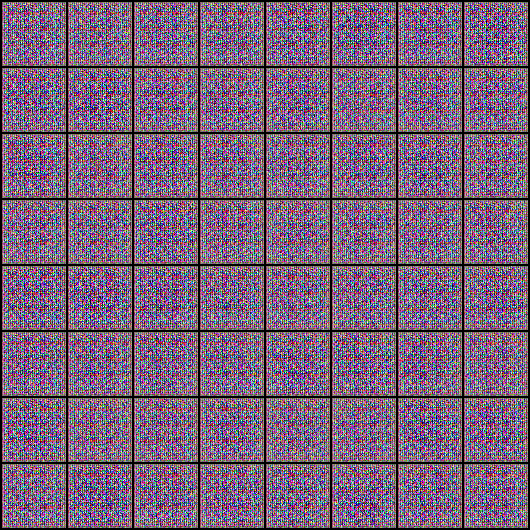

In [188]:
Image('./generated/generated-images-0001.png')

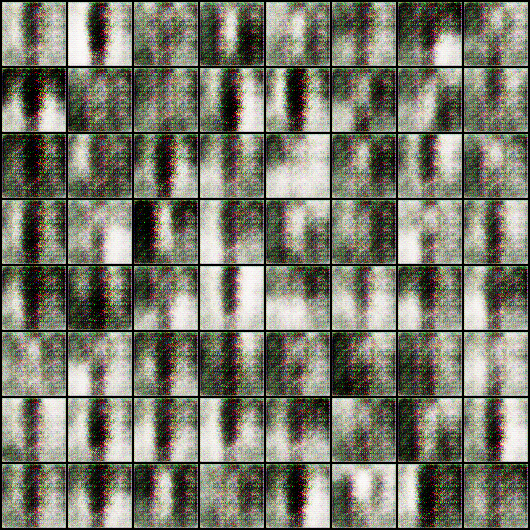

In [189]:
Image('./generated/generated-images-0015.png')

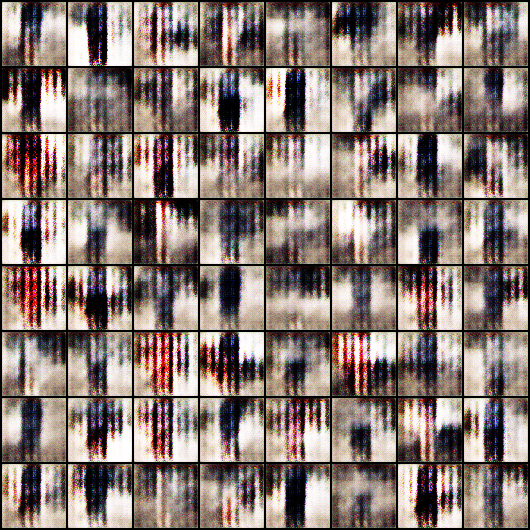

In [190]:
Image('./generated/generated-images-0030.png')

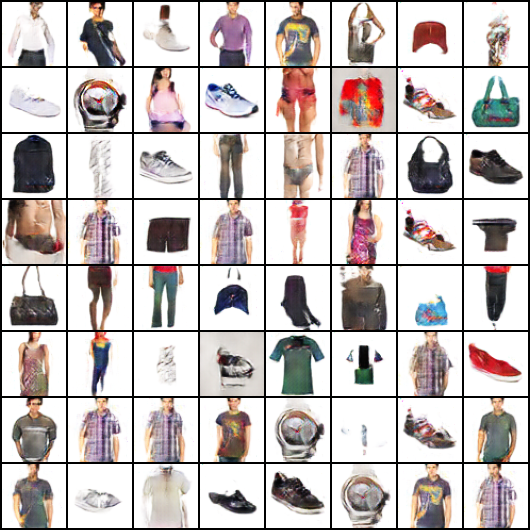

In [36]:
Image('./generated/generated-images-0100.png')

We can visualize the training process by combining the sample images generated after each epoch into a video using OpenCV.

In [36]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

Here's what it looks like:

![]()


We can also visualize how the loss changes over time. Visualizing 
losses is quite useful for debugging the training process. For GANs, we expect the generator's loss to reduce over time, without the discriminator's loss getting too high.



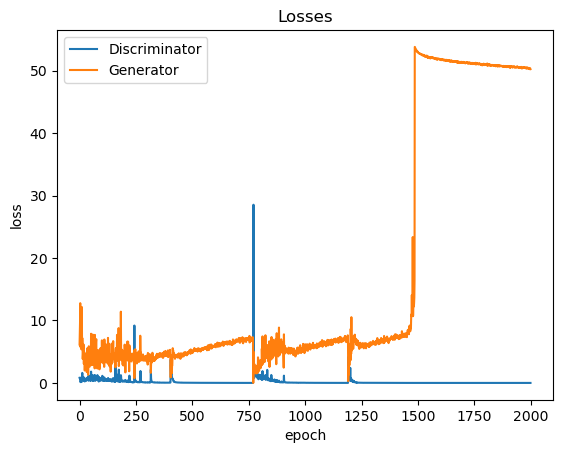

In [37]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

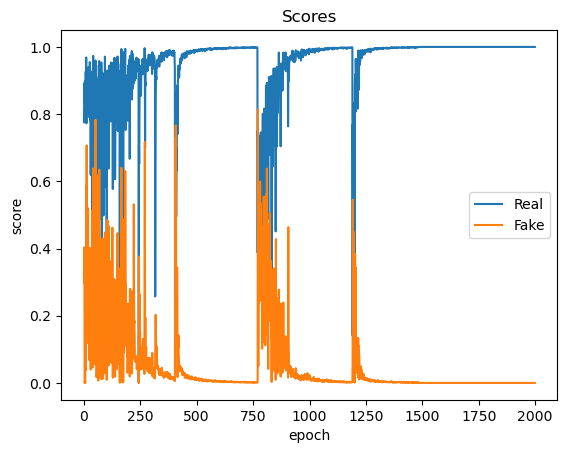

In [38]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

## Save and Commit

We can upload the full snapshot of this experiment to Jovian:
- Jupyter notebook
- Hyperparameters & metrics
- Models weights
- Training video

In [363]:
import jovian

In [140]:
jovian.commit(project=project_name, 
              outputs=['G.pth', 'D.pth', 'gans_training.avi'], 
              environment=None)

<IPython.core.display.Javascript object>

[jovian] Updating notebook "nathan551212/06b-anime-dcgan" on https://jovian.com/


SSLError: HTTPSConnectionPool(host='api.jovian.com', port=443): Max retries exceeded with url: /gist/2dd8c4e50bb949f98597a361c6e19e26/upload (Caused by SSLError(SSLEOFError(8, 'EOF occurred in violation of protocol (_ssl.c:2427)')))

In [140]:
import torch
import torch.nn as nn

# Assuming you have defined your generator and discriminator architectures similarly as before
latent_size = 128

# Define your generator and discriminator architectures
generator = nn.Sequential(
    # Define your generator layers here
     # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

discriminator = nn.Sequential(
    # Define your discriminator layers here
     # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)

# Load the pre-trained weights from the .pth files
generator.load_state_dict(torch.load('G_epoch_100.pth', map_location=torch.device('cuda')))
discriminator.load_state_dict(torch.load('D_epoch_100.pth', map_location=torch.device('cuda')))


<All keys matched successfully>

In [141]:
generator.eval()

Sequential(
  (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace=True)
  (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): ReLU(inplace=True)
  (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): ReLU(inplace=True)
  (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (13): Tanh()
)

In [402]:
import torch
import torch.nn as nn
from torchvision.utils import save_image
import os

# Assuming you have defined your generator and discriminator architectures similarly as before
latent_size = 128

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define your generator and discriminator architectures
generator = nn.Sequential(
    # Define your generator layers here
    # Define your generator layers here
     # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

discriminator = nn.Sequential(
    # Define your discriminator layers here
     # Define your discriminator layers here
     # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)

# Load the pre-trained weights from the .pth files
generator.load_state_dict(torch.load('G.pth', map_location=device))
discriminator.load_state_dict(torch.load('D.pth', map_location=device))

# Move models to the correct device
generator = generator.to(device)
discriminator = discriminator.to(device)

# Directory to save generated images
os.makedirs('generated_images', exist_ok=True)

# Number of images to generate
num_images = 64
latent_vectors = torch.randn(num_images, latent_size, 1, 1, device=device)

# Generate fake images
with torch.no_grad():
    generated_images = generator(latent_vectors).detach().cpu()

# Save generated images
save_image(generated_images, 'generated_images/generated.png', nrow=8, normalize=True)

print(f'Saved generated_images/generated.png containing {num_images} generated images.')


Saved generated_images/generated.png containing 64 generated images.


In [145]:
import torch
import torch.nn as nn
from torchvision.utils import save_image
import os

# Assuming you have defined your generator and discriminator architectures similarly as before
latent_size = 128

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define your generator and discriminator architectures
generator = nn.Sequential(
    # Define your generator layers here
    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

discriminator = nn.Sequential(
    # Define your discriminator layers here
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)

# Load the pre-trained weights from the .pth files
generator.load_state_dict(torch.load('G_epoch_100.pth', map_location=device))
discriminator.load_state_dict(torch.load('D_epoch_100.pth', map_location=device))

# Move models to the correct device
generator = generator.to(device)
discriminator = discriminator.to(device)

# Directory to save generated images
os.makedirs('generated_images', exist_ok=True)

# Number of images to generate
num_images_per_batch = 64
num_batches = 10  # Generate 4 batches of 20 images each

for batch_idx in range(num_batches):
    # Generate latent vectors
    latent_vectors = torch.randn(num_images_per_batch, latent_size, 1, 1, device=device)

    # Generate fake images
    with torch.no_grad():
        generated_images = generator(latent_vectors).detach().cpu()

    # Save generated images
    save_image(generated_images, f'generated_images/generated_batch_{batch_idx + 1}.png', nrow=5, normalize=True)

    print(f'Saved generated_images/generated_batch_{batch_idx + 1}.png containing {num_images_per_batch} generated images.')

print(f'Generated {num_images_per_batch * num_batches} images in total.')


Saved generated_images/generated_batch_1.png containing 64 generated images.
Saved generated_images/generated_batch_2.png containing 64 generated images.
Saved generated_images/generated_batch_3.png containing 64 generated images.
Saved generated_images/generated_batch_4.png containing 64 generated images.
Saved generated_images/generated_batch_5.png containing 64 generated images.
Saved generated_images/generated_batch_6.png containing 64 generated images.
Saved generated_images/generated_batch_7.png containing 64 generated images.
Saved generated_images/generated_batch_8.png containing 64 generated images.
Saved generated_images/generated_batch_9.png containing 64 generated images.
Saved generated_images/generated_batch_10.png containing 64 generated images.
Generated 640 images in total.


In [405]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.utils import save_image
import os

# Assuming you have defined your generator and discriminator architectures similarly as before
latent_size = 128

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the pre-trained weights from the .pth files
generator = nn.Sequential(
    # Define your generator layers here
    # ...
    # Define your generator layers here
    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)
discriminator = nn.Sequential(
    # Define your discriminator layers here
    # ...
    # Define your discriminator layers here
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)

generator.load_state_dict(torch.load('G_epoch_1700.pth', map_location=device))
discriminator.load_state_dict(torch.load('D_epoch_1700.pth', map_location=device))

# Move models to the correct device
generator = generator.to(device)
discriminator = discriminator.to(device)

# Define hyperparameters
num_epochs = 25  # Number of additional epochs to train
lr = 0.0002
beta1 = 0.5
batch_size = 64

# Define optimizers
g_optimizer = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, 0.999))
d_optimizer = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, 0.999))

# Train the model for additional epochs
for epoch in range(num_epochs):
    for i, (real_images, _) in enumerate(train_dl):
        real_images = real_images.to(device)

        # Train the discriminator
        d_optimizer.zero_grad()
        real_output = discriminator(real_images)
        real_loss = -torch.mean(torch.log(real_output + 1e-8))

        z = torch.randn(batch_size, latent_size, 1, 1, device=device)
        fake_images = generator(z)
        fake_output = discriminator(fake_images.detach())
        fake_loss = -torch.mean(torch.log(1 - fake_output + 1e-8))

        d_loss = real_loss + fake_loss
        d_loss.backward()
        d_optimizer.step()

        # Train the generator
        g_optimizer.zero_grad()
        z = torch.randn(batch_size, latent_size, 1, 1, device=device)
        fake_images = generator(z)
        fake_output = discriminator(fake_images)
        g_loss = -torch.mean(torch.log(fake_output + 1e-8))
        g_loss.backward()
        g_optimizer.step()
        print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_dl)}], D_loss: {d_loss.item():.4f}, G_loss: {g_loss.item():.4f}')

# Save the trained models
torch.save(generator.state_dict(), 'G_epoch_1700.pth')
torch.save(discriminator.state_dict(), 'D_epoch_1700.pth')

Epoch [1/25], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1/25], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1/25], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1/25], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1/25], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1/25], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1/25], Step [7/8], D_loss: -0.0000, G_loss: 18.4207
Epoch [1/25], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [2/25], Step [1/8], D_loss: -0.0000, G_loss: 18.4207
Epoch [2/25], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [2/25], Step [3/8], D_loss: 0.0000, G_loss: 18.4193
Epoch [2/25], Step [4/8], D_loss: -0.0000, G_loss: 18.3701
Epoch [2/25], Step [5/8], D_loss: 0.0000, G_loss: 18.4185
Epoch [2/25], Step [6/8], D_loss: 0.0000, G_loss: 18.4191
Epoch [2/25], Step [7/8], D_loss: 0.0000, G_loss: 18.4126
Epoch [2/25], Step [8/8], D_loss: 0.0000, G_loss: 18.3086
Epoch [3/25], Step [1/8], D_loss: 0.0000, G_loss: 18.3842
Epoch [3/25

Epoch [18/25], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [18/25], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/25], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/25], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/25], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/25], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/25], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/25], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/25], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/25], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [20/25], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [20/25], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [20/25], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [20/25], Step [4/8], D_loss: 0.0000, G_loss: 18.4204
Epoch [20/25], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [20/25], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [20/25], Step [7/8], D_loss: 0.0000, G_loss: 18.42

In [367]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.utils import save_image
import os

# Assuming you have defined your generator and discriminator architectures similarly as before
latent_size = 128

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the pre-trained weights from the .pth files
generator = nn.Sequential(
    # Define your generator layers here
    # ...
    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)
discriminator = nn.Sequential(
    # Define your discriminator layers here
    # ...
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid()
)

generator.load_state_dict(torch.load('G.pth', map_location=device))
discriminator.load_state_dict(torch.load('D.pth', map_location=device))

# Move models to the correct device
generator = generator.to(device)
discriminator = discriminator.to(device)

# Define hyperparameters
num_epochs = 2000  # Number of additional epochs to train
lr = 0.0002
beta1 = 0.5
batch_size = 64

# Define optimizers
g_optimizer = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, 0.999))
d_optimizer = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, 0.999))

# Train the model for additional epochs
for epoch in range(num_epochs):
    for i, (real_images, _) in enumerate(train_dl):
        real_images = real_images.to(device)

        # Train the discriminator
        d_optimizer.zero_grad()
        real_output = discriminator(real_images)
        real_loss = -torch.mean(torch.log(real_output + 1e-8))

        z = torch.randn(batch_size, latent_size, 1, 1, device=device)
        fake_images = generator(z)
        fake_output = discriminator(fake_images.detach())
        fake_loss = -torch.mean(torch.log(1 - fake_output + 1e-8))

        d_loss = real_loss + fake_loss
        d_loss.backward()
        d_optimizer.step()

        # Train the generator
        g_optimizer.zero_grad()
        z = torch.randn(batch_size, latent_size, 1, 1, device=device)
        fake_images = generator(z)
        fake_output = discriminator(fake_images)
        g_loss = -torch.mean(torch.log(fake_output + 1e-8))
        g_loss.backward()
        g_optimizer.step()

        print(f'Epoch [{epoch+1}/{num_epochs}], Step [{i+1}/{len(train_dl)}], D_loss: {d_loss.item():.4f}, G_loss: {g_loss.item():.4f}')

    # Save the models every 100 epochs
    if (epoch + 1) % 100 == 0:
        torch.save(generator.state_dict(), f'G_epoch_{epoch+1}.pth')
        torch.save(discriminator.state_dict(), f'D_epoch_{epoch+1}.pth')

# Save the final trained models
torch.save(generator.state_dict(), 'G_final.pth')
torch.save(discriminator.state_dict(), 'D_final.pth')


Epoch [1/2000], Step [1/8], D_loss: 0.0002, G_loss: 18.3548
Epoch [1/2000], Step [2/8], D_loss: 0.0000, G_loss: 17.9380
Epoch [1/2000], Step [3/8], D_loss: 0.0000, G_loss: 17.0177
Epoch [1/2000], Step [4/8], D_loss: 0.0119, G_loss: 18.3913
Epoch [1/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4196
Epoch [1/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4206
Epoch [1/2000], Step [7/8], D_loss: 0.0003, G_loss: 18.4186
Epoch [1/2000], Step [8/8], D_loss: 0.0002, G_loss: 18.4206
Epoch [2/2000], Step [1/8], D_loss: 0.0002, G_loss: 18.4204
Epoch [2/2000], Step [2/8], D_loss: 0.0001, G_loss: 18.4114
Epoch [2/2000], Step [3/8], D_loss: 0.0001, G_loss: 18.4206
Epoch [2/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4202
Epoch [2/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4205
Epoch [2/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4204
Epoch [2/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4206
Epoch [2/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4193
Epoch [3/2000], Step [1/8], D_loss: 0.00

Epoch [18/2000], Step [1/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [18/2000], Step [2/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [18/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [18/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [18/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [18/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [18/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [18/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [19/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [20/2000], Step [1

Epoch [35/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [35/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [35/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [35/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [35/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [35/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [35/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [35/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [36/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [36/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [36/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [36/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [36/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [36/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [36/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [36/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [37/2000], Step [1

Epoch [52/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [52/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [52/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [52/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [52/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [52/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [52/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [52/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [53/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [53/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [53/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [53/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [53/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [53/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [53/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [53/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [54/2000], Step [1

Epoch [69/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [69/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [69/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [69/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [69/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [69/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [69/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [69/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [70/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [70/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [70/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [70/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [70/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [70/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [70/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [70/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [71/2000], Step [1

Epoch [86/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [86/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [86/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [86/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [86/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [86/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [86/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [86/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [87/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [87/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [87/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [87/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [87/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [87/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [87/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [87/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [88/2000], Step [1

Epoch [102/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [102/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [103/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [103/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [103/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [103/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [103/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [103/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [103/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [103/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [104/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [104/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [104/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [104/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [104/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [104/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1

Epoch [119/2000], Step [4/8], D_loss: 4.0852, G_loss: 17.4382
Epoch [119/2000], Step [5/8], D_loss: 0.5872, G_loss: 13.8777
Epoch [119/2000], Step [6/8], D_loss: 10.0001, G_loss: 15.3559
Epoch [119/2000], Step [7/8], D_loss: 2.6280, G_loss: 17.5799
Epoch [119/2000], Step [8/8], D_loss: 0.8548, G_loss: 17.3380
Epoch [120/2000], Step [1/8], D_loss: 0.5350, G_loss: 15.5238
Epoch [120/2000], Step [2/8], D_loss: 2.9750, G_loss: 18.2431
Epoch [120/2000], Step [3/8], D_loss: 0.9960, G_loss: 18.1751
Epoch [120/2000], Step [4/8], D_loss: 0.3463, G_loss: 16.9181
Epoch [120/2000], Step [5/8], D_loss: 7.4464, G_loss: 18.1073
Epoch [120/2000], Step [6/8], D_loss: 1.0677, G_loss: 17.9665
Epoch [120/2000], Step [7/8], D_loss: 1.1767, G_loss: 16.7258
Epoch [120/2000], Step [8/8], D_loss: 0.3678, G_loss: 13.7441
Epoch [121/2000], Step [1/8], D_loss: 1.7945, G_loss: 17.9439
Epoch [121/2000], Step [2/8], D_loss: 0.0163, G_loss: 18.1606
Epoch [121/2000], Step [3/8], D_loss: 0.1494, G_loss: 17.4644
Epoch [

Epoch [136/2000], Step [1/8], D_loss: 0.1229, G_loss: 12.7165
Epoch [136/2000], Step [2/8], D_loss: 0.1207, G_loss: 9.7436
Epoch [136/2000], Step [3/8], D_loss: 0.0996, G_loss: 7.6825
Epoch [136/2000], Step [4/8], D_loss: 0.6055, G_loss: 16.8222
Epoch [136/2000], Step [5/8], D_loss: 0.5843, G_loss: 15.0605
Epoch [136/2000], Step [6/8], D_loss: 0.0569, G_loss: 13.6969
Epoch [136/2000], Step [7/8], D_loss: 0.0493, G_loss: 10.9086
Epoch [136/2000], Step [8/8], D_loss: 0.2597, G_loss: 13.2994
Epoch [137/2000], Step [1/8], D_loss: 0.0141, G_loss: 13.1678
Epoch [137/2000], Step [2/8], D_loss: 0.0116, G_loss: 12.2445
Epoch [137/2000], Step [3/8], D_loss: 0.0453, G_loss: 9.4716
Epoch [137/2000], Step [4/8], D_loss: 0.1201, G_loss: 8.1772
Epoch [137/2000], Step [5/8], D_loss: 0.2872, G_loss: 14.3306
Epoch [137/2000], Step [6/8], D_loss: 0.1572, G_loss: 13.6954
Epoch [137/2000], Step [7/8], D_loss: 0.0465, G_loss: 10.8706
Epoch [137/2000], Step [8/8], D_loss: 0.0538, G_loss: 8.8080
Epoch [138/20

Epoch [152/2000], Step [7/8], D_loss: 0.0003, G_loss: 18.3913
Epoch [152/2000], Step [8/8], D_loss: 0.0003, G_loss: 18.4109
Epoch [153/2000], Step [1/8], D_loss: 0.0001, G_loss: 18.4175
Epoch [153/2000], Step [2/8], D_loss: 0.0005, G_loss: 18.4203
Epoch [153/2000], Step [3/8], D_loss: 0.0002, G_loss: 18.3956
Epoch [153/2000], Step [4/8], D_loss: 0.0003, G_loss: 18.3788
Epoch [153/2000], Step [5/8], D_loss: 0.0003, G_loss: 18.4146
Epoch [153/2000], Step [6/8], D_loss: 0.0002, G_loss: 18.3543
Epoch [153/2000], Step [7/8], D_loss: 0.0002, G_loss: 18.3013
Epoch [153/2000], Step [8/8], D_loss: 0.0002, G_loss: 18.2620
Epoch [154/2000], Step [1/8], D_loss: 0.0003, G_loss: 18.2349
Epoch [154/2000], Step [2/8], D_loss: 0.0001, G_loss: 17.7036
Epoch [154/2000], Step [3/8], D_loss: 0.0003, G_loss: 17.7924
Epoch [154/2000], Step [4/8], D_loss: 0.0022, G_loss: 17.0682
Epoch [154/2000], Step [5/8], D_loss: 0.0339, G_loss: 17.8020
Epoch [154/2000], Step [6/8], D_loss: 0.0005, G_loss: 17.8074
Epoch [1

Epoch [169/2000], Step [4/8], D_loss: 0.0002, G_loss: 18.4207
Epoch [169/2000], Step [5/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [169/2000], Step [6/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [169/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [169/2000], Step [8/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [170/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [170/2000], Step [2/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [170/2000], Step [3/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [170/2000], Step [4/8], D_loss: 0.0002, G_loss: 18.4207
Epoch [170/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [170/2000], Step [6/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [170/2000], Step [7/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [170/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [171/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [171/2000], Step [2/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [171/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1

Epoch [186/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [186/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [186/2000], Step [3/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [186/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [186/2000], Step [5/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [186/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [186/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [186/2000], Step [8/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [187/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [187/2000], Step [2/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [187/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [187/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [187/2000], Step [5/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [187/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [187/2000], Step [7/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [187/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1

Epoch [202/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [202/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [203/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [203/2000], Step [2/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [203/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [203/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [203/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [203/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [203/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [203/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [204/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [204/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [204/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [204/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [204/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [204/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [2

Epoch [219/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [219/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [219/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [219/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [219/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [220/2000], Step [1/8], D_loss: 0.0001, G_loss: 18.4207
Epoch [220/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [220/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [220/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [220/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [220/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [220/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [220/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [221/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [221/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [221/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [2

Epoch [236/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [236/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [236/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [236/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [236/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [236/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [236/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [236/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [237/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [237/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [237/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [237/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [237/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [237/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [237/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [237/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [2

Epoch [252/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [252/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [253/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [253/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [253/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [253/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [253/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [253/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [253/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [253/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [254/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [254/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [254/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [254/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [254/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [254/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [2

Epoch [269/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [269/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [269/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [269/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [269/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [270/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [270/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [270/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [270/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [270/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [270/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [270/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [270/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [271/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [271/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [271/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [2

Epoch [286/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [286/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [286/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [286/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [286/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [286/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [286/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [286/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [287/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [287/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [287/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [287/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [287/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [287/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [287/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [287/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [2

Epoch [302/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [302/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [303/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [303/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [303/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [303/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [303/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [303/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [303/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [303/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [304/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [304/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [304/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [304/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [304/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [304/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [3

Epoch [319/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [319/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [319/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [319/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [319/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [320/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [320/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [320/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [320/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [320/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [320/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [320/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [320/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [321/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [321/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [321/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [3

Epoch [336/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [336/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [336/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [336/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [336/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [336/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [336/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [336/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [337/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [337/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [337/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [337/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [337/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [337/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [337/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [337/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [3

Epoch [352/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [352/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [353/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [353/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [353/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [353/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [353/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [353/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [353/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [353/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [354/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [354/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [354/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [354/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [354/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [354/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [3

Epoch [369/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [369/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [369/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [369/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [369/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [370/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [370/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [370/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [370/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [370/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [370/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [370/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [370/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [371/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [371/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [371/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [3

Epoch [386/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [386/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [386/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [386/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [386/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [386/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [386/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [386/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [387/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [387/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [387/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [387/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [387/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [387/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [387/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [387/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [3

Epoch [402/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [402/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [403/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [403/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [403/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [403/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [403/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [403/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [403/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [403/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [404/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [404/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [404/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [404/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [404/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [404/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [4

Epoch [419/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [419/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [419/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [419/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [419/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [420/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [420/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [420/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [420/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [420/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [420/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [420/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [420/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [421/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [421/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [421/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [4

Epoch [436/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [436/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [436/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [436/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [436/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [436/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [436/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [436/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [437/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [437/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [437/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [437/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [437/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [437/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [437/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [437/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [4

Epoch [452/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [452/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [453/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [453/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [453/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [453/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [453/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [453/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [453/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [453/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [454/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [454/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [454/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [454/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [454/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [454/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [4

Epoch [469/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [469/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [469/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [469/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [469/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [470/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [470/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [470/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [470/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [470/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [470/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [470/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [470/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [471/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [471/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [471/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [4

Epoch [486/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [486/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [486/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [486/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [486/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [486/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [486/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [486/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [487/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [487/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [487/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [487/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [487/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [487/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [487/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [487/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [4

Epoch [502/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [502/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [503/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [503/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [503/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [503/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [503/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [503/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [503/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [503/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [504/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [504/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [504/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [504/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [504/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [504/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [5

Epoch [519/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [519/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [519/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [519/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [519/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [520/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [520/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [520/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [520/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [520/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [520/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [520/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [520/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [521/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [521/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [521/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [5

Epoch [536/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [536/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [536/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [536/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [536/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [536/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [536/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [536/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [537/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [537/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [537/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [537/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [537/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [537/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [537/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [537/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [5

Epoch [552/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [552/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [553/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [553/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [553/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [553/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [553/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [553/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [553/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [553/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [554/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [554/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [554/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [554/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [554/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [554/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [5

Epoch [569/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [569/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [569/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [569/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [569/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [570/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [570/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [570/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [570/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [570/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [570/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [570/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [570/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [571/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [571/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [571/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [5

Epoch [586/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [586/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [586/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [586/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [586/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [586/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [586/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [586/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [587/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [587/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [587/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [587/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [587/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [587/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [587/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [587/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [5

Epoch [602/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [602/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [603/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [603/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [603/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [603/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [603/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [603/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [603/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [603/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [604/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [604/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [604/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [604/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [604/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [604/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [6

Epoch [619/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [619/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [619/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [619/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [619/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [620/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [620/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [620/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [620/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [620/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [620/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [620/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [620/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [621/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [621/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [621/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [6

Epoch [636/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [636/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [636/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [636/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [636/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [636/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [636/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [636/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [637/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [637/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [637/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [637/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [637/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [637/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [637/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [637/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [6

Epoch [652/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [652/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [653/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [653/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [653/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [653/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [653/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [653/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [653/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [653/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [654/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [654/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [654/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [654/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [654/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [654/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [6

Epoch [669/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [669/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [669/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [669/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [669/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [670/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [670/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [670/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [670/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [670/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [670/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [670/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [670/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [671/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [671/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [671/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [6

Epoch [686/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [686/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [686/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [686/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [686/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [686/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [686/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [686/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [687/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [687/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [687/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [687/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [687/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [687/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [687/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [687/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [6

Epoch [702/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [702/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [703/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [703/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [703/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [703/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [703/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [703/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [703/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [703/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [704/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [704/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [704/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [704/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [704/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [704/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [7

Epoch [719/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [719/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [719/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [719/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [719/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [720/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [720/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [720/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [720/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [720/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [720/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [720/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [720/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [721/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [721/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [721/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [7

Epoch [736/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [736/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [736/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [736/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [736/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [736/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [736/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [736/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [737/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [737/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [737/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [737/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [737/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [737/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [737/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [737/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [7

Epoch [752/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [752/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [753/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [753/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [753/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [753/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [753/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [753/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [753/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [753/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [754/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [754/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [754/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [754/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [754/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [754/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [7

Epoch [769/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [769/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [769/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [769/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [769/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [770/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [770/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [770/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [770/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [770/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [770/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [770/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [770/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [771/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [771/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [771/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [7

Epoch [786/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [786/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [786/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [786/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [786/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [786/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [786/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [786/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [787/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [787/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [787/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [787/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [787/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [787/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [787/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [787/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [7

Epoch [802/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [802/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [803/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [803/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [803/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [803/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [803/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [803/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [803/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [803/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [804/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [804/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [804/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [804/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [804/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [804/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [8

Epoch [819/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [819/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [819/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [819/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [819/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [820/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [820/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [820/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [820/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [820/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [820/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [820/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [820/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [821/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [821/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [821/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [8

Epoch [836/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [836/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [836/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [836/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [836/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [836/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [836/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [836/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [837/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [837/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [837/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [837/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [837/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [837/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [837/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [837/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [8

Epoch [852/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [852/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [853/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [853/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [853/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [853/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [853/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [853/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [853/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [853/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [854/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [854/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [854/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [854/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [854/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [854/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [8

Epoch [869/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [869/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [869/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [869/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [869/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [870/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [870/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [870/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [870/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [870/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [870/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [870/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [870/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [871/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [871/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [871/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [8

Epoch [886/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [886/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [886/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [886/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [886/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [886/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [886/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [886/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [887/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [887/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [887/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [887/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [887/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [887/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [887/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [887/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [8

Epoch [902/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [902/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [903/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [903/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [903/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [903/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [903/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [903/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [903/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [903/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [904/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [904/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [904/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [904/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [904/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [904/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [9

Epoch [919/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [919/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [919/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [919/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [919/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [920/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [920/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [920/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [920/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [920/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [920/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [920/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [920/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [921/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [921/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [921/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [9

Epoch [936/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [936/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [936/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [936/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [936/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [936/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [936/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [936/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [937/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [937/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [937/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [937/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [937/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [937/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [937/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [937/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [9

Epoch [952/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [952/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [953/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [953/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [953/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [953/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [953/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [953/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [953/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [953/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [954/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [954/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [954/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [954/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [954/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [954/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [9

Epoch [969/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [969/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [969/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [969/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [969/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [970/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [970/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [970/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [970/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [970/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [970/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [970/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [970/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [971/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [971/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [971/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [9

Epoch [986/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [986/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [986/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [986/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [986/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [986/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [986/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [986/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [987/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [987/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [987/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [987/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [987/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [987/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [987/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [987/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [9

Epoch [1002/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1002/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1003/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1003/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1003/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1003/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1003/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1003/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1003/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1003/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1004/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1004/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1004/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1004/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1004/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1004/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1019/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1019/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1019/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1019/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1019/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1020/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1020/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1020/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1020/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1020/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1020/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1020/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1020/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1021/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1021/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1021/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1035/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1035/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1036/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1036/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1036/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1036/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1036/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1036/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1036/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1036/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1037/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1037/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1037/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1037/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1037/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1037/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1052/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1052/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1052/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1052/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1052/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1053/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1053/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1053/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1053/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1053/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1053/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1053/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1053/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1054/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1054/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1054/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1068/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1068/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1069/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1069/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1069/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1069/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1069/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1069/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1069/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1069/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1070/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1070/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1070/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1070/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1070/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1070/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1085/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1085/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1085/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1085/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1085/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1086/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1086/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1086/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1086/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1086/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1086/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1086/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1086/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1087/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1087/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1087/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1101/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1101/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1102/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1102/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1102/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1102/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1102/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1102/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1102/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1102/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1103/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1103/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1103/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1103/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1103/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1103/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1118/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1118/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1118/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1118/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1118/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1119/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1119/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1119/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1119/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1119/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1119/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1119/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1119/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1120/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1120/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1120/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1134/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1134/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1135/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1135/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1135/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1135/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1135/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1135/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1135/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1135/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1136/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1136/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1136/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1136/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1136/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1136/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1151/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1151/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1151/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1151/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1151/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1152/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1152/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1152/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1152/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1152/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1152/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1152/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1152/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1153/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1153/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1153/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1167/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1167/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1168/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1168/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1168/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1168/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1168/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1168/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1168/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1168/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1169/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1169/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1169/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1169/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1169/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1169/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1184/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1184/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1184/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1184/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1184/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1185/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1185/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1185/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1185/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1185/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1185/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1185/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1185/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1186/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1186/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1186/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1200/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1200/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1201/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1201/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1201/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1201/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1201/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1201/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1201/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1201/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1202/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1202/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1202/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1202/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1202/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1202/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1217/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1217/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1217/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1217/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1217/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1218/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1218/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1218/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1218/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1218/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1218/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1218/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1218/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1219/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1219/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1219/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1233/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1233/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1234/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1234/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1234/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1234/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1234/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1234/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1234/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1234/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1235/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1235/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1235/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1235/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1235/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1235/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1250/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1250/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1250/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1250/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1250/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1251/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1251/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1251/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1251/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1251/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1251/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1251/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1251/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1252/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1252/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1252/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1266/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1266/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1267/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1267/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1267/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1267/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1267/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1267/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1267/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1267/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1268/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1268/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1268/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1268/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1268/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1268/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1283/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1283/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1283/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1283/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1283/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1284/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1284/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1284/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1284/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1284/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1284/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1284/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1284/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1285/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1285/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1285/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1299/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1299/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1300/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1300/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1300/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1300/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1300/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1300/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1300/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1300/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1301/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1301/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1301/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1301/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1301/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1301/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1316/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1316/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1316/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1316/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1316/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1317/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1317/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1317/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1317/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1317/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1317/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1317/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1317/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1318/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1318/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1318/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1332/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1332/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1333/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1333/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1333/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1333/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1333/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1333/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1333/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1333/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1334/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1334/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1334/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1334/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1334/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1334/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1349/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1349/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1349/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1349/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1349/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1350/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1350/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1350/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1350/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1350/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1350/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1350/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1350/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1351/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1351/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1351/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1365/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1365/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1366/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1366/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1366/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1366/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1366/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1366/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1366/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1366/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1367/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1367/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1367/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1367/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1367/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1367/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1382/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1382/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1382/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1382/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1382/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1383/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1383/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1383/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1383/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1383/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1383/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1383/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1383/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1384/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1384/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1384/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1398/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1398/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1399/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1399/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1399/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1399/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1399/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1399/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1399/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1399/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1400/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1400/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1400/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1400/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1400/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1400/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1415/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1415/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1415/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1415/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1415/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1416/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1416/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1416/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1416/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1416/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1416/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1416/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1416/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1417/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1417/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1417/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1431/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1431/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1432/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1432/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1432/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1432/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1432/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1432/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1432/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1432/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1433/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1433/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1433/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1433/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1433/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1433/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1448/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1448/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1448/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1448/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1448/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1449/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1449/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1449/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1449/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1449/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1449/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1449/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1449/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1450/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1450/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1450/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1464/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1464/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1465/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1465/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1465/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1465/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1465/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1465/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1465/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1465/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1466/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1466/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1466/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1466/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1466/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1466/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1481/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1481/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1481/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1481/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1481/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1482/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1482/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1482/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1482/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1482/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1482/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1482/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1482/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1483/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1483/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1483/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1497/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1497/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1498/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1498/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1498/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1498/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1498/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1498/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1498/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1498/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1499/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1499/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1499/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1499/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1499/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1499/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1514/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1514/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1514/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1514/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1514/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1515/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1515/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1515/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1515/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1515/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1515/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1515/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1515/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1516/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1516/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1516/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1530/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1530/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1531/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1531/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1531/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1531/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1531/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1531/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1531/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1531/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1532/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1532/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1532/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1532/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1532/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1532/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1547/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1547/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1547/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1547/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1547/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1548/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1548/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1548/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1548/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1548/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1548/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1548/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1548/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1549/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1549/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1549/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1563/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1563/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1564/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1564/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1564/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1564/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1564/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1564/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1564/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1564/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1565/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1565/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1565/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1565/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1565/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1565/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1580/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1580/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1580/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1580/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1580/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1581/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1581/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1581/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1581/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1581/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1581/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1581/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1581/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1582/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1582/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1582/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1596/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1596/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1597/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1597/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1597/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1597/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1597/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1597/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1597/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1597/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1598/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1598/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1598/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1598/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1598/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1598/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1613/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1613/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1613/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1613/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1613/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1614/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1614/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1614/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1614/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1614/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1614/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1614/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1614/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1615/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1615/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1615/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1629/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1629/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1630/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1630/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1630/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1630/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1630/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1630/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1630/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1630/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1631/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1631/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1631/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1631/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1631/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1631/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1646/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1646/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1646/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1646/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1646/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1647/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1647/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1647/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1647/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1647/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1647/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1647/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1647/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1648/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1648/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1648/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1662/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1662/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1663/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1663/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1663/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1663/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1663/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1663/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1663/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1663/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1664/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1664/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1664/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1664/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1664/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1664/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1679/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1679/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1679/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1679/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1679/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1680/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1680/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1680/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1680/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1680/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1680/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1680/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1680/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1681/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1681/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1681/2000], Step [3/8], D_loss: 0.0000, G_loss: 

Epoch [1695/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1695/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1696/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1696/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1696/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1696/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1696/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1696/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1696/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1696/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1697/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1697/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1697/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1697/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1697/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1697/2000], Step [6/8], D_loss: 0.0000, G_loss: 

Epoch [1712/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1712/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1712/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1712/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1712/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1713/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1713/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1713/2000], Step [3/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1713/2000], Step [4/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1713/2000], Step [5/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1713/2000], Step [6/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1713/2000], Step [7/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1713/2000], Step [8/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1714/2000], Step [1/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1714/2000], Step [2/8], D_loss: 0.0000, G_loss: 18.4207
Epoch [1714/2000], Step [3/8], D_loss: 0.0000, G_loss: 

KeyboardInterrupt: 

# TRAINING CODE

In [ ]:
import os
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
from torchvision.utils import make_grid, save_image
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import torch.nn.functional as F

# Define constants
DATA_DIR = './fashion-product-images-small'
image_size = 64
batch_size = 128
latent_size = 128
lr = 0.00005
epochs = 2000
clip_value = 0.01
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

# Data transformations
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

# Show images helper functions
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

# Device configuration
def get_default_device():
    return torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def to_device(data, device):
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        return len(self.dl)

device = get_default_device()
train_dl = DeviceDataLoader(train_dl, device)

# WGAN Discriminator
discriminator = nn.Sequential(
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    nn.Flatten()
)
discriminator = to_device(discriminator, device)

# WGAN Generator
generator = nn.Sequential(
    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
)
generator = to_device(generator, device)

# Save sample images
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

save_samples(0, fixed_latent)

# Training functions
def train_discriminator(real_images, opt_d):
    opt_d.zero_grad()
    real_preds = discriminator(real_images)
    real_loss = -torch.mean(real_preds)
    real_score = torch.mean(real_preds).item()
    
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    fake_preds = discriminator(fake_images)
    fake_loss = torch.mean(fake_preds)
    fake_score = torch.mean(fake_preds).item()
    
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    
    # Clip weights of discriminator
    for p in discriminator.parameters():
        p.data.clamp_(-clip_value, clip_value)
    
    return loss.item(), real_score, fake_score

def train_generator(opt_g):
    opt_g.zero_grad()
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    preds = discriminator(fake_images)
    loss = -torch.mean(preds)
    loss.backward()
    opt_g.step()
    return loss.item()

def fit(epochs, lr, start_idx=1, save_interval=25):
    torch.cuda.empty_cache()
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    opt_d = optim.RMSprop(discriminator.parameters(), lr=lr)
    opt_g = optim.RMSprop(generator.parameters(), lr=lr)
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            loss_g = train_generator(opt_g)
        
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        print(f"Epoch [{epoch+1}/{epochs}], loss_g: {loss_g:.4f}, loss_d: {loss_d:.4f}, real_score: {real_score:.4f}, fake_score: {fake_score:.4f}")
        save_samples(epoch+start_idx, fixed_latent, show=False)
        
        if (epoch + 1) % save_interval == 0:
            torch.save(generator.state_dict(), f'G_epoch_{epoch+1}.pth')
            torch.save(discriminator.state_dict(), f'D_epoch_{epoch+1}.pth')
    
    return losses_g, losses_d, real_scores, fake_scores

# Train the WGAN
history = fit(epochs, lr)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [1/2000], loss_g: 0.1135, loss_d: -0.4057, real_score: -0.0141, fake_score: -0.4198
Saving generated-images-0001.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [2/2000], loss_g: 0.0108, loss_d: -0.4568, real_score: 0.0580, fake_score: -0.3988
Saving generated-images-0002.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [3/2000], loss_g: 0.2441, loss_d: -0.3390, real_score: -0.0104, fake_score: -0.3494
Saving generated-images-0003.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [4/2000], loss_g: -0.0471, loss_d: -0.3170, real_score: -0.0682, fake_score: -0.3852
Saving generated-images-0004.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [5/2000], loss_g: 0.0967, loss_d: -0.1819, real_score: -0.2668, fake_score: -0.4488
Saving generated-images-0005.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [6/2000], loss_g: 0.3838, loss_d: -0.3029, real_score: 0.2291, fake_score: -0.0738
Saving generated-images-0006.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [7/2000], loss_g: -0.1102, loss_d: -0.2748, real_score: -0.1444, fake_score: -0.4192
Saving generated-images-0007.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [8/2000], loss_g: 0.0233, loss_d: -0.2837, real_score: -0.1038, fake_score: -0.3876
Saving generated-images-0008.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [9/2000], loss_g: 0.0326, loss_d: -0.2939, real_score: 0.0461, fake_score: -0.2478
Saving generated-images-0009.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [10/2000], loss_g: -0.1457, loss_d: -0.2660, real_score: -0.1303, fake_score: -0.3963
Saving generated-images-0010.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [11/2000], loss_g: 0.0285, loss_d: -0.2698, real_score: -0.0839, fake_score: -0.3537
Saving generated-images-0011.png


  0%|          | 0/695 [00:00<?, ?it/s]

In [5]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

In [6]:
losses_g, losses_d, real_scores, fake_scores = history

# PLOTTING

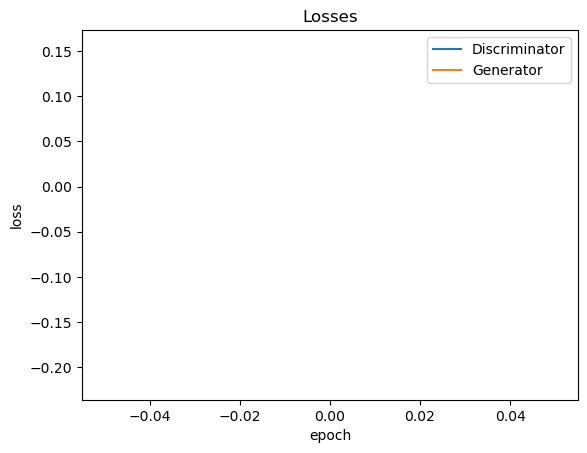

In [7]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

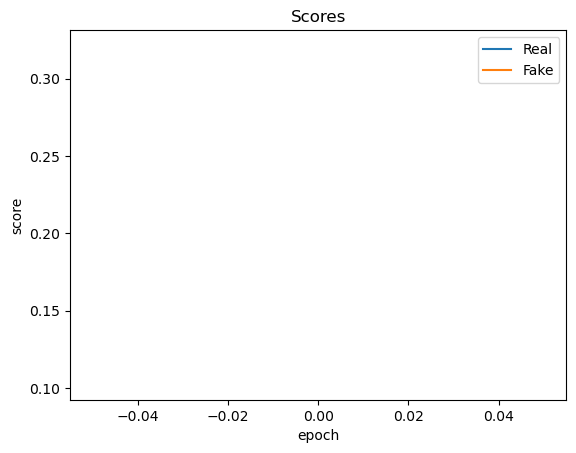

In [8]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

# GENERATING IMAGES FROM THE 2000 EPOCH MODEL

In [9]:
import torch
import torch.nn as nn
from torchvision.utils import save_image
import os

# Assuming you have defined your generator and discriminator architectures similarly as before
latent_size = 128

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define your generator architecture
class Generator(nn.Module):
    def __init__(self, latent_size):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, x):
        return self.main(x)

# Instantiate the generator
generator = Generator(latent_size)

# Load the pre-trained weights from the .pth files
state_dict = torch.load('G_epoch_400.pth', map_location=device)

# Rename keys to match the model's expected keys
new_state_dict = {}
for k, v in state_dict.items():
    new_key = 'main.' + k if not k.startswith('main.') else k
    new_state_dict[new_key] = v

generator.load_state_dict(new_state_dict)

# Move the model to the correct device
generator = generator.to(device)

# Directory to save generated images
os.makedirs('generated_images', exist_ok=True)

# Number of images to generate
num_images_per_batch = 64
num_batches = 10  # Generate 10 batches of 64 images each

for batch_idx in range(num_batches):
    # Generate latent vectors
    latent_vectors = torch.randn(num_images_per_batch, latent_size, 1, 1, device=device)

    # Generate fake images
    with torch.no_grad():
        generated_images = generator(latent_vectors).detach().cpu()

    # Save generated images
    save_image(generated_images, f'generated_images/generated_batch_{batch_idx + 1}.png', nrow=8, normalize=True)

    print(f'Saved generated_images/generated_batch_{batch_idx + 1}.png containing {num_images_per_batch} generated images.')

print(f'Generated {num_images_per_batch * num_batches} images in total.')


Saved generated_images/generated_batch_1.png containing 64 generated images.
Saved generated_images/generated_batch_2.png containing 64 generated images.
Saved generated_images/generated_batch_3.png containing 64 generated images.
Saved generated_images/generated_batch_4.png containing 64 generated images.
Saved generated_images/generated_batch_5.png containing 64 generated images.
Saved generated_images/generated_batch_6.png containing 64 generated images.
Saved generated_images/generated_batch_7.png containing 64 generated images.
Saved generated_images/generated_batch_8.png containing 64 generated images.
Saved generated_images/generated_batch_9.png containing 64 generated images.
Saved generated_images/generated_batch_10.png containing 64 generated images.
Generated 640 images in total.


# continue training from the point where you have already saved the model after 2000 epochs

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Saving generated-images-0000.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [51/2000], loss_g: 0.3780, loss_d: -0.2570, real_score: 0.2711, fake_score: 0.0141
Saving generated-images-0051.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [52/2000], loss_g: -0.0878, loss_d: -0.2104, real_score: -0.1776, fake_score: -0.3880
Saving generated-images-0052.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [53/2000], loss_g: -0.0323, loss_d: -0.3242, real_score: -0.0105, fake_score: -0.3347
Saving generated-images-0053.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [54/2000], loss_g: 0.3478, loss_d: -0.2636, real_score: 0.3081, fake_score: 0.0444
Saving generated-images-0054.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [55/2000], loss_g: 0.0642, loss_d: -0.2967, real_score: 0.0076, fake_score: -0.2891
Saving generated-images-0055.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [56/2000], loss_g: 0.3671, loss_d: -0.2585, real_score: 0.3385, fake_score: 0.0800
Saving generated-images-0056.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [57/2000], loss_g: 0.3694, loss_d: -0.2954, real_score: 0.2447, fake_score: -0.0507
Saving generated-images-0057.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [58/2000], loss_g: 0.3468, loss_d: -0.2678, real_score: 0.3096, fake_score: 0.0419
Saving generated-images-0058.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [59/2000], loss_g: -0.0309, loss_d: -0.3259, real_score: 0.0026, fake_score: -0.3234
Saving generated-images-0059.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [60/2000], loss_g: 0.1056, loss_d: -0.3205, real_score: 0.0281, fake_score: -0.2924
Saving generated-images-0060.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [61/2000], loss_g: 0.0147, loss_d: -0.2686, real_score: 0.0092, fake_score: -0.2594
Saving generated-images-0061.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [62/2000], loss_g: -0.0204, loss_d: -0.2624, real_score: -0.0827, fake_score: -0.3451
Saving generated-images-0062.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [63/2000], loss_g: 0.3654, loss_d: -0.2760, real_score: 0.3423, fake_score: 0.0663
Saving generated-images-0063.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [64/2000], loss_g: 0.3527, loss_d: -0.2203, real_score: 0.2900, fake_score: 0.0697
Saving generated-images-0064.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [65/2000], loss_g: 0.2395, loss_d: -0.1669, real_score: 0.2431, fake_score: 0.0762
Saving generated-images-0065.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [66/2000], loss_g: 0.4080, loss_d: -0.2796, real_score: 0.3523, fake_score: 0.0727
Saving generated-images-0066.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [67/2000], loss_g: 0.1008, loss_d: -0.2871, real_score: 0.0564, fake_score: -0.2307
Saving generated-images-0067.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [68/2000], loss_g: 0.3287, loss_d: -0.2196, real_score: 0.3625, fake_score: 0.1429
Saving generated-images-0068.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [69/2000], loss_g: 0.0046, loss_d: -0.2999, real_score: -0.0414, fake_score: -0.3412
Saving generated-images-0069.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [70/2000], loss_g: 0.0752, loss_d: -0.2437, real_score: -0.0477, fake_score: -0.2914
Saving generated-images-0070.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [71/2000], loss_g: 0.2979, loss_d: -0.2510, real_score: 0.2282, fake_score: -0.0228
Saving generated-images-0071.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [72/2000], loss_g: 0.0884, loss_d: -0.2728, real_score: 0.0004, fake_score: -0.2724
Saving generated-images-0072.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [73/2000], loss_g: 0.0758, loss_d: -0.2660, real_score: 0.0082, fake_score: -0.2578
Saving generated-images-0073.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [74/2000], loss_g: -0.0563, loss_d: -0.2989, real_score: -0.0252, fake_score: -0.3240
Saving generated-images-0074.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [75/2000], loss_g: 0.3062, loss_d: -0.1987, real_score: 0.3217, fake_score: 0.1229
Saving generated-images-0075.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [76/2000], loss_g: 0.0973, loss_d: -0.2472, real_score: -0.0532, fake_score: -0.3004
Saving generated-images-0076.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [77/2000], loss_g: -0.0333, loss_d: -0.2585, real_score: -0.0935, fake_score: -0.3520
Saving generated-images-0077.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [78/2000], loss_g: 0.3814, loss_d: -0.2329, real_score: 0.2216, fake_score: -0.0112
Saving generated-images-0078.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [79/2000], loss_g: 0.3811, loss_d: -0.2828, real_score: 0.2735, fake_score: -0.0094
Saving generated-images-0079.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [80/2000], loss_g: 0.3795, loss_d: -0.2240, real_score: 0.3646, fake_score: 0.1405
Saving generated-images-0080.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [81/2000], loss_g: 0.1087, loss_d: -0.2550, real_score: -0.0088, fake_score: -0.2638
Saving generated-images-0081.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [82/2000], loss_g: 0.3492, loss_d: -0.2615, real_score: 0.2641, fake_score: 0.0026
Saving generated-images-0082.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [83/2000], loss_g: 0.3432, loss_d: -0.2360, real_score: 0.2524, fake_score: 0.0164
Saving generated-images-0083.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [84/2000], loss_g: 0.0801, loss_d: -0.1575, real_score: -0.2086, fake_score: -0.3661
Saving generated-images-0084.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [85/2000], loss_g: 0.3389, loss_d: -0.2281, real_score: 0.2476, fake_score: 0.0194
Saving generated-images-0085.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [86/2000], loss_g: -0.0697, loss_d: -0.2372, real_score: -0.0628, fake_score: -0.2999
Saving generated-images-0086.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [87/2000], loss_g: 0.3331, loss_d: -0.2014, real_score: 0.2994, fake_score: 0.0980
Saving generated-images-0087.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [88/2000], loss_g: 0.0503, loss_d: -0.2892, real_score: -0.0012, fake_score: -0.2904
Saving generated-images-0088.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [89/2000], loss_g: 0.1339, loss_d: -0.2870, real_score: 0.0272, fake_score: -0.2598
Saving generated-images-0089.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [90/2000], loss_g: 0.2639, loss_d: -0.2880, real_score: 0.1809, fake_score: -0.1071
Saving generated-images-0090.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [91/2000], loss_g: 0.3348, loss_d: -0.2243, real_score: 0.2818, fake_score: 0.0575
Saving generated-images-0091.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [92/2000], loss_g: -0.0414, loss_d: -0.2345, real_score: -0.1183, fake_score: -0.3527
Saving generated-images-0092.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [93/2000], loss_g: -0.0401, loss_d: -0.2439, real_score: -0.0539, fake_score: -0.2979
Saving generated-images-0093.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [94/2000], loss_g: 0.4373, loss_d: -0.2185, real_score: 0.3523, fake_score: 0.1338
Saving generated-images-0094.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [95/2000], loss_g: -0.0005, loss_d: -0.2463, real_score: -0.0806, fake_score: -0.3269
Saving generated-images-0095.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [96/2000], loss_g: -0.0885, loss_d: -0.2157, real_score: -0.1077, fake_score: -0.3234
Saving generated-images-0096.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [97/2000], loss_g: 0.3567, loss_d: -0.2119, real_score: 0.2633, fake_score: 0.0514
Saving generated-images-0097.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [98/2000], loss_g: -0.1294, loss_d: -0.2795, real_score: -0.0555, fake_score: -0.3350
Saving generated-images-0098.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [99/2000], loss_g: 0.0191, loss_d: -0.2001, real_score: -0.1786, fake_score: -0.3787
Saving generated-images-0099.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [100/2000], loss_g: 0.3937, loss_d: -0.2665, real_score: 0.2494, fake_score: -0.0171
Saving generated-images-0100.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [101/2000], loss_g: -0.0460, loss_d: -0.1781, real_score: -0.1565, fake_score: -0.3346
Saving generated-images-0101.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [102/2000], loss_g: 0.0421, loss_d: -0.2266, real_score: -0.0599, fake_score: -0.2865
Saving generated-images-0102.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [103/2000], loss_g: 0.3273, loss_d: -0.2289, real_score: 0.2140, fake_score: -0.0149
Saving generated-images-0103.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [104/2000], loss_g: 0.2866, loss_d: -0.2426, real_score: 0.2680, fake_score: 0.0254
Saving generated-images-0104.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [105/2000], loss_g: 0.0189, loss_d: -0.1721, real_score: -0.1548, fake_score: -0.3269
Saving generated-images-0105.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [106/2000], loss_g: 0.3409, loss_d: -0.2002, real_score: 0.2764, fake_score: 0.0763
Saving generated-images-0106.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [107/2000], loss_g: 0.2195, loss_d: -0.2389, real_score: 0.0587, fake_score: -0.1801
Saving generated-images-0107.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [108/2000], loss_g: 0.4564, loss_d: -0.2917, real_score: 0.3257, fake_score: 0.0340
Saving generated-images-0108.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [109/2000], loss_g: 0.0264, loss_d: -0.2258, real_score: -0.0906, fake_score: -0.3164
Saving generated-images-0109.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [110/2000], loss_g: -0.0856, loss_d: -0.1363, real_score: -0.2379, fake_score: -0.3743
Saving generated-images-0110.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [111/2000], loss_g: 0.0495, loss_d: -0.1681, real_score: -0.0980, fake_score: -0.2660
Saving generated-images-0111.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [112/2000], loss_g: -0.1337, loss_d: -0.2281, real_score: -0.0802, fake_score: -0.3083
Saving generated-images-0112.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [113/2000], loss_g: -0.0112, loss_d: -0.2598, real_score: -0.0323, fake_score: -0.2921
Saving generated-images-0113.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [114/2000], loss_g: 0.3649, loss_d: -0.2574, real_score: 0.2805, fake_score: 0.0231
Saving generated-images-0114.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [115/2000], loss_g: 0.4133, loss_d: -0.2632, real_score: 0.2165, fake_score: -0.0467
Saving generated-images-0115.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [116/2000], loss_g: 0.1502, loss_d: -0.2246, real_score: 0.1393, fake_score: -0.0854
Saving generated-images-0116.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [117/2000], loss_g: -0.0694, loss_d: -0.2499, real_score: -0.0851, fake_score: -0.3350
Saving generated-images-0117.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [118/2000], loss_g: 0.0831, loss_d: -0.1961, real_score: -0.1352, fake_score: -0.3313
Saving generated-images-0118.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [119/2000], loss_g: 0.2537, loss_d: -0.2143, real_score: 0.2597, fake_score: 0.0454
Saving generated-images-0119.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [120/2000], loss_g: -0.0255, loss_d: -0.2238, real_score: -0.0937, fake_score: -0.3175
Saving generated-images-0120.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [121/2000], loss_g: 0.2357, loss_d: -0.2098, real_score: 0.2229, fake_score: 0.0131
Saving generated-images-0121.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [122/2000], loss_g: 0.4052, loss_d: -0.2231, real_score: 0.2722, fake_score: 0.0491
Saving generated-images-0122.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [123/2000], loss_g: 0.0136, loss_d: -0.2079, real_score: -0.0896, fake_score: -0.2975
Saving generated-images-0123.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [124/2000], loss_g: 0.0049, loss_d: -0.1682, real_score: -0.1637, fake_score: -0.3319
Saving generated-images-0124.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [125/2000], loss_g: 0.0400, loss_d: -0.2180, real_score: -0.0469, fake_score: -0.2649
Saving generated-images-0125.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [126/2000], loss_g: 0.0536, loss_d: -0.2386, real_score: -0.0030, fake_score: -0.2416
Saving generated-images-0126.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [127/2000], loss_g: 0.1334, loss_d: -0.1917, real_score: 0.0601, fake_score: -0.1316
Saving generated-images-0127.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [128/2000], loss_g: 0.3806, loss_d: -0.2286, real_score: 0.2959, fake_score: 0.0674
Saving generated-images-0128.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [129/2000], loss_g: 0.2708, loss_d: -0.1732, real_score: 0.2437, fake_score: 0.0705
Saving generated-images-0129.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [130/2000], loss_g: 0.2235, loss_d: -0.1341, real_score: 0.3128, fake_score: 0.1787
Saving generated-images-0130.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [131/2000], loss_g: 0.0611, loss_d: -0.2147, real_score: -0.0522, fake_score: -0.2669
Saving generated-images-0131.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [132/2000], loss_g: 0.0521, loss_d: -0.2284, real_score: -0.0050, fake_score: -0.2334
Saving generated-images-0132.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [133/2000], loss_g: 0.3590, loss_d: -0.2324, real_score: 0.2448, fake_score: 0.0124
Saving generated-images-0133.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [134/2000], loss_g: -0.0792, loss_d: -0.2363, real_score: -0.0747, fake_score: -0.3110
Saving generated-images-0134.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [135/2000], loss_g: -0.0647, loss_d: -0.1797, real_score: -0.2048, fake_score: -0.3844
Saving generated-images-0135.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [136/2000], loss_g: -0.0083, loss_d: -0.1894, real_score: -0.1426, fake_score: -0.3320
Saving generated-images-0136.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [137/2000], loss_g: 0.3078, loss_d: -0.2274, real_score: 0.2259, fake_score: -0.0015
Saving generated-images-0137.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [138/2000], loss_g: 0.0358, loss_d: -0.2160, real_score: 0.0177, fake_score: -0.1983
Saving generated-images-0138.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [139/2000], loss_g: 0.2004, loss_d: -0.2329, real_score: 0.0390, fake_score: -0.1939
Saving generated-images-0139.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [140/2000], loss_g: 0.2257, loss_d: -0.1877, real_score: 0.1878, fake_score: 0.0002
Saving generated-images-0140.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [141/2000], loss_g: -0.0838, loss_d: -0.1838, real_score: -0.1208, fake_score: -0.3046
Saving generated-images-0141.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [142/2000], loss_g: 0.0165, loss_d: -0.2032, real_score: -0.0772, fake_score: -0.2804
Saving generated-images-0142.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [143/2000], loss_g: -0.0293, loss_d: -0.1921, real_score: -0.0943, fake_score: -0.2864
Saving generated-images-0143.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [144/2000], loss_g: 0.3316, loss_d: -0.2352, real_score: 0.2521, fake_score: 0.0169
Saving generated-images-0144.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [145/2000], loss_g: -0.0233, loss_d: -0.1991, real_score: -0.1137, fake_score: -0.3128
Saving generated-images-0145.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [146/2000], loss_g: 0.3092, loss_d: -0.2470, real_score: 0.2103, fake_score: -0.0366
Saving generated-images-0146.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [147/2000], loss_g: 0.3347, loss_d: -0.1875, real_score: 0.3071, fake_score: 0.1196
Saving generated-images-0147.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [148/2000], loss_g: 0.3458, loss_d: -0.2132, real_score: 0.2176, fake_score: 0.0043
Saving generated-images-0148.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [149/2000], loss_g: -0.0336, loss_d: -0.2554, real_score: -0.0203, fake_score: -0.2756
Saving generated-images-0149.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [150/2000], loss_g: 0.1928, loss_d: -0.1183, real_score: 0.2759, fake_score: 0.1576
Saving generated-images-0150.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [151/2000], loss_g: 0.0991, loss_d: -0.2276, real_score: 0.0043, fake_score: -0.2233
Saving generated-images-0151.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [152/2000], loss_g: 0.3424, loss_d: -0.2299, real_score: 0.2495, fake_score: 0.0196
Saving generated-images-0152.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [153/2000], loss_g: 0.2609, loss_d: -0.1992, real_score: 0.2315, fake_score: 0.0323
Saving generated-images-0153.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [154/2000], loss_g: -0.0292, loss_d: -0.2075, real_score: -0.0812, fake_score: -0.2887
Saving generated-images-0154.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [155/2000], loss_g: 0.3104, loss_d: -0.1934, real_score: 0.2382, fake_score: 0.0448
Saving generated-images-0155.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [156/2000], loss_g: -0.1386, loss_d: -0.2019, real_score: -0.1539, fake_score: -0.3558
Saving generated-images-0156.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [157/2000], loss_g: 0.2859, loss_d: -0.1893, real_score: 0.2602, fake_score: 0.0710
Saving generated-images-0157.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [158/2000], loss_g: 0.2747, loss_d: -0.1485, real_score: 0.1316, fake_score: -0.0169
Saving generated-images-0158.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [159/2000], loss_g: 0.0155, loss_d: -0.2268, real_score: -0.0039, fake_score: -0.2307
Saving generated-images-0159.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [160/2000], loss_g: 0.4048, loss_d: -0.2340, real_score: 0.2563, fake_score: 0.0222
Saving generated-images-0160.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [161/2000], loss_g: 0.3297, loss_d: -0.2356, real_score: 0.2520, fake_score: 0.0164
Saving generated-images-0161.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [162/2000], loss_g: 0.0908, loss_d: -0.1738, real_score: 0.0066, fake_score: -0.1672
Saving generated-images-0162.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [163/2000], loss_g: -0.0091, loss_d: -0.2339, real_score: -0.0424, fake_score: -0.2763
Saving generated-images-0163.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [164/2000], loss_g: 0.2410, loss_d: -0.1342, real_score: 0.3143, fake_score: 0.1801
Saving generated-images-0164.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [165/2000], loss_g: -0.0223, loss_d: -0.1550, real_score: -0.1510, fake_score: -0.3060
Saving generated-images-0165.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [166/2000], loss_g: 0.2561, loss_d: -0.2708, real_score: 0.1987, fake_score: -0.0721
Saving generated-images-0166.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [167/2000], loss_g: -0.0449, loss_d: -0.2014, real_score: -0.0723, fake_score: -0.2737
Saving generated-images-0167.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [168/2000], loss_g: -0.0073, loss_d: -0.1817, real_score: -0.0834, fake_score: -0.2651
Saving generated-images-0168.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [169/2000], loss_g: 0.3176, loss_d: -0.1651, real_score: 0.2810, fake_score: 0.1159
Saving generated-images-0169.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [170/2000], loss_g: 0.2526, loss_d: -0.1698, real_score: 0.2143, fake_score: 0.0444
Saving generated-images-0170.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [171/2000], loss_g: -0.0470, loss_d: -0.1849, real_score: -0.0876, fake_score: -0.2725
Saving generated-images-0171.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [172/2000], loss_g: 0.0262, loss_d: -0.2028, real_score: -0.0530, fake_score: -0.2558
Saving generated-images-0172.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [173/2000], loss_g: -0.0207, loss_d: -0.2175, real_score: -0.0236, fake_score: -0.2412
Saving generated-images-0173.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [174/2000], loss_g: 0.2846, loss_d: -0.1557, real_score: 0.2130, fake_score: 0.0574
Saving generated-images-0174.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [175/2000], loss_g: 0.1753, loss_d: -0.1016, real_score: 0.1317, fake_score: 0.0300
Saving generated-images-0175.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [176/2000], loss_g: 0.0005, loss_d: -0.2436, real_score: 0.0579, fake_score: -0.1857
Saving generated-images-0176.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [177/2000], loss_g: 0.1319, loss_d: -0.1884, real_score: 0.1650, fake_score: -0.0235
Saving generated-images-0177.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [178/2000], loss_g: -0.1760, loss_d: -0.2013, real_score: -0.1627, fake_score: -0.3640
Saving generated-images-0178.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [179/2000], loss_g: 0.2340, loss_d: -0.1293, real_score: 0.2081, fake_score: 0.0788
Saving generated-images-0179.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [180/2000], loss_g: 0.2681, loss_d: -0.2115, real_score: 0.2630, fake_score: 0.0515
Saving generated-images-0180.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [181/2000], loss_g: -0.0720, loss_d: -0.2002, real_score: -0.1169, fake_score: -0.3171
Saving generated-images-0181.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [182/2000], loss_g: -0.0918, loss_d: -0.1551, real_score: -0.0757, fake_score: -0.2308
Saving generated-images-0182.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [183/2000], loss_g: -0.0718, loss_d: -0.1695, real_score: -0.1381, fake_score: -0.3076
Saving generated-images-0183.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [184/2000], loss_g: 0.2565, loss_d: -0.1624, real_score: 0.2821, fake_score: 0.1196
Saving generated-images-0184.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [185/2000], loss_g: -0.0087, loss_d: -0.1510, real_score: -0.1795, fake_score: -0.3305
Saving generated-images-0185.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [186/2000], loss_g: -0.1628, loss_d: -0.2537, real_score: -0.0591, fake_score: -0.3128
Saving generated-images-0186.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [187/2000], loss_g: 0.2076, loss_d: -0.2291, real_score: 0.1043, fake_score: -0.1248
Saving generated-images-0187.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [188/2000], loss_g: 0.2518, loss_d: -0.1947, real_score: 0.2305, fake_score: 0.0359
Saving generated-images-0188.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [189/2000], loss_g: 0.2200, loss_d: -0.2077, real_score: 0.1985, fake_score: -0.0092
Saving generated-images-0189.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [190/2000], loss_g: -0.0764, loss_d: -0.2586, real_score: 0.0028, fake_score: -0.2558
Saving generated-images-0190.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [191/2000], loss_g: -0.1048, loss_d: -0.1824, real_score: -0.1690, fake_score: -0.3514
Saving generated-images-0191.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [192/2000], loss_g: -0.0260, loss_d: -0.2030, real_score: -0.0399, fake_score: -0.2429
Saving generated-images-0192.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [193/2000], loss_g: -0.0698, loss_d: -0.1959, real_score: -0.0422, fake_score: -0.2381
Saving generated-images-0193.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [194/2000], loss_g: 0.3466, loss_d: -0.2052, real_score: 0.2320, fake_score: 0.0268
Saving generated-images-0194.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [195/2000], loss_g: 0.0502, loss_d: -0.1981, real_score: -0.0096, fake_score: -0.2077
Saving generated-images-0195.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [196/2000], loss_g: 0.0386, loss_d: -0.1987, real_score: -0.0629, fake_score: -0.2616
Saving generated-images-0196.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [197/2000], loss_g: 0.3050, loss_d: -0.2444, real_score: 0.2597, fake_score: 0.0153
Saving generated-images-0197.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [198/2000], loss_g: 0.2315, loss_d: -0.1373, real_score: 0.2478, fake_score: 0.1105
Saving generated-images-0198.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [199/2000], loss_g: 0.3153, loss_d: -0.1704, real_score: 0.2047, fake_score: 0.0342
Saving generated-images-0199.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [200/2000], loss_g: 0.2473, loss_d: -0.2192, real_score: 0.2178, fake_score: -0.0014
Saving generated-images-0200.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [201/2000], loss_g: 0.2341, loss_d: -0.1309, real_score: 0.2555, fake_score: 0.1246
Saving generated-images-0201.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [202/2000], loss_g: 0.3016, loss_d: -0.1514, real_score: 0.3262, fake_score: 0.1747
Saving generated-images-0202.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [203/2000], loss_g: -0.0156, loss_d: -0.0462, real_score: 0.2242, fake_score: 0.1781
Saving generated-images-0203.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [204/2000], loss_g: 0.2311, loss_d: -0.1979, real_score: 0.1828, fake_score: -0.0151
Saving generated-images-0204.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [205/2000], loss_g: 0.2737, loss_d: -0.1584, real_score: 0.2835, fake_score: 0.1251
Saving generated-images-0205.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [206/2000], loss_g: 0.0390, loss_d: -0.1636, real_score: -0.1392, fake_score: -0.3028
Saving generated-images-0206.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [207/2000], loss_g: -0.0678, loss_d: -0.1548, real_score: -0.1207, fake_score: -0.2755
Saving generated-images-0207.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [208/2000], loss_g: 0.1987, loss_d: -0.1965, real_score: 0.1703, fake_score: -0.0262
Saving generated-images-0208.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [209/2000], loss_g: -0.0663, loss_d: -0.2413, real_score: -0.0539, fake_score: -0.2952
Saving generated-images-0209.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [210/2000], loss_g: 0.2802, loss_d: -0.1992, real_score: 0.2488, fake_score: 0.0496
Saving generated-images-0210.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [211/2000], loss_g: 0.0554, loss_d: -0.2315, real_score: 0.0167, fake_score: -0.2148
Saving generated-images-0211.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [212/2000], loss_g: -0.0865, loss_d: -0.1533, real_score: -0.0752, fake_score: -0.2284
Saving generated-images-0212.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [213/2000], loss_g: -0.0813, loss_d: -0.1355, real_score: -0.1856, fake_score: -0.3210
Saving generated-images-0213.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [214/2000], loss_g: -0.0103, loss_d: -0.2359, real_score: 0.0622, fake_score: -0.1738
Saving generated-images-0214.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [215/2000], loss_g: 0.0399, loss_d: -0.1726, real_score: -0.0899, fake_score: -0.2625
Saving generated-images-0215.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [216/2000], loss_g: 0.3070, loss_d: -0.1888, real_score: 0.2025, fake_score: 0.0137
Saving generated-images-0216.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [217/2000], loss_g: 0.3387, loss_d: -0.1659, real_score: 0.2647, fake_score: 0.0987
Saving generated-images-0217.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [218/2000], loss_g: 0.1662, loss_d: -0.1882, real_score: 0.1715, fake_score: -0.0167
Saving generated-images-0218.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [219/2000], loss_g: 0.0686, loss_d: -0.1660, real_score: -0.0850, fake_score: -0.2510
Saving generated-images-0219.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [220/2000], loss_g: 0.0990, loss_d: -0.2055, real_score: 0.0934, fake_score: -0.1121
Saving generated-images-0220.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [221/2000], loss_g: 0.3028, loss_d: -0.1693, real_score: 0.2425, fake_score: 0.0732
Saving generated-images-0221.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [222/2000], loss_g: 0.3314, loss_d: -0.2060, real_score: 0.2374, fake_score: 0.0313
Saving generated-images-0222.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [223/2000], loss_g: -0.0852, loss_d: -0.1879, real_score: -0.1342, fake_score: -0.3221
Saving generated-images-0223.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [224/2000], loss_g: 0.3712, loss_d: -0.2196, real_score: 0.2391, fake_score: 0.0195
Saving generated-images-0224.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [225/2000], loss_g: 0.1656, loss_d: -0.1242, real_score: 0.2646, fake_score: 0.1404
Saving generated-images-0225.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [226/2000], loss_g: -0.2221, loss_d: -0.1901, real_score: -0.1290, fake_score: -0.3191
Saving generated-images-0226.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [227/2000], loss_g: 0.3402, loss_d: -0.1935, real_score: 0.2574, fake_score: 0.0639
Saving generated-images-0227.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [228/2000], loss_g: 0.2856, loss_d: -0.1636, real_score: 0.1782, fake_score: 0.0146
Saving generated-images-0228.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [229/2000], loss_g: 0.1020, loss_d: -0.1748, real_score: 0.0438, fake_score: -0.1310
Saving generated-images-0229.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [230/2000], loss_g: -0.1707, loss_d: -0.2028, real_score: -0.0818, fake_score: -0.2846
Saving generated-images-0230.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [231/2000], loss_g: -0.0467, loss_d: -0.2207, real_score: 0.0791, fake_score: -0.1416
Saving generated-images-0231.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [232/2000], loss_g: 0.2470, loss_d: -0.1538, real_score: 0.2054, fake_score: 0.0516
Saving generated-images-0232.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [233/2000], loss_g: 0.3031, loss_d: -0.1553, real_score: 0.2675, fake_score: 0.1122
Saving generated-images-0233.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [234/2000], loss_g: 0.2001, loss_d: -0.1969, real_score: 0.1958, fake_score: -0.0011
Saving generated-images-0234.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [235/2000], loss_g: 0.3099, loss_d: -0.1940, real_score: 0.2231, fake_score: 0.0291
Saving generated-images-0235.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [236/2000], loss_g: 0.2372, loss_d: -0.1991, real_score: 0.1266, fake_score: -0.0725
Saving generated-images-0236.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [237/2000], loss_g: 0.2092, loss_d: -0.1979, real_score: 0.0849, fake_score: -0.1130
Saving generated-images-0237.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [238/2000], loss_g: 0.2348, loss_d: -0.1475, real_score: 0.2740, fake_score: 0.1266
Saving generated-images-0238.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [239/2000], loss_g: 0.2343, loss_d: -0.1654, real_score: 0.1461, fake_score: -0.0193
Saving generated-images-0239.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [240/2000], loss_g: 0.0619, loss_d: -0.1153, real_score: -0.0489, fake_score: -0.1642
Saving generated-images-0240.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [241/2000], loss_g: 0.1754, loss_d: -0.1863, real_score: 0.0812, fake_score: -0.1051
Saving generated-images-0241.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [242/2000], loss_g: -0.0250, loss_d: -0.1906, real_score: -0.0434, fake_score: -0.2339
Saving generated-images-0242.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [243/2000], loss_g: 0.1049, loss_d: -0.1383, real_score: -0.0990, fake_score: -0.2373
Saving generated-images-0243.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [244/2000], loss_g: 0.2421, loss_d: -0.1602, real_score: 0.2090, fake_score: 0.0488
Saving generated-images-0244.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [245/2000], loss_g: -0.0624, loss_d: -0.1380, real_score: -0.1691, fake_score: -0.3071
Saving generated-images-0245.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [246/2000], loss_g: 0.2524, loss_d: -0.1906, real_score: 0.2334, fake_score: 0.0428
Saving generated-images-0246.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [247/2000], loss_g: 0.2384, loss_d: -0.1699, real_score: 0.2598, fake_score: 0.0900
Saving generated-images-0247.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [248/2000], loss_g: -0.0280, loss_d: -0.1318, real_score: -0.1687, fake_score: -0.3006
Saving generated-images-0248.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [249/2000], loss_g: -0.0552, loss_d: -0.1672, real_score: -0.0777, fake_score: -0.2449
Saving generated-images-0249.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [250/2000], loss_g: 0.3043, loss_d: -0.1856, real_score: 0.2175, fake_score: 0.0319
Saving generated-images-0250.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [251/2000], loss_g: 0.1328, loss_d: -0.1870, real_score: 0.0297, fake_score: -0.1573
Saving generated-images-0251.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [252/2000], loss_g: -0.1798, loss_d: -0.1748, real_score: -0.1765, fake_score: -0.3512
Saving generated-images-0252.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [253/2000], loss_g: -0.0265, loss_d: -0.1691, real_score: -0.1634, fake_score: -0.3326
Saving generated-images-0253.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [254/2000], loss_g: -0.1017, loss_d: -0.1735, real_score: -0.1321, fake_score: -0.3056
Saving generated-images-0254.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [255/2000], loss_g: 0.0174, loss_d: -0.2157, real_score: -0.0356, fake_score: -0.2512
Saving generated-images-0255.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [256/2000], loss_g: -0.0278, loss_d: -0.2264, real_score: 0.0562, fake_score: -0.1702
Saving generated-images-0256.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [257/2000], loss_g: 0.2057, loss_d: -0.1425, real_score: 0.2708, fake_score: 0.1283
Saving generated-images-0257.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [258/2000], loss_g: 0.2522, loss_d: -0.1311, real_score: 0.2243, fake_score: 0.0932
Saving generated-images-0258.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [259/2000], loss_g: 0.3257, loss_d: -0.1611, real_score: 0.2120, fake_score: 0.0509
Saving generated-images-0259.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [260/2000], loss_g: 0.2556, loss_d: -0.1671, real_score: 0.2430, fake_score: 0.0759
Saving generated-images-0260.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [261/2000], loss_g: -0.0316, loss_d: -0.1638, real_score: -0.1291, fake_score: -0.2929
Saving generated-images-0261.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [262/2000], loss_g: 0.0962, loss_d: -0.1188, real_score: -0.1390, fake_score: -0.2578
Saving generated-images-0262.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [263/2000], loss_g: 0.1720, loss_d: -0.1552, real_score: 0.1553, fake_score: 0.0001
Saving generated-images-0263.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [264/2000], loss_g: -0.0380, loss_d: -0.1399, real_score: -0.1455, fake_score: -0.2853
Saving generated-images-0264.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [265/2000], loss_g: 0.2195, loss_d: -0.1476, real_score: 0.2661, fake_score: 0.1185
Saving generated-images-0265.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [266/2000], loss_g: 0.0140, loss_d: -0.1797, real_score: -0.0029, fake_score: -0.1827
Saving generated-images-0266.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [267/2000], loss_g: 0.2765, loss_d: -0.1589, real_score: 0.2803, fake_score: 0.1214
Saving generated-images-0267.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [268/2000], loss_g: 0.2727, loss_d: -0.1644, real_score: 0.2183, fake_score: 0.0540
Saving generated-images-0268.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [269/2000], loss_g: 0.1396, loss_d: -0.1751, real_score: 0.1907, fake_score: 0.0156
Saving generated-images-0269.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [270/2000], loss_g: -0.0597, loss_d: -0.1588, real_score: -0.0942, fake_score: -0.2530
Saving generated-images-0270.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [271/2000], loss_g: 0.2826, loss_d: -0.1523, real_score: 0.2714, fake_score: 0.1190
Saving generated-images-0271.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [272/2000], loss_g: 0.1811, loss_d: -0.1278, real_score: 0.3805, fake_score: 0.2527
Saving generated-images-0272.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [273/2000], loss_g: 0.0036, loss_d: -0.1656, real_score: -0.0644, fake_score: -0.2300
Saving generated-images-0273.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [274/2000], loss_g: 0.2695, loss_d: -0.1236, real_score: 0.2215, fake_score: 0.0979
Saving generated-images-0274.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [275/2000], loss_g: 0.0844, loss_d: -0.1615, real_score: -0.0602, fake_score: -0.2217
Saving generated-images-0275.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [276/2000], loss_g: 0.1184, loss_d: -0.1475, real_score: 0.0423, fake_score: -0.1052
Saving generated-images-0276.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [277/2000], loss_g: 0.3027, loss_d: -0.1690, real_score: 0.1915, fake_score: 0.0225
Saving generated-images-0277.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [278/2000], loss_g: 0.0642, loss_d: -0.1504, real_score: 0.0687, fake_score: -0.0817
Saving generated-images-0278.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [279/2000], loss_g: -0.1555, loss_d: -0.1343, real_score: -0.1603, fake_score: -0.2946
Saving generated-images-0279.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [280/2000], loss_g: -0.0841, loss_d: -0.1316, real_score: -0.0767, fake_score: -0.2083
Saving generated-images-0280.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [281/2000], loss_g: 0.1019, loss_d: -0.1825, real_score: 0.0844, fake_score: -0.0981
Saving generated-images-0281.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [282/2000], loss_g: -0.0408, loss_d: -0.1347, real_score: -0.1084, fake_score: -0.2431
Saving generated-images-0282.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [283/2000], loss_g: 0.3666, loss_d: -0.1948, real_score: 0.2673, fake_score: 0.0725
Saving generated-images-0283.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [284/2000], loss_g: -0.0738, loss_d: -0.1639, real_score: -0.0698, fake_score: -0.2337
Saving generated-images-0284.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [285/2000], loss_g: 0.2717, loss_d: -0.2014, real_score: 0.1622, fake_score: -0.0392
Saving generated-images-0285.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [286/2000], loss_g: 0.1954, loss_d: -0.1248, real_score: 0.2569, fake_score: 0.1321
Saving generated-images-0286.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [287/2000], loss_g: 0.3547, loss_d: -0.1811, real_score: 0.2272, fake_score: 0.0461
Saving generated-images-0287.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [288/2000], loss_g: 0.1627, loss_d: -0.1609, real_score: 0.2502, fake_score: 0.0893
Saving generated-images-0288.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [289/2000], loss_g: -0.1354, loss_d: -0.1564, real_score: -0.0625, fake_score: -0.2189
Saving generated-images-0289.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [290/2000], loss_g: 0.0876, loss_d: -0.1370, real_score: -0.1549, fake_score: -0.2919
Saving generated-images-0290.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [291/2000], loss_g: 0.0991, loss_d: -0.1872, real_score: 0.0811, fake_score: -0.1061
Saving generated-images-0291.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [292/2000], loss_g: -0.0579, loss_d: -0.1465, real_score: -0.1696, fake_score: -0.3160
Saving generated-images-0292.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [293/2000], loss_g: 0.3358, loss_d: -0.1692, real_score: 0.1994, fake_score: 0.0302
Saving generated-images-0293.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [294/2000], loss_g: 0.0348, loss_d: -0.1366, real_score: 0.0229, fake_score: -0.1137
Saving generated-images-0294.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [295/2000], loss_g: -0.0724, loss_d: -0.2123, real_score: -0.0744, fake_score: -0.2867
Saving generated-images-0295.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [296/2000], loss_g: -0.1870, loss_d: -0.1831, real_score: -0.0523, fake_score: -0.2354
Saving generated-images-0296.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [297/2000], loss_g: 0.0783, loss_d: -0.1160, real_score: -0.1111, fake_score: -0.2270
Saving generated-images-0297.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [298/2000], loss_g: 0.2418, loss_d: -0.1060, real_score: 0.2322, fake_score: 0.1261
Saving generated-images-0298.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [299/2000], loss_g: 0.0258, loss_d: -0.2634, real_score: 0.0243, fake_score: -0.2392
Saving generated-images-0299.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [300/2000], loss_g: 0.0593, loss_d: -0.1420, real_score: -0.0900, fake_score: -0.2321
Saving generated-images-0300.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [301/2000], loss_g: 0.0015, loss_d: -0.1087, real_score: -0.1132, fake_score: -0.2219
Saving generated-images-0301.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [302/2000], loss_g: 0.2997, loss_d: -0.1541, real_score: 0.2721, fake_score: 0.1180
Saving generated-images-0302.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [303/2000], loss_g: -0.1144, loss_d: -0.1993, real_score: -0.1224, fake_score: -0.3217
Saving generated-images-0303.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [304/2000], loss_g: 0.0782, loss_d: -0.1506, real_score: -0.1460, fake_score: -0.2966
Saving generated-images-0304.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [305/2000], loss_g: -0.1344, loss_d: -0.1488, real_score: -0.1435, fake_score: -0.2922
Saving generated-images-0305.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [306/2000], loss_g: 0.0788, loss_d: -0.1888, real_score: 0.0410, fake_score: -0.1478
Saving generated-images-0306.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [307/2000], loss_g: 0.1939, loss_d: -0.1598, real_score: 0.1695, fake_score: 0.0098
Saving generated-images-0307.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [308/2000], loss_g: -0.0833, loss_d: -0.1754, real_score: -0.1207, fake_score: -0.2961
Saving generated-images-0308.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [309/2000], loss_g: 0.2338, loss_d: -0.1604, real_score: 0.1875, fake_score: 0.0271
Saving generated-images-0309.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [310/2000], loss_g: 0.1121, loss_d: -0.1311, real_score: 0.1541, fake_score: 0.0230
Saving generated-images-0310.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [311/2000], loss_g: 0.1679, loss_d: -0.0876, real_score: 0.0277, fake_score: -0.0599
Saving generated-images-0311.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [312/2000], loss_g: -0.0002, loss_d: -0.1713, real_score: -0.0250, fake_score: -0.1963
Saving generated-images-0312.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [313/2000], loss_g: 0.0802, loss_d: -0.1530, real_score: 0.0212, fake_score: -0.1318
Saving generated-images-0313.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [314/2000], loss_g: -0.0769, loss_d: -0.1931, real_score: -0.0161, fake_score: -0.2092
Saving generated-images-0314.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [315/2000], loss_g: 0.2207, loss_d: -0.1658, real_score: 0.1725, fake_score: 0.0068
Saving generated-images-0315.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [316/2000], loss_g: 0.2668, loss_d: -0.1437, real_score: 0.2080, fake_score: 0.0642
Saving generated-images-0316.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [317/2000], loss_g: 0.0703, loss_d: -0.1968, real_score: 0.0492, fake_score: -0.1476
Saving generated-images-0317.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [318/2000], loss_g: 0.0828, loss_d: -0.1209, real_score: 0.0188, fake_score: -0.1021
Saving generated-images-0318.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [319/2000], loss_g: -0.2248, loss_d: -0.1662, real_score: -0.1010, fake_score: -0.2672
Saving generated-images-0319.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [320/2000], loss_g: 0.1776, loss_d: -0.1133, real_score: 0.1922, fake_score: 0.0789
Saving generated-images-0320.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [321/2000], loss_g: 0.2240, loss_d: -0.1580, real_score: 0.2155, fake_score: 0.0575
Saving generated-images-0321.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [322/2000], loss_g: 0.0334, loss_d: -0.1682, real_score: -0.0652, fake_score: -0.2333
Saving generated-images-0322.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [323/2000], loss_g: 0.2139, loss_d: -0.1503, real_score: 0.1346, fake_score: -0.0156
Saving generated-images-0323.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [324/2000], loss_g: -0.1078, loss_d: -0.1845, real_score: -0.0704, fake_score: -0.2549
Saving generated-images-0324.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [325/2000], loss_g: 0.0084, loss_d: -0.0991, real_score: -0.1595, fake_score: -0.2586
Saving generated-images-0325.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [326/2000], loss_g: -0.0649, loss_d: -0.2169, real_score: 0.0400, fake_score: -0.1770
Saving generated-images-0326.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [327/2000], loss_g: -0.0002, loss_d: -0.1668, real_score: 0.0848, fake_score: -0.0820
Saving generated-images-0327.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [328/2000], loss_g: 0.0113, loss_d: -0.1527, real_score: -0.0883, fake_score: -0.2410
Saving generated-images-0328.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [329/2000], loss_g: 0.0072, loss_d: -0.1449, real_score: -0.1472, fake_score: -0.2921
Saving generated-images-0329.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [330/2000], loss_g: 0.3157, loss_d: -0.2320, real_score: 0.2050, fake_score: -0.0270
Saving generated-images-0330.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [331/2000], loss_g: 0.3459, loss_d: -0.1588, real_score: 0.2183, fake_score: 0.0595
Saving generated-images-0331.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [332/2000], loss_g: 0.1424, loss_d: -0.1382, real_score: 0.1508, fake_score: 0.0125
Saving generated-images-0332.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [333/2000], loss_g: 0.0639, loss_d: -0.1341, real_score: -0.0223, fake_score: -0.1564
Saving generated-images-0333.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [334/2000], loss_g: 0.2506, loss_d: -0.1162, real_score: 0.1841, fake_score: 0.0679
Saving generated-images-0334.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [335/2000], loss_g: 0.0500, loss_d: -0.1610, real_score: 0.0470, fake_score: -0.1140
Saving generated-images-0335.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [336/2000], loss_g: 0.0109, loss_d: -0.1426, real_score: -0.1219, fake_score: -0.2645
Saving generated-images-0336.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [337/2000], loss_g: -0.0843, loss_d: -0.1883, real_score: -0.0729, fake_score: -0.2612
Saving generated-images-0337.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [338/2000], loss_g: 0.2880, loss_d: -0.1617, real_score: 0.1642, fake_score: 0.0026
Saving generated-images-0338.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [339/2000], loss_g: 0.2303, loss_d: -0.1452, real_score: 0.2364, fake_score: 0.0911
Saving generated-images-0339.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [340/2000], loss_g: 0.2970, loss_d: -0.1662, real_score: 0.1577, fake_score: -0.0085
Saving generated-images-0340.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [341/2000], loss_g: 0.0574, loss_d: -0.1779, real_score: -0.0260, fake_score: -0.2039
Saving generated-images-0341.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [342/2000], loss_g: 0.1203, loss_d: -0.1707, real_score: 0.0848, fake_score: -0.0859
Saving generated-images-0342.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [343/2000], loss_g: 0.2121, loss_d: -0.1656, real_score: 0.1629, fake_score: -0.0027
Saving generated-images-0343.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [344/2000], loss_g: 0.0241, loss_d: -0.1576, real_score: -0.0692, fake_score: -0.2268
Saving generated-images-0344.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [345/2000], loss_g: 0.0013, loss_d: -0.1354, real_score: -0.1220, fake_score: -0.2574
Saving generated-images-0345.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [346/2000], loss_g: -0.0512, loss_d: -0.1553, real_score: -0.0483, fake_score: -0.2036
Saving generated-images-0346.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [347/2000], loss_g: -0.0221, loss_d: -0.1727, real_score: -0.0932, fake_score: -0.2660
Saving generated-images-0347.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [348/2000], loss_g: 0.2272, loss_d: -0.1323, real_score: 0.1989, fake_score: 0.0666
Saving generated-images-0348.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [349/2000], loss_g: -0.0079, loss_d: -0.1772, real_score: -0.0626, fake_score: -0.2398
Saving generated-images-0349.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [350/2000], loss_g: -0.0532, loss_d: -0.1652, real_score: -0.0982, fake_score: -0.2634
Saving generated-images-0350.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [351/2000], loss_g: -0.1039, loss_d: -0.1206, real_score: -0.1839, fake_score: -0.3045
Saving generated-images-0351.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [352/2000], loss_g: -0.0019, loss_d: -0.1777, real_score: 0.0638, fake_score: -0.1139
Saving generated-images-0352.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [353/2000], loss_g: 0.0729, loss_d: -0.1841, real_score: -0.0261, fake_score: -0.2102
Saving generated-images-0353.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [354/2000], loss_g: -0.0238, loss_d: -0.1694, real_score: -0.0906, fake_score: -0.2600
Saving generated-images-0354.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [355/2000], loss_g: -0.0687, loss_d: -0.1432, real_score: -0.0586, fake_score: -0.2018
Saving generated-images-0355.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [356/2000], loss_g: 0.2150, loss_d: -0.1761, real_score: 0.1861, fake_score: 0.0099
Saving generated-images-0356.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [357/2000], loss_g: 0.0424, loss_d: -0.1504, real_score: 0.0130, fake_score: -0.1374
Saving generated-images-0357.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [358/2000], loss_g: 0.0631, loss_d: -0.1582, real_score: -0.0549, fake_score: -0.2130
Saving generated-images-0358.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [359/2000], loss_g: 0.2238, loss_d: -0.1344, real_score: 0.1384, fake_score: 0.0041
Saving generated-images-0359.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [360/2000], loss_g: -0.0167, loss_d: -0.1284, real_score: -0.0919, fake_score: -0.2203
Saving generated-images-0360.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [361/2000], loss_g: 0.0239, loss_d: -0.1559, real_score: -0.0426, fake_score: -0.1985
Saving generated-images-0361.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [362/2000], loss_g: 0.3828, loss_d: -0.1841, real_score: 0.2359, fake_score: 0.0518
Saving generated-images-0362.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [363/2000], loss_g: 0.1130, loss_d: -0.0879, real_score: 0.1613, fake_score: 0.0733
Saving generated-images-0363.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [364/2000], loss_g: 0.1696, loss_d: -0.1005, real_score: 0.1806, fake_score: 0.0802
Saving generated-images-0364.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [365/2000], loss_g: 0.2458, loss_d: -0.1574, real_score: 0.2154, fake_score: 0.0580
Saving generated-images-0365.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [366/2000], loss_g: -0.1891, loss_d: -0.1821, real_score: -0.0134, fake_score: -0.1955
Saving generated-images-0366.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [367/2000], loss_g: 0.0689, loss_d: -0.1258, real_score: -0.0578, fake_score: -0.1836
Saving generated-images-0367.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [368/2000], loss_g: 0.2205, loss_d: -0.1204, real_score: 0.1979, fake_score: 0.0774
Saving generated-images-0368.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [369/2000], loss_g: -0.0090, loss_d: -0.1531, real_score: -0.1658, fake_score: -0.3189
Saving generated-images-0369.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [370/2000], loss_g: 0.1635, loss_d: -0.1492, real_score: 0.2271, fake_score: 0.0778
Saving generated-images-0370.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [371/2000], loss_g: 0.1131, loss_d: -0.1591, real_score: 0.0144, fake_score: -0.1446
Saving generated-images-0371.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [372/2000], loss_g: 0.2346, loss_d: -0.1879, real_score: 0.1972, fake_score: 0.0093
Saving generated-images-0372.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [373/2000], loss_g: 0.1014, loss_d: -0.1299, real_score: -0.0692, fake_score: -0.1991
Saving generated-images-0373.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [374/2000], loss_g: -0.0781, loss_d: -0.1345, real_score: -0.2013, fake_score: -0.3358
Saving generated-images-0374.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [375/2000], loss_g: -0.0749, loss_d: -0.1342, real_score: -0.1357, fake_score: -0.2699
Saving generated-images-0375.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [376/2000], loss_g: -0.1048, loss_d: -0.1682, real_score: -0.0234, fake_score: -0.1916
Saving generated-images-0376.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [377/2000], loss_g: -0.0074, loss_d: -0.1187, real_score: -0.1442, fake_score: -0.2630
Saving generated-images-0377.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [378/2000], loss_g: 0.2444, loss_d: -0.1748, real_score: 0.1834, fake_score: 0.0086
Saving generated-images-0378.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [379/2000], loss_g: 0.2974, loss_d: -0.1553, real_score: 0.2799, fake_score: 0.1246
Saving generated-images-0379.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [380/2000], loss_g: -0.0381, loss_d: -0.1125, real_score: -0.2060, fake_score: -0.3185
Saving generated-images-0380.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [381/2000], loss_g: 0.2855, loss_d: -0.1371, real_score: 0.2140, fake_score: 0.0769
Saving generated-images-0381.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [382/2000], loss_g: -0.1369, loss_d: -0.1978, real_score: -0.0840, fake_score: -0.2818
Saving generated-images-0382.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [383/2000], loss_g: 0.2145, loss_d: -0.1113, real_score: 0.1928, fake_score: 0.0815
Saving generated-images-0383.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [384/2000], loss_g: 0.2885, loss_d: -0.1294, real_score: 0.2488, fake_score: 0.1194
Saving generated-images-0384.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [385/2000], loss_g: 0.2794, loss_d: -0.1897, real_score: 0.2082, fake_score: 0.0185
Saving generated-images-0385.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [386/2000], loss_g: 0.1517, loss_d: -0.1476, real_score: 0.0902, fake_score: -0.0574
Saving generated-images-0386.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [387/2000], loss_g: -0.0444, loss_d: -0.1382, real_score: -0.1640, fake_score: -0.3023
Saving generated-images-0387.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [388/2000], loss_g: 0.0607, loss_d: -0.1299, real_score: -0.0570, fake_score: -0.1869
Saving generated-images-0388.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [389/2000], loss_g: 0.1440, loss_d: -0.0843, real_score: 0.1229, fake_score: 0.0387
Saving generated-images-0389.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [390/2000], loss_g: 0.0360, loss_d: -0.1615, real_score: -0.0589, fake_score: -0.2204
Saving generated-images-0390.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [391/2000], loss_g: 0.2692, loss_d: -0.1593, real_score: 0.2174, fake_score: 0.0581
Saving generated-images-0391.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [392/2000], loss_g: -0.0468, loss_d: -0.1675, real_score: -0.0884, fake_score: -0.2559
Saving generated-images-0392.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [393/2000], loss_g: 0.0697, loss_d: -0.1768, real_score: -0.0405, fake_score: -0.2173
Saving generated-images-0393.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [394/2000], loss_g: -0.1162, loss_d: -0.1263, real_score: -0.0974, fake_score: -0.2237
Saving generated-images-0394.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [395/2000], loss_g: 0.2395, loss_d: -0.1096, real_score: 0.1924, fake_score: 0.0828
Saving generated-images-0395.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [396/2000], loss_g: 0.2438, loss_d: -0.1874, real_score: 0.1521, fake_score: -0.0354
Saving generated-images-0396.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [397/2000], loss_g: 0.1903, loss_d: -0.1548, real_score: 0.1474, fake_score: -0.0074
Saving generated-images-0397.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [398/2000], loss_g: 0.3078, loss_d: -0.1434, real_score: 0.1678, fake_score: 0.0244
Saving generated-images-0398.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [399/2000], loss_g: 0.1202, loss_d: -0.1127, real_score: 0.2250, fake_score: 0.1122
Saving generated-images-0399.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [400/2000], loss_g: 0.0089, loss_d: -0.1366, real_score: -0.0390, fake_score: -0.1757
Saving generated-images-0400.png


  0%|          | 0/695 [00:00<?, ?it/s]

Epoch [401/2000], loss_g: 0.2936, loss_d: -0.1306, real_score: 0.2711, fake_score: 0.1405
Saving generated-images-0401.png


  0%|          | 0/695 [00:00<?, ?it/s]

KeyboardInterrupt: 

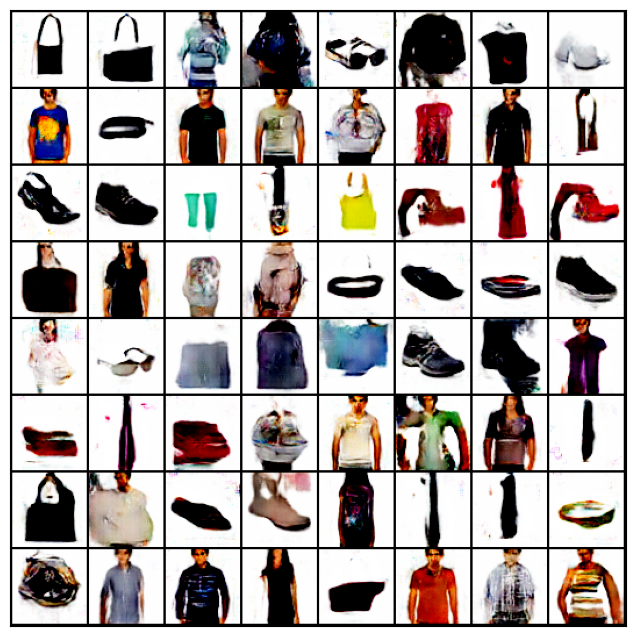

In [4]:
import os
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
from torchvision.utils import make_grid, save_image
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import torch.nn.functional as F

# Define constants
DATA_DIR = './fashion-product-images-small'
image_size = 64
batch_size = 128
latent_size = 128
lr = 0.00005
epochs = 50  # Number of additional epochs
clip_value = 0.01
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

# Data transformations
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))
train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

# Show images helper functions
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

# Device configuration
def get_default_device():
    return torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def to_device(data, device):
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        return len(self.dl)

device = get_default_device()
train_dl = DeviceDataLoader(train_dl, device)

# WGAN Discriminator
discriminator = nn.Sequential(
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    nn.Flatten()
)
discriminator = to_device(discriminator, device)

# WGAN Generator
generator = nn.Sequential(
    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
)
generator = to_device(generator, device)

# Load the pre-trained weights from the .pth files
generator.load_state_dict(torch.load('G_epoch_50.pth', map_location=device))
discriminator.load_state_dict(torch.load('D_epoch_50.pth', map_location=device))

# Save sample images
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

save_samples(0, fixed_latent)

# Training functions
def train_discriminator(real_images, opt_d):
    opt_d.zero_grad()
    real_preds = discriminator(real_images)
    real_loss = -torch.mean(real_preds)
    real_score = torch.mean(real_preds).item()
    
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    fake_preds = discriminator(fake_images)
    fake_loss = torch.mean(fake_preds)
    fake_score = torch.mean(fake_preds).item()
    
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    
    # Clip weights of discriminator
    for p in discriminator.parameters():
        p.data.clamp_(-clip_value, clip_value)
    
    return loss.item(), real_score, fake_score

def train_generator(opt_g):
    opt_g.zero_grad()
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    preds = discriminator(fake_images)
    loss = -torch.mean(preds)
    loss.backward()
    opt_g.step()
    return loss.item()

def fit(epochs, lr, start_idx=50, save_interval=25):
    torch.cuda.empty_cache()
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    opt_d = optim.RMSprop(discriminator.parameters(), lr=lr)
    opt_g = optim.RMSprop(generator.parameters(), lr=lr)
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            loss_g = train_generator(opt_g)
        
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        print(f"Epoch [{epoch+start_idx+1}/{epochs+start_idx}], loss_g: {loss_g:.4f}, loss_d: {loss_d:.4f}, real_score: {real_score:.4f}, fake_score: {fake_score:.4f}")
        save_samples(epoch+start_idx+1, fixed_latent, show=False)
        
        if (epoch + 1) % save_interval == 0:
            torch.save(generator.state_dict(), f'G_epoch_{epoch+start_idx+1}.pth')
            torch.save(discriminator.state_dict(), f'D_epoch_{epoch+start_idx+1}.pth')
    
    return losses_g, losses_d, real_scores, fake_scores

# Continue training the WGAN
additional_epochs = 1950  # For example, train for 1000 more epochs
history = fit(additional_epochs, lr)
